In [1]:
%matplotlib notebook

In [2]:
!pip install seaborn

In [3]:
!pip install unidecode

In [4]:

import time
import requests

In [5]:
from googleplaces import GooglePlaces, types, lang
from unidecode import unidecode 

In [6]:
# Dependencies
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy as np
import requests
import json
import csv
import gmaps

# Google API Key
from config import gkey
from pprint import pprint
#gkey

In [7]:
#Read LA county house price list
house_p_df = pd.read_csv("res_la_house_price.csv")
#house_p_df.head()
#house_p_df.rename(columns={"CountyName":"county"})
house_p_df.head()
#new_county=[]
#for row in house_p_df:
  #  print(row["CountyName"])
    #new_county.append(row) 
    


,RegionID,RegionName,State,Metro,CountyName,2018-05
0,12447,Los Angeles,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,714700
1,46298,Long Beach,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,633200
2,45457,Glendale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,927000
3,5534,Lancaster,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,279200
4,40227,Palmdale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,309700


In [8]:
house_p_df.count()

RegionID      113
RegionName    113
State         113
Metro         113
CountyName    113
2018-05       113
dtype: int64

house_p_df=house_p_df.loc[house_p_df['RegionName'].isin(['Pasadena','Cerritos','Torrance'])]
house_p_df

In [9]:
#Read LA county lat and long csv file
la_long_df = pd.read_csv("zip_codes_states_LA_COUNTY.csv")
la_long_df.head()

,zip_code,latitude,longitude,RegionName,State,CountyName
0,90001,33.973951,-118.248405,Los Angeles,CA,Los Angeles
1,90002,33.950514,-118.245855,Los Angeles,CA,Los Angeles
2,90003,33.949164,-118.273156,Los Angeles,CA,Los Angeles
3,90004,33.786594,-118.298662,Los Angeles,CA,Los Angeles
4,90005,33.786594,-118.298662,Los Angeles,CA,Los Angeles


In [10]:
la_long_df=la_long_df.dropna()
la_long_df.count()

zip_code      528
latitude      528
longitude     528
RegionName    528
State         528
CountyName    528
dtype: int64

In [11]:
# find the closest restaurant of each type to coordinates

base_url = "https://maps.googleapis.com/maps/api/place/nearbysearch/json"
params = {
    # "location": "33.786594,-118.298662",  # zip_code 90001 coords,
    "rankby": "distance",
    "type": "restaurant",
    "keyword":"organic",
    "key": gkey,
}

res_name=[]
#RegionName=[]
res_address=[]
res_level=[]
res_rating=[]
res_location=[]
#lat=[]
#lon=[]

compond_list={"Resturant name":res_name,
           #   "lat" :lat,
           #   "lon" :lon,
              "Location":res_location,
              "Address" :res_address,
              "Price level":res_level,
              "Rating":res_rating }
# use iterrows to iterate through pandas dataframe
for index, row in la_long_df.iterrows():

    # get restaurant type from df
    #restr_type = row['ethnicity']
    lat=row['latitude']
    lon=row['longitude']
   # RegionName=row['RegionName']
    # add keyword to params dict
    params['location'] =f'{lat},{lon}'

    # assemble url and make API request
    print(f"Retrieving Results for Index {index}: {lat},{lon}")
    response = requests.get(base_url, params=params).json()
  #  results = response.get('results')
    #print(results)
    
    # extract first result and use pd.set_value to insert into dataframe
    results = response.get('results')
    pprint(results)
    for x in range(20):
        if (results):
       
            restr = response['results'][x]
          ##  print(f"Closest {lat},{lon} restaurant is {restr.get('name', 'Unknown')}.")
            la_long_df.loc[index, 'name'] = restr.get('name', '')
            res_name.append(restr.get('name', ''))
           # lat.append(str(lat))
           # lon.append(str(lon))
            la_long_df.loc[index, 'address'] = restr.get('vicinity', '')
            res_address.append(restr.get('vicinity', ''))
            la_long_df.loc[index, 'price_level'] = restr.get('price_level', '')
            res_level.append(restr.get('price_level', ''))
            res_location.append(restr.get('geometry','location'))
            la_long_df.loc[index, 'rating'] = restr.get('rating', '')
            res_rating.append(restr.get('rating', ''))
        else:
            print("No results for " + lat+lon)
            print("------------")
#print(compond_list)      

Retrieving Results for Index 0: 33.973951,-118.248405
[{'geometry': {'location': {'lat': 34.0427223, 'lng': -118.2529723},
               'viewport': {'northeast': {'lat': 34.04412892989271,
                                          'lng': -118.2516763201073},
                            'southwest': {'lat': 34.04142927010727,
                                          'lng': -118.2543759798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'f1de9f4a1efebc3606ebac7086ee924c844c9d4f',
  'name': 'Wild Living Foods',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105216799928654181072/photos">sitosnilloc</a>'],
              'photo_reference': 'CmRaAAAAxJLs3XraAsncDojF11pQBkIFakQRp3Fz1AZiRKe99GgzinkLU7nWSUyFH9n7XSo-fkMRalZmMCFXzIUGZhx1NnMJQ4yv-vJHX-iDAqcmDwwkwbqzeiDa7SAhF4wQYG6FEhA8iIwVsaPHOEupCCEsv9uNG

[{'geometry': {'location': {'lat': 33.9888277, 'lng': -118.3340017},
               'viewport': {'northeast': {'lat': 33.99026077989273,
                                          'lng': -118.3326526201072},
                            'southwest': {'lat': 33.98756112010729,
                                          'lng': -118.3353522798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bb2d61cc6f1163163009062bb95ce6afa4b8fb4d',
  'name': 'Mr. Wisdom Organic Health Food Hare Krishna',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 648,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113616406047891300708/photos">Mcclendon '
                                    'Tessa</a>'],
              'photo_reference': 'CmRaAAAASh1taJNfHvHeJZ1UU4kAHXfK6yD6530LdyRhN5BZdn3JPJRWqIj-EgG8eSFQrcnrEVc18pjMem90pZMkNeEFt1S2_Mc9vOniNwKHVOhO8YZDeJ0MVNtbPqm1vQ-iGEc6EhA3NqUtWcZ

Retrieving Results for Index 2: 33.949164,-118.273156
[{'geometry': {'location': {'lat': 33.9888277, 'lng': -118.3340017},
               'viewport': {'northeast': {'lat': 33.99026077989273,
                                          'lng': -118.3326526201072},
                            'southwest': {'lat': 33.98756112010729,
                                          'lng': -118.3353522798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bb2d61cc6f1163163009062bb95ce6afa4b8fb4d',
  'name': 'Mr. Wisdom Organic Health Food Hare Krishna',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 648,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113616406047891300708/photos">Mcclendon '
                                    'Tessa</a>'],
              'photo_reference': 'CmRaAAAAwzOy3wB6Ll6Ndzhr7OXQSsagkNad-AH0nx-YwE4ynB6zx0dtT2oELcVJCbx7kVIswRKmBOsY0eCMCy5BC2x6B

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAv6UmCwe1affdBiEK5vjxxSVX1aWFA0LmZKy0_TCq2vkdQZILrmy-vkE7iVk8w9AnjgVJ6Fdej83z6Us_471NIk9jp_OucS7PxwznDljypXzwEJcYv5whP1x52taSNbBgEhDa0i_Dl2SaM7Tx64XVguM4GhQCBuh1aHLge7-pp8SeU

Retrieving Results for Index 4: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA23h-dPoVydn-_I038VfzwNl-AmeSZaC-wMSclSS0OaL2NSBz5AxgPCfrTYVUU2K6W9j0Z8FaNoNBz6uO0Ghs8LCF_JGfOVYKsaQKCIZbinLfKsk

  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIUnWQNwyucpVUx8YiHcCksdRIabtlg6M8A9Z9EJKyY-dGR_ImbLY-NcQbiZQx7z3ppqgza4QXGTp0JfG3U3xK6mRRglo0BIO5sZNhwul9webNjvi2tZjvN6o3sheHYv6EhCVjs1nybb3xbpjduo0WE-IGhRqaG4usyDCFl8pJEZ9AS-rfmn4aQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA2FPn2RIDwBAN15LVMw0z2T_Ko3hJTTjTY9bY4lgiuToqhV-bM4Y-yA4gS0uLrOUZ_tuPp0gDaon_XbcsrdbPNng_2fNQARw5KM-jsEXWVX3zkZ7xZqzeKehv67kYW9sHEhCTyPp3sN38gKn9Xibi3Ew5GhSccEbet8tkVqfJe3UIT3CdGPJ0zA',
  'scope': 'GOOGLE',
  'types': ['m

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgTLiPfkRNl_ucrIgAN_Lu0dCf9c-9Yf2Wi-TGaVRiZKAU1rIytdgquZv6r4R-Hooh32574pX5VNiwh_0BKyhrUkQvFrY-Yr9F_4B6TjvDtPedQwFCjTyOJ5r65ZotOC7EhBo-Ec3gjRsqyfyQIFV9RYGGhRRrQSycKq_P5oKvO-8x

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAewhEy-qFMwQgmtF9NKmlEDYrABJo4WXoI_6KmScw8CPjtt0jKRRhN1rJlLGWyHMOyiTQ_e2QQ2dAmamWlyJeSaJUk4Sq8IaVWWK4CJG3HO_M-X0346fTR0Ti4rhJJNQUEhDl6A4Gc0_RBpaFZcmaKI54GhTZYJXhHFyDMeqCSwQ4FtGYoQ_Jzg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA7GJq7UlSZLjoz8p7W44BJsPRlh0TdOIaoY-ABcIuuM_Ra51Bs6n3iagF8q5haKa3lRiV2sU4ghH8uZ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZSZuIBEPWaaOAnHLtZ5BhXtNowGOwrpOU226X5m8RzsqSLPU1IU8oVqjNCfadFm1figI-r_lyl_U71s665TcBvsrrB5l3c5BfvNibNx5mIfFr1jRt_Q9VdZqUOlCilxcEhAZpxYAWKS8Lj-pqcJQhzmcGhRdU9q2xdL18lfRvGoTR

                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAjDDhgS3ku-jq1n2YE2teOTJn_wNQTaEzUDU60a-ijBcFdYNUL2dzB8HX59b_zHtRu17j4XNsMS0m9rl4ZlJpe0wo7B1V3eOp3parAn3hsuIJHaykCbq7Q86LRGS5kXnGEhBDB7FzQu5HxPcp-vPYVkECGhRh9YVWO-BzMiTmIvF-TOHSc27Xsg',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+2

[{'geometry': {'location': {'lat': 34.0427223, 'lng': -118.2529723},
               'viewport': {'northeast': {'lat': 34.04412892989271,
                                          'lng': -118.2516763201073},
                            'southwest': {'lat': 34.04142927010727,
                                          'lng': -118.2543759798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'f1de9f4a1efebc3606ebac7086ee924c844c9d4f',
  'name': 'Wild Living Foods',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105216799928654181072/photos">sitosnilloc</a>'],
              'photo_reference': 'CmRaAAAAV7c5boeOU5jZI7Mzcx7a0fFesOZgI3wSh8JoSvldd7tLZSxoaK9hJE2oSEMXEVCGScFTpg0-ttZBSd5DYFxG6QRY2-W-hwhXVLxIeV8O7LyDZE9eARjKYUQGT5qUqUXAEhCw4OR7P-vQWxum-VoUSVszGhTj1UitA7H5hHH3t0lb9iQ5JMN6ig',
              'width':

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZbNiZ7T0p-y-4bJph10Q1lGSL2SDyX-mWt3fHdxeOVUBzFRCN9JIg-9INb7FgFZtJ9cKAX8KHNyyaaipjpjRGI4EVCKotSgDjn0Uy0RY-B0dca_1ZHWwcpEsMVtFQSSUEhDp4Gl_A5ny-DtUdYI08vuZGhRhNaMMGQ8LwaUYHvAzF

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAXmgf3vkXsvLZFF9ewvJxQIVtVynrw79N52LXaF7poXuW-uKHGOAiovdOGOAXZSO9Z1Te53b109lGFmKP03BPaRjUYucUBhsDB85RUiVdFvaof97LbOLiQJA1h46jzYugEhC33-tlMAEqQUXz2Z_z_oByGhTSxWWCgWTekerKkBevUU1W_82DvQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 12: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.

Retrieving Results for Index 13: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3PR4PW7zXPxdtjn2rsFsNNSnfM55JVr7TCLEHOnDX4C3HlMCRObQKAiftndSf_mNrhg2gRNb3_LjrYW4xsRuxtGwMy1D1tfsjJ0E5opaIJxaey

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAgFBtwYADa8NVp6wI_j8uhSgQAWgGlXwYWytjV5K8ohd-4G7G4S2DddkK21kw9XjeCzCvZkoeXuNAawh6_C_ziNsbYK1ooUZ8z8OibRoJHr_zZjqMGSvKNhmCPOHUjXGaEhDiPi1Sgo5Zho3ZNRwPuZd1GhTItt28i4CK24X_uBkdyOKer5FVeA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAphRc4c2q6-pMjJ88eWZx7D5INiaYPD1iNhp6gIeIxeKgX5TuMzxNvtRtwPEpxk1qaqErfYShI-H1EwFFKLrvSFZnMcUV5OyWtVYRAIsbzsE-pryN39Vnu8-dzWYtQd51EhCYVlGAGKmrcMZqyLEXlCRdGhShvG5JDbxdHY3rpuIQ7

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAPfG_JnRoYWK7mbVcYON2ty1uSxHfnXyFkxrq2W-5L-xvX3BGB-YbGT7QmSFSu8BKp3cXRuqlnZdo6Z2HdaRp574qfvRNcjHgpwfJ-htrJta9okYIpmSw7XTBooFrumSXEhAnX2Mb-8kG1k1ysix5BcpFGhS3jZfxpM2dCkYCrkDx9BtLva1KKA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAfsoDmd3duT_nvMHnxZnxhqXh-bA8tl6g5QU43wLWkSBAyXv4BeGhjuM07SXtg5SqYGKedZDoukieLMCezrhFjsbyqAzoNF4Yicztm6wQypIA6opKf5OF62JaHqhlrxnkEhD3g9LtSFdZLlo3VmjXe35LGhTBLM5lFXQhvPt4DFR-2iZVX53HbA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEFGdlW5SzitQ0QrkloiTmxxJGI64ndY_AIXoXlKg1KFVui9e39b7deKC0FNp_MFlIJUNaQhwRd5cOBM1nvVO2SecrJJnVL7V4jMblP0oqNSedmZ77z4LLrpG-2fiZT-QEhDshQ10tqqyZKEKP85q88FKGhTaIYdYfIW9O_T92SlQy

  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAv4_uTw7sNllh8c0x3n81AiSahHw5pqGKnhHv2lHc_po9WQ4XKL5uQmLfJbOEBNhyq15m0stE4cI0uZWpRQDgSlAmcDuqKT1CbQ86yM7wspbw85_5ZTBqeuJ0ErtHoIS5EhB8W_h8ULjTBthuhhADM5vwGhTB7CFay6FEMhWBIJg122E76IVI7A',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAegGKGFKQ2ujB7Y_E8Akke2Osfi9vqHNkza8CrFC2ngdfBIug37P9fe2Ke5xonVf8uhzIrdMnhJgXT1o0vSew0MvOmpyduyYQu61hRgWKd45PCGRdQU8xmFDjabjyKLXAEhBIxiEow94eBJpZ_eT8qsBaGhQhJpnUkGeXFOXYa_vk_8qTSuGNvw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],

            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 19: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a

Retrieving Results for Index 20: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-nLakIVeAMWbXc9KwlVjVmgtk_CSOK-GgytwSGHBEnOGA_Ob1v3DUpUUDPeaRdNAgLvATBzXLPZSC9WiHW2jyYCNKhOWtsISRc9c0WKtPOu5m7

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2xsouWhWpmxzHsJjf0dJRGqP9

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAadIEgJZfXBBr2kVt5tQ2ehwNG9I1BYEgUVlhf-wrE5LNhlNvTN5qNqmmm1EZh2QB4mOeqHA_sgK14vz3tAgriSFOo_-jbJsNk-SKul0mg4RII5L3SFBxtC5RGsMUgg6_EhAJev6fPhq3MU2mKFIk86jSGhThmbcycCDOL14em

               'viewport': {'northeast': {'lat': 34.08357422989272,
                                          'lng': -118.3753151701073},
                            'southwest': {'lat': 34.08087457010728,
                                          'lng': -118.3780148298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '3f61502d3c8680eb052d6be5f18cf8e34dc19e20',
  'name': 'Beaming Organic Superfood Cafe West Hollywood',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 5312,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111186656750394597309/photos">Susana '
                                    'Banana</a>'],
              'photo_reference': 'CmRaAAAAGcp8g7P6PkDdCWpsEkecldsyw3dx_XMO3h9Pkpws3Jnv6XbH7m-31eyDrvEkriRinZLQMo2vgrt7fgMZVPz9TdJ6Rnj2dYecVmwAIMDQzAIodtRB-mfkh0Z8g6QqwfkkEhCxW7M6FgtPTG4VLdzKLQ7eGhTM6m1KFhHLYde7E5UtuukQoca26Q',
              'width': 2988}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgQwTSkdjD9z8cSPIwafssTZ5BUocS36gZaNWUE_-31sBnrEhXB3e3Cpn-Ss2j2DEl7eEh8zUWxTU8XUxWEihD0JauG9KYzfHMSIylFowpsiBwQBLIGC3gPJcgqv-KXS6EhAQEg-MJMkOn-xQVljvcEtQGhQmZ8MjpwHvkp_8_EBf1

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAA2CZtqY3r9E6vS2RvyJbbtU9fycyHJkVTXgpNdFS5bCI5LFCDkUGeIKnLDgbpc7zMfXeNVAMVX19G06zJ5-1aJREauVIqN-8DCABI_l760K3-SZDbSQWbqPYq_msHvJhwEhALVg4IWLTsSuf8b7XFwogGGhRIn_qn2JI1WfYJWLa7RWveX6OMtA',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA31cKQSJfBj6hn5nCgHWZ4JrdxF2dbNLAtVwZzKTToKy9jx4ktCrtti2vBZnLP2RRl5QN4hPrWyyxNdHrEnY6pCZyJf0GOOjpxAPD4rGuWzBY0b92hbdwEFXZM0L8gbShEhDKODoBxBR_6zSMdglU4JwPGhSxGiHYNkJkIjE3qku8u

               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAARfDCCn1WSneM-aYwx92Fr68oOAinBv1GWzjHrsWXOtalkx2IfhUFJsjVU--h4Eug9VaW7P7WDqmw0tDaCfDcM0zp4UuaXECgPXljmTYgzlOnairFVl9d3m0SqoAqzX5gEhDcE1cgkrKyAJLTgPeV271LGhTZU_uXLisBx289nckpNnQ3c7hywA',
              'width'

  'place_id': 'ChIJ1ya8UqC-woAR5MCk-2AWfbA',
  'plus_code': {'compound_code': '3JR5+8X West Hollywood, Central LA, CA',
                'global_code': '85633JR5+8X'},
  'price_level': 1,
  'rating': 4.5,
  'reference': 'CmRbAAAA3pdSnuRrpPmG0htiIi2QiubAaRvJiPcll5D7zBYLnYBwAT0wD2tSf5Dh_qv35Zyjc4knoWvooiXHFj3hF9WyWrkY6aa-o0y_8NTajTJPqDAGQ1teNuM9EpMMuPU79pUdEhCSK_cmi38JJkbHQ4cSOUmZGhRYryP3PhryuXela9Q4bo-wuLnuuQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '9107 Sunset Blvd, West Hollywood'}]
Retrieving Results for Index 28: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gs

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3nVJaWIfj-J4darH4P5zG0R-5Y6Up8PSTiBffqf6qWdSJWh_-1sFl2SDjQ7pHNDpNFvFjebgane31V2DsP94INPTUI627Ns99FCGf93-lmVKmavKJ2c7wmpyR2flBk5FEhBe_SF2oDXMo0Pp01-lAsk9GhSfIzKRAc67iwb7g7q8j

  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAhzYCzFF7F8Y9mon0GmtJtE7YznP1P8QHkz8lr3GAJvKPH76nfVm3mHKoo5BCbaKe-Rs-_btv-wD0rSnp0tN_iprtAjTZWXMkZ8lxHc9EFYURl-mg73E6OESTI16y-1b9EhCWmTJ1qVpdheC3WWI8-RfZGhQBoTeDrbY_h-dQkpA0ibWWPEiK-w',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAk1lGryYAmPuIN4odlRwpKe7ei1zdco60EzgVthZ4Z_q273k0BvKHfFWv5KW2fssYEN2WOMxDuLwVhPMmkZohZJsu5GnFELpaB1esYHKD0QBAQfd0DrHYXyQT-Z_6HxfUEhBX182o2vbwXV4geSNRyURLGhRpstbgDfry-XL_nYFyt

              'photo_reference': 'CmRaAAAAbjgD2rI1n80bnlqKRmdB2mVx5Jpczqg2LmY212jLmtukcDHSduH433P0NN6nLtTxo1PSRf1BIKQVrzGsi7l8XB5LUGaETPKIhh1MVxesLze93VUiIP9Y5mC48Za9pItBEhCfGnoZYN9jLbnL4yxuvbgPGhRHh70rv78uaDp_hfoTjUB6tPuQzQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAL4oYE0JWktdVydF9EK2eNdAx8NQ1a5yEhPJ-Sjoa2LkV3VLNVlPg-Zx2dAAZqQmPe-QWceLTunjzfU6srMhQjKN2ikwdJyApWiV4ynsnz02rSGg4tOeXKBfNHUCsoqqQEhDw-s8x8vz66zwxb5QLvYCuGhR-r7Qq-m2h78CciyXIJbHW6uHbsw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAN_ogxxLXEflItwaVmVOWLcM9Xj2Z216VtKhnDNPShQylvuIamTcD_-tTvq9l0vqc6xCM-jXpCHIaYrbyCwS9TmbaQRUqGjEpRxISoGFMMIJaBIehX1AHfQSLao2OfkAEEhBPbcikaaiizS1eSGV-yxxTGhSk2pZEV5tCwFYnjvFN6

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA0vqGCKuytkV_iIZVcAIKs40O623NnMV0fxgncEaLOhFYb75wQ314jhWSb0J0Bz3hFERXbhJ9MHzqUgVUm5EAYojrpR-1nzKhsKXj0uC7gd_cvqqOn5OvhKikob1sFWX7EhBxlYTjbrmRkdG_-v-uGZigGhQAxHeseyAN-P_Gh0nSEtgweDJGuw',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAnJvzA7YgBGkUiirf-wS0oQPiUfTWwlJahs3Q7jS4FIuHOO0-mitq1nMJLs6bIv1Fwhh4Qv3Fpfe9sPyQgyDCDwUp5l8nOhWFm_aye3vHmTWAfcuXsHe6XNKgjCIngop7EhDF9SehZfLfIm8skzPRY0k4GhQ63XMATaHbs3lj1HAgBX1fX8ntyQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Bl

            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 35: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATEaoXr1D4-vREGy6lsSyGIvcdJgUhlLg

Retrieving Results for Index 36: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEZQoW_-OLM5x3XDbwvw16ii9bhBn7pbWIwC4vsc7tZfttcsTPp1-EBCEfPhwCgY5kUq8R0tiLxn6ln1dr6gJPiN5JqJF9Nvj1knR1SeZe0su14

  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVzTH1h02Ia5VA-sYTvM8JVlBx55_Jfrvyz8ltzAllkTkt3aix8i2U-_-rIObImAmX34yso6RHfUQx6panbVR4S1qF1jW5CDUEeRxetiQKOGcYTfE8gDeIUM2pAVuwEN

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMvmGWFp3EPrUh02NwaerltOsMcQgOKURiOhRjNSiRbZ5-XUjeD9gzf4FYhPGUhztDYfdW3ct3bR7_K4b5HJetTW_ZFig1JyqgaHe5JPja9SRP04m19sfKuA3GRXu63-7EhABfP4k_vN5wnB6Z4II1qaqGhTjGI-UntzJfgsj1odEE

  'reference': 'CmRbAAAAGHV_wLi0VnqfnlQ4XSsj7uC403roR29C22U5T5mSq8dSr_fu9WYPgGqH5Va1xZxWLqwjkuMgJggyh1A2x6m247Fb0eM_db9oQkLU0dK_rlBijtM1CaD3ksYLZlanc0zrEhBvrWUvbgBxNzR4FDnZWwdXGhQFB9GJ8lRfdTBEBFb4rJtJO4TjUw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                     

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5bZfudr6LKAHvs45jziV28_PAYmyKa1iA54lm6_zh_KzuOf7E3g9tM-6OSDrnpgjeHeAL952QHTTMBaVuCOHSY0pVzAipswrO0sz1NAZ48FF8YeU5uRohjymznc7U_wUEhDOpqVU2UP2FqdcNiAm5kTkGhTZe8mcyQKmQAVKIc1uV

  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAbKwnuAC0VchA9LDRjIYBQxkenlCt-tmQZ9uthMsWEbAI3PxuMiHfB6ZA3bV6Ptve1r5aiFXAQrip-fBGSwcmDF9dIMCouXPdxZmMRFUcCQC82hjrt7itr

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAl15A3dlBYf95UlI7f6XBmM1gs0iPFsJjeSApOjshw-oc9A4wDSEsgyQEpR3ZetScOH52_vtuiDqS0Uf_kyHmitMxarrMiMzsnuVveB90i26w_VPKnyKHh-SuvPtUFf0EhCbvVBY1EcIq7BsPnBxrgaIGhQKM5orPApsKNbBKbHIZ

  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': '

              'photo_reference': 'CmRaAAAAVRwFs0bBl9B9tViZgUYvxGRgUkF3vQ8sitUFphQKreNuM_B_9pZ7SYqOMH_XrN_6mR5myyRlc_Lujno8X-B6V2Apou2lngUwDV2XNQe5vRQlxxBxwrRjAmMjZNNb2hXCEhC1L4ZbgovGWI4TR0iq1FQiGhSV9FEsEjx-viT6kD14EBjBPM3lzg',
              'width': 4032}],
  'place_id': 'ChIJSawNy7y-woARHnuQTZxYiD8',
  'plus_code': {'compound_code': '3JR9+HH West Hollywood, Central LA, CA',
                'global_code': '85633JR9+HH'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAk6JV7CL2F020h2WScItR7h5pKO09jKXfI-p7j6mIdZK0gjSCBhgDCEixXoUu3VO-H9e-yoOmjatdg7EIgAskyhjF8t3gQBnXbXGCm3A0_CJM0wTm9mpbRYbXRjQ3DWUyEhDvaw4OCqzPsucgz5xME3RSGhRODondpxXRTomvrEuPG3771dSu0w',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '8720 Sunset Blvd, West Hollywood'}]
Retrieving Results for Index 44: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1ZcczVZnLNfm8VeuPFl8jic46tSbSYQ7Mwi1pmk26Pozysg4oGbi8Gt6TxpqtSzXr87S6coowN8bL0jDm8hbKhnutzaUyA0AWdYCi6A8BdeTYPEg9FvABhoIYsKG7PbxEhCVrNNQhGzIS7UNTSu4u4WOGhSkXrB0KgTgGxgOM1Ouq

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAABfIfF3gX0pyVkYioukN-6rk0iWP3YWDvQy6G_vYmfvJIGKvMjOGtNW5oytz4tiw5uRmiBCk0n_TrzD2vsRU73fhlwue0qzibCITqkuX61P9CeH7I7lngwXRi2dWkJTPDEhBrB-Z4T45ayLFpKTcJkzasGhSd2HaM5WZ8P-uSZqtd7TI-sIbjDA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAHvPXcTdEOVCFXzPreavEBiIoqUzxWQsOVnVSoeC73lgOvg0aSYjf6PbGajQc5czX_hOm9UxH4af9vL5SHq4_olPyMJPPYYdw10fQWvUaLGB2SLWZXh3TpBDnNOBCSyGiEhBWWQMoijqdsXznfNM92HZGGhT_OeTICeu2nKQU1nkti

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAddL6uMrKimX8ejq8zYnDuwz6xsvwIamQNjmom6qGx1Y6z-NjViPk49lWwYBRncc942CtUtXpxnLS82BgoZnG2EEZZYIwzzu7nZZxYXVe4vs5XdVRimao3_sx9WXQytl_EhBGOXakFZWKkdVbMKHoVslYGhRoLJN358DoLbb5RfNfC3BwZag0uA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAROJZv2cN2rMdokg_AQliJg-BekfoAzSJbJAGFXRssagJJa4YN0PJzIBtwV9Z8RQ5ca1Xax_OfCvFOxptSefPt_rtdAtLkDqS7c9ESRn4ePUd91aSJyJkIQzQHd1cFiWOEhAqSx8gOSeQn8Isa4Tmq2VGGhSO9WBe0P-veyYrRxcel4vRNkVTaQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8WnJ3gApICZv9tb4RTBMwwDZT4EVf-VMPGg_b9k2DiB5MpZPpS71pja4OIS3VCO4P7aPf8GO41uTh2goe_Wa0fm6VMZEIYyjYVEeqSLIWowypz_MVzBPvEqWs182193REhBKIqELB9841kZCH03JWK1bGhS_G4wfhjgKePA08fEAU

Retrieving Results for Index 50: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWCvgYMSDuCf5EWgdtMgAGuAiobC-FsyuR0S2bsMLuNLgzi4gLPaFqhS4p8rRN0iSjjCB8UHdr0NtrCwBSMmTAU3tUy5-FKXDIk2vru3XPV3AaA

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 51: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                      

Retrieving Results for Index 52: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARrBIUTReHYIi3xBTbRiW3-xazpu80X3ELlKPROcT7TozcfZz6iSWc3Ya04e8nwPD2ZhhE1t_iAIdVil88fRtVdxaAjqzbIfZjSqIvISTn-Qvdh

  'reference': 'CmRbAAAAkQK6JVKVZ5miA1pkrSj-c66MnO0qEFE69o9bqFWCf76tB66ArRV9eEWwWPvfzYI2gEPmYjN_E69xRVbULh0RPB1gALLsyFnTQMx1p4PRJxd7LPFH0vtaumtIPEdcCoY1EhBIBx2aC-BeqCc2M7-VEzj3GhSeUn8UowgQfohpEfWykeY28PCvDg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWOYOymoR2bysxziaOTYZP9IxfjBh4n_A5k4wYy_eF5Ji5P2q2xVUxEVpEKLEpovb04XQoKHvjmFHkWDWx5iILb0QlNTcCnOel1gI_H7fnPkCxpZvRefg4OqHT_D62Ps9EhCyzAiKWuKzRBhDYGObkMV9GhQXuGuhr5nSIVNiBEtMl

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAHRjIOArqgIG8xbKeEIZIhw5rEF9VX2F9-zs1JcE8bbsBSc5mWqhpjxSOVeiyLgNQyJ06IMARyVaEw80LDtUWzpA_iUgy0t1n5P0X2hc4u99GLzKxxQTFzJLKAWDxOEUeEhCyd-GLh5uiqvqgQ3lMUzqgGhQz6FUNxCMJVAeRk8du1Dj4i4Do6g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfDFp8dNAR_LRr-TNqlXDjIF24TR7v5P8CxaEv1hTULWpPOeidv98lmj4mnDuS4YTaCkE6OiI4wLXIXDyFZSmRAmTLTdE_T6t0t5EGBpb-5TnqjVxJtVJAUxPhZQ-RJFcEhDj8-5qRDCULZddY-S6Xu3iGhS7QJUpA-fAKObULV-Km

  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA1cXG8o_9JOQ14zLPmvTsIrC4arWFT--1nWcGInoI6jJdNTk9NW8i6wmIjCriWo9ab6NKDrL90lpeVDL2WOFXIlOqtrXEZT1CC000xxa9dM6u9bjoc_LCTx89ySIKCEj_EhB9R73w8g35dZ9AyFC2BX-1GhRv0QkWp9hEpO-F89ehpBdj4wRCOQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Orga

[{'geometry': {'location': {'lat': 33.9633419, 'lng': -118.3515974},
               'viewport': {'northeast': {'lat': 33.96469042989272,
                                          'lng': -118.3504117201073},
                            'southwest': {'lat': 33.96199077010728,
                                          'lng': -118.3531113798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fd511bc18b283b04d8d37009eb55055088a01a35',
  'name': 'Stuff I Eat',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103926579013957734815/photos">Ankur '
                                    'Lad</a>'],
              'photo_reference': 'CmRaAAAAcAo4eckwtqFECNluPE8Gl6FgEuSC4NphX87JiDEJPpEcfkrJjalnJYmKmsGDjWfjy_1nSUvJaRnuXJvt2CntCW7krgvfd98dsVRDG-JTpJl4ZxA7H59F8fCNHq0-r1E-EhBXTtU5xjfAwHrfpREuBjz8GhRZ0VPojxUtk7dJjAgEAf9

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWNGCTlNsKM3GhcTgW_hMbQR9-FPizTyZe8Tp7oqkkZdC74o7gBUMZ5Z8bAF6Div3iTNHY4SaqLJZLx_w8vJDitC54gOHPA2qZDo9-VrQMYv7KJS4miKI1j0sfoNODmM1EhCXv0elK8Uf-PCqvoqPBrsbGhScCR_9k6kdJjf0PpQmd

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFz0ZbaK3k7EP4I8gID9mJQcxykvDjpvQqu0AUZRolxb1mF3K92wQD2nNaPf3ZHnKDWq4HepNKE46eIOKdTP8KCG9zxAJ2gViHfTyk8eXk-EQWRoz94o2MvIm0YrbI7uREhCk3bsRgSCwdL7W5nOTn_ocGhTdEJRMk_Gj_4B5M-1VoGUNkslTSg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAy1xlFpW7FlE-8fc2eihXql3FleZP3xHr0ynt0AwixGlkAYnDZrSRIwbOXBgDYHm8QvGc0I2DHKbIzYr5NeOyxaqmoEh5j3Y3DpDpwrHV54mSrha6nIrnb8np0syDsr2wEhDiU01GeobpM7AqJEr-85l8GhS48BF1JznBW5Uhbez884zTPlsrmA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArxDsUfgMStACO-UtmO-PPXg7yo99mP0fr5OIJ0XauC3q8n8_vf-6kn8wwTNPAJ9iMKMSNj5sCXoYA_dW_jO_T4iAki0R8S69pBfiZGecmo321BSrdUt8xqMYhsBBXLoiEhBF0sK0daI96SqMzF_BnuQhGhSI7t8TiEijgEISdQCuG

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAeG_UrZ9RDe0gBOcQJcA6FgBcC5lOCTNtFV1mtduhxLp0oAWbHTjEs4ae1izEEarJ1y7LIMizRZwnnCIOz4V9PlOlbnVKLMHPcWBOY8AUqr0qjagEeYQ1KUWiMg6VEykzEhBDmtrSXeecLL8JBVNRk40FGhT8jEfltoZkHS9qvIzqYlj5XtJmpg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1gWkYB3TlMmIBDW7j52TiKXJeL5zUp7ywJeB8jhE7HB1bSKTPv-_tIVFtUEHBrNVNOH_Yd2HNWF-YHmaj7HyFi3a58CC9cMDZmlxE8O9pqjpZ69ocQgw9gqEH80EbdvaEhAZndKbRQad5XDndW3ox-YZGhRbheBjFobjBmdc8O75n

  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAe4ZtwCTYavIbpAoVsNfwEecG3htOvIU18NUX2t7WLoogWwn7v4S5py5oxZ8I91D5udqNjP25pi9DxOVXfwGyV3cCxPtGYWM0SWkWzjb3RyhMauuF76kA3bDLF3qaXhLiEhBxcoq2NvgAyovHh1KYhYKbGhTzGBWwczw7Syqx6S1fEo-53BRnzQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMbsJ1N63rHogSY9AhBAmKIZ08dpP3nDKYNcFHFo5NYmZzh9IXPj7P5p_5OPAwkhl2FY86HC3AS2klQ2wsou7w0k8lUxbLAiQIvulUKASCQ879jjtbSuc4b4L5y9vyS9kEhDoHQUSlbKstQKWj6PdNozSGhRx7xQkiPOxD9gQdiUQl

              'photo_reference': 'CmRaAAAAnOnBMHVlKT9Nu7qph8GSG0EAhb1E4jHAtTUXEblWW5Eo1EjFE79aAj1RGvr8rWHhCM_bZM-NMnNUfyTvYy5KozavmISIrTXYBdVVHB98H5NECGze-81JaIph7skj8jdlEhBfYIwTOWb012JRDh1lKoLKGhSlYQ0JnPVC3DRoui0azd2TVrbKuQ',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAqsfVzITpt1Xo9X8OZaoKSb485sDwZ_8SsuyLaoASrNcJjZgXzFX-mf4XCZ-vV8i4Mii-gaWePL00N4ne2a1wkVQGz-S82iGtZWrLP9_-qS33lBxIJOm9thNSZSsvIxCIEhBRU8UZ3N9cpwEYrkJvKBFTGhQ4BIWkNdU8MBnssk5rOeLKz_j6Aw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.493

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9H1nY6aU504BApAAsPuT__5cSDn-a_qIWf_V6L7Hg33JQDMKBAmO3XYSqkF8l8qsfWb2eSCzX-TKpTU1ub2s6SVg4p-dQKdFIIUb6lw_53jJT5IhJAUhKEKSR3WSmKtkEhDZqUH3_lS-zfT5D5RBO33CGhSe3BAC98L3RQEe1ZQ7Q

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAA1NFqAIcV34MsQpPO-ORNU2-CPvi0rL9yA7_FRxgO5W-Eo87dnABBOmmKoP3v1lP4YC-5cl3exgnvl4-hfDWQPhP-hEuYwNRiH60KuQOrxmu8F0Wqy8rEL_f9GTfjn3IvEhADiSSbNJ0rJ2sf9qtzpY-IGhSdBHmDUGO74q3fzDp3UzsJH19UPQ',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAALzwNQMxDaFGbaBsW7emdgNxtDwzuJ_8OGSJ4qI_gJHexOcyV7SpYAfCgs5t2PF_rF8J_Q0RwveTFIL3wZRllLEyEusUWWDxTHMhg4MNKhmCE5r74rU9MgCUz9hJn6tpcEhC4Nx9fT1ACLSKrXYX7mVaXGhTq9PQm-GRawinQ0TLNwT36qENRWg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blv

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFP7Xihc5Swplfe03kTQXR0JVjVU-CFA6Lfy8uvCDiy7C2FAUcLNFJCLk6jXybzZOyJoaXfCSGN-AE3QRlrRwUXnllvwduhC9reDTK4Q54gVfMybwXVR7agVyxGDV6t1REhBbPja0QYij0LWeDen-CYa9GhQ28YXjy6fkEPfnYdlwVPieizQ

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAfWPG9Dum1x5jrz40SQwIIfbbi3Ek-sWBK7v2oTV3lgqc3IY-iDK99gPPO578luMpGjuZhIrI7wFRYVJH3eDc4aR83H6hoJI623ScQCEtPGmOahJJsbJQAc0G40Dfb5OFEhBvsZ3ZtUAjf8XFAhZuJuGgGhRRb6PyvEMjj5t2gOc-k

  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAANEJkoWd_Om8RF7vY869oKwjgcK66ufQ2h3QEcDJUJ3UufkkBxYJZ-nKx0ggXT1Qk-jHRzu13UJds7eTrPbErrrnH0F5a_uX44UssYsNtYbudcdoPmqQfclT

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5Cr0YEEt0BOSeuB8IRFp4Qd601Rm74dttTsDA6o-rQPN7yTUh_6ODjQsUJRkS9KA7X81WjjZZR6LPhsDbnrNj0jZXNGmY-5LL6fq-4PGehtLXMiqI6NwlyeoXFMtS2dCEhDBu4DmA38YoHi4paK0bBUuGhSo7KwQSUxLr9EYhcQqU

  'reference': 'CmRbAAAAHcy7Je7oFl5UTtietcxp2ilJ10aQqSRHu-EpMA63n8KzLTvRmp9lI4G2M1wEtk83xhTxaapcqzhv9V1WLUWadhaSqJKmdz-SxPYomWhaf-VEpAxumMDDa6RESRcgcETLEhCnprSjdv1iDJM2HlZDlL6pGhQlgJTtdjgW6LpGIdgxlZbqPQKkTQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqgNQKMJG3b-ptU9oZebA_ezJ65lbTVvmtnEg9zAi0zNt5Jg68u1dOtrFtEDf08u70pnfaA2vK5dDSKQTdyBkxJfxSSzTekkwlWSb2rlp2rTccWOxOPpjZjQm8IukPtjPEhB7gsOLkUYe1NVzbOYOpPnvGhTMblN0S2rz0D5I11djh

  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAj9iOyrATAiod5jIP_QgcppT9ZaahF5TnCHxYFgoF4wVjFsYXvl_iPTw6jzrcwLtixF_G7U_mG0JcEfHlNBQl5TCWZrZcoEAro1ie-w1ltdOHMagDUyLnO4HKaduOdVMoEhDGE3vPV7Ff_XnB6EHcEP7VGhTfKL8C8EWoUI2VeoGOjPNKDZIHZA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
 

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdJcrf3Tbx_GqfCMlwCP7HU4BcnHEmUY5hahXnzaPo8ukJF26QYlLN8rPwdPo-eOCITTm8nUwEO_xP4fIPanhqkvH6xqLXXSG0TW4omb193CR9H83IAJ7vmQBpyvdsXxjEhBkl94JqMrHQ0fZXjPturwtGhTD8PREl8fKrrvJaoMrJgny7Knwlg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA6bX1J-T1wM_P51LXqf5uAkYvadWRNnSgvvU_D0Qj3P9EjlNyURI-aXT1woyQ4t7snuA4sl_6sFJ8Bo-9QVsgDd2

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXJd_S9duhx6Oq62NCKXrn7rbeOoZVUsOStzOb3lNHd2U84SYz5QMQw7kVGfXKOZclIUSRcyabFFAQJKR34XpRhh4U2fACg-Y36jbJiOjo-J3RdGhl_2app4oHVBx6jJtEhDvC2ZfwuPR8ObkkAqYftVhGhSuZR5CfADIPG3ympac2

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAq3fcxiEoZroZ3xVrGL9Wf7FW0XAWglMQhAcKOd0IVLK0IjGbLW-flvOIPrsW3mtS6S3hdWxzYwBDgX5ozkLXQ9cImUFcnAQbSbT335L6BJHH7BeqimjwFHmV71hRHt92EhC31hC0RhE37EBnwxOkKMxHGhQrs9Ogv1cXGo7x5rNoW_eJkmvxwg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA_TqmUv

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKi8ONzvk3R_ojjKV3jjWuUwuLQ62ZwcyQ7sxycTU4zaVv80Jwf1zu7o5R0yZJHJIqhoGYm9tQ8qEaEhOitKjIZo4GNAbvYxOtdQv6DA1j7ZFadRLH9u9FAYtR4aj_z71EhCVnFyrd-cGf8wOlknPK_l-GhQ9k0ifPJlQMb6kKLo3S

                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAxUT8m5HXKZe3MtFTnpi1JK9JNIbf_H2HDhS0vMf-M-Us-IIbQazPJFJSRAL8p-7yUWWAZBWsAeNh8qft43MvrythNz83lW0V0wTkOKgt9LQPKnlEQbf7uOO_Ey7M5kxUEhB8KxebFCxlsdexehdeEr6pGhRnauT2U_rusdjOE9uBxQEisyVauA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnRHVWDDSsepXnJpljrfkyRJlb-1WQi24LSf6V5PyeTAXa7PfqajwijpNKmxK_Z7TxG9qa8U2EO5gIXNYegsKe8Zp60NX_xnjtr4rPvBtd31BNg57Fp81ErVg20Nxh9p8EhCE-mIthYLlbiIEUF2yS_CkGhSaqh7yls0bBfdHPpSO9

Retrieving Results for Index 82: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_5Br7HzTBGTZUm6WCTfaVurBxw0YVJiIYTxmSXJ1_QWz86iJml4ZeQ9CQ-HtBenOa4ESL7rYztnnklT6juQPj750LAv4TTGJI9ugWtwIoQylDu

              'photo_reference': 'CmRaAAAAKGxTcLm-XlWZVzTdxi2-o9l0BQ-aVyokqZAQdZVBmQQJE612pv4YnJ1VG3Y_4E5tK1McFfbu25iI9V_BRRy9s5ZgIKhAJbTZtkCS_IPlQPZGPFUhYaU1jh72TC7jKRYxEhAkhfWemaxnIKzzQu8uQ_WVGhRgZ5RYV7ZYVLBSzdtTBYAJ9dKxjA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAjlY5OJoVb5mqSYoD2JVkvyt_vABekcWoiuDvLvGDfehRq5jNliN2jNHqEuH4KqFSpysW2VU3oymxSkdfGu4w0Hfw6kOp-JcCKbmrcvzgtfWN0iDG9Oh5GZ0hMM9vCZrZEhBXhTef6tVEdj_s-wyIKFBnGhRTwhbpT5UOUOR-gCEJ6fycLuI-2w',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 83: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUnmA_qve9EoMhzN3UeUenj3sQ85OJEvZzNKMD7AjBfZanMg9ifFmg78bPSOCUF4f23dw-ucZJ3DmN5tikz0nRLldJOHCmBkGXOhfY_-9XoMGNTirjtwTROuCVl4kOkjZEhCvQ2KPy7lOtxdZjHJ-b2fJGhRjtuDFxgF0FE29DKGL1

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAE6gaUKysX2_Ar3U0wV1HxQJgt09c2ksAgU6lyJ2BbK3yQDlq6yKEW0hB6s9I-2wOAMs26DGFgOr2Y8QqvreY7qpJQ4r0Utf6jEbDkZFOiR7uuhS8ut5I1FdorYmu1_RLEhBlLBdqPgRExWyTjE4QiM1DGhTG2LVZ9oGf535QCNOD_KCkwhTSrQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAASaMG6y67KwKg6KH7sheIQf8Vc6ygw4Aadbp4Fo5QFo5Cn_cN-wL0u1OLf_0y5XBt_YXD67O27y5VTwEgKDliOaYmZCZT9tcUMMg28O7O4HdTarrLXMP2ei9XR-tq0QafEhCzCqnWgRIIAwipHCB0UNqaGhT9dpBHPpuPu358NwvxSDnFnpJLfQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKuG4F_ipkg4aSKpHR7Xvc4g0xg6NCfZfVbvew1nnTmKOHC5yP5QoyyvqNGYdvLpr0bIP1fg9Q6ZS_DDXz_rI0eBCxhAZdQbQRn2aPbUaGtouylEDK3rOzMFIOsqsyk3eEhBeyc6kkMFcLSD7yzbIFYTkGhTqmE-W8qarIV1z-9hVN

  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAA41ZXmtwbwafys3PgSRAV1YOJUsMAv4xbNNPIYsaOR54ZEAXMnX7IcbJHlNBn9vNhpKbgR7mI8E4W4y84dLPFRGrfzM7_XPYpATMhx-BaOkRUKVm7e34gU-nbzES2bR1hEhAQ0N_oMSMDR6_CumWUCqnfGhQSkECWiF6hWr21OFGu5HgAEOKQ8g',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA1ApKwDea8eVySO4_DD8Z1PeA5uMEvPD5mduud0ZYjyQzlib_xmBQa4buIk3p6ZLBcg9jBc-380iQsyVSVHig51kInBc_IF8YxJghyiKuUO3lLdQwx2sZ7WbXkWw-KHqTEhAdISEFt5hyQ3cOnRSKOM2AGhS3G_12GdY_YI6Y2Q-8dpJBI10dPQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interes

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATnXa3voDZaZvH3-HJW-vaNESlrUNsYrihI2l8SVoqp7Kf9z2SbylCKjW1iAXZsJzuNUQfZxJJ7jXYcpmKSWt2nSxNAWPCLfsnrT7JjkklZ0Ab2-OlbzrfQq9vY0J0K4HEhAuNkbl1YuACz4S5ggbpsrTGhTafLQp67GRHWxSUB0qv

  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA0iVUJNLTgLgzdNUbC47vNyV2_iKMsow5DB_rdzqYBN3GMaGdzjzgVvFGExxie8GlBHGhX6U3gSTCRUrF0cIGtvAlbzQ8cG5i92AP-mfb_QLmhysck2_nQU7wsL2MfUdLEhD2ljejVMJnnHKUoVvxPElEGhSEtTmfEyI3THfpatesViLrwE7piA',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAADl3QAQxE0SmIYs_AEsx058FjccGPUtivSAWFf6hS2VfbGf-jtOU8F_Ne24ABnOiTvGKALFV1NGfUxPkVm4ZsaIhBbdJkGy5xN4dQF8EuEVjlnp8dv88mR880JdrBplID

  'reference': 'CmRbAAAALrvdix2Ih9sI0_ln8mJflySR0OHJE3Jds1x1MSUGmXONJUtR0XoxGlB7sba5N7LfGxd7QKILbXVSu0OU2vBJQPv7WGN-3qSWFEaFmFy2fEs603-47DECJvxqrBnM7C3UEhBQwBjBhFElgPFi3G60CmAcGhSlriq4fDVBGXXTgR2sI7utfWC7Xw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 90: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0uTKvzXhlMdx9D1ruvMRL_sZjZ8QZW3VS_L0PKVKohgJM1GXCTEW4xpVk2dzD2YyQIMnp2910XmecWAjdrxAuKBYPV_owHYP7Ysj3C_3mcKDj93i4X2ptgoog92PZOOtEhC3M6db8pTrtjnjTgU8Xx4-GhRQlmHNCFzRwc2Nlw1fP

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAD3Ew7Jjf7AF_pRQRDRWohESBaX_3YYUsIT9YNc_LQGo6vT8H4nOKSsSdVdmz4nWL72XT1sn8clgDIwCaYeHifbg1fD9lzPabesW79frCX4MBYwHankSi9oKAVdmDLCeTEhBlkGi4T-jRT2xPQIJAHfrBGhROtigbxEnvyD5uyY2n0qR-xDC_UQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhQyZgsqPNpwXH0nBsogyfvnBmerKP2GNwKol1he5L2PFOT18ZChuifaru-lMV9io4SfHlkjDdzOhYE2NQLn0at7JcLJAShq-bTcNshNYXz5Qf5rs7LZuaf8ar3GE1jPmEhAU5FUlOMejohrF3GvfrzdoGhQS2f3_QeQ7PjryeA7PS

  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAj9o9kdS-vZEFg1aOpovKQwMmZbb8DVs4YHkCxvaKmlFqSVPmSZRxt_R_Tlh_9ikKveiGF8I_Nf4ECp8WYRrEIrTA6yM3GXXRmWQXQsdI6t_CJPOrMOeBiRogJX85KxKEEhC8_9f4HH5F0Jsjd-IcF0F6GhSF5x2WTCeajsm4jKid2xLDvJ2OnA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8EWSlwnScP0FADJI2AdBD5emr1SQiW5SepHwkW2ilTJiyJBfLeFyNv6mehZAZLEiZwC188WEygZLWjInBlcDgRIkFsgua8jjC_eTnsQlZu2quapV5rGzW36rRc99IwiREhAPvz8C1nKVVT3xweh9y0t5GhSBP5VFEHsToe9pXcR8A

              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAxlAsYhYfj1Z1MLuFu1L4DiakoWtoYRAAadkknjlD9ss9Imfo9vb0cQ1zV7pQv2dX1PVc8wBe_DmA0FkyCY500PRp4oowASEwFsfYhH34NkG5eBuclOdYUZCm2XZcXaAQEhAn1nsAsRax9tvo1K5yfVSjGhRqArVtUMiqJgRt-QUAL60Fqwnpcw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJxb7AfNENxKjbx0oOLpkhzsuPu0SmJUYvVgPbh7J94Fps9JWbJbFQcg0IQ5vgnUDAdgMn-YsSGwKZCAJn0d5QB1CUbJq5vI7Ht4H4Ti1zUvNKCeiUhSMvn9SHD21wRsJEhD3xbzlCkaBj1qd56Srd4rAGhQvTgsM7JhjefkZZEfXB

                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAXDswa3e7g1BGwoYU6Po9EkshKo0IKUWxwZb8aE5auO4Une07Ris4wKar0UlsClYF06ii3dOuOIEOXDAOVwndjNXNoxo534GDffLWzBLH0HfhWGvVvCv5_CuKjazwLuv7EhB2g3qIttUfg86rkDoSxi5HGhQPj5ix_FNZSH6uKK6aHvjHuclBBQ',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAtctmThqDE0ZGKycgMs5bXUX0pBO7c5TknoMvHfMdvJNCQLy3M5lIE_3gdOJdlTmaUpf6ejiHsQ2iB1L5yhXP5_KeTdrM2WdbHmnz1aLz5-c4P2su2yan16kiR2eGSWtXEhCpQrdKhzv-z_9XMgF_4Q52GhRTaHntcec-ZGL4QbT73JVa1tW76g',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'locatio

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhyxf4CHZK2IALqeXVIzUgL2iybXjLomofNqysyEzxRqhFwQdmM30s5mYkOnWlGSUDsp38c8lFg5ZjnJ6AOtgElF7r4JiKKzTckJ87BCTJOggbwl6rkXXDHXBd0RzYwstEhAEa2nxs3DAzpyVV_ddW0msGhTD8FRLtBobv-akP5tEHsEEhg-wpg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAKlUlU7geyBD0nNkySswcqdPEf8LYnJ6TR4t7L0oq4L_yYMXcvWROPn-DfGQ5a2wdPP_XIf37NSG7EOK2uky3BQ4aJ7_9J2U3gwIce8CqyZ9IMSOuFKyOUeku_epeFiZTEhDgUtoHSd_4VVlidqBY3aK5GhTQyEXn_3YZdXOcl

               'viewport': {'northeast': {'lat': 34.14008197989272,
                                          'lng': -118.3650787201073},
                            'southwest': {'lat': 34.13738232010728,
                                          'lng': -118.3677783798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'cd0382d419005e56fcf38491538e74f1938f2cd9',
  'name': 'Suncafe previously Sun Power Natural Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116882033601776759389/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRZAAAAp6lfUb3rjDq2xkZCjEIJMH4XYct3EQ9kWPwikJKwCQac3s1pAIFvd_teCXYA5BWfcMYtN_pL2IiRk6NgdnKYY2CpzL_ygM-q3h3lWWRc6yR942STupgbwud71Bc14OtfEhDJXeIPVVk2kdq-hRz4APKvGhTHcpAdTEeSXpikTmNruhV_vDMpYA',
              'width': 302

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5IwV7ji0vyAkqO0vtaceae3MMt2iYiOpmvMxiIJH2CSvlUKOV_m3IeaK0EiwsLI01JiG7E3navKeQ5g5pb_UvJFIEfds6ZNiPQwQt9oXj8QGdd8wIAM7pVZYJ4DH7UPcEhCAGByFhE4qyhSVIcEk3XPBGhR8SoQRV9hh6PC_9y9ab

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAiC_YSSaY-s4Busgt72Td-r2cqL_70ECP-XjTZTcq1q7JQsPQ9BivOkyQrIUV5hFu7SJu9UGajsHx-m5exnFVeah7Bo-99havjubr-JryCBUGZfSpLNp_ohyh9GIM6ZFFEhDm-ar0W_BRhP6MEMUARAiZGhTsgMbvOxm8ZYI3qbc4I0b4pwHF6A',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA0DbvO_hLJkCZYOXanHpIY9UZn2ty2ZV78j2frYVwJX2nlfyOJ6vD18GEa9j6r2ge5R98sifE8Ccqewnbn-mRNtazHAo1Yrzc_iXjzENbDAclFfMrbJGY5qWThWxfLuO0EhD-6XCRtyDaD8C4wi96d-jOGhRBZZNQSmZB5cieniS3v

 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAkhrnMocPdCnvfWVgYAonF7-F9tWtVllSb0xSHNKOFaCpExe2JwKozFH8rYMNj2YyhN50A9WigKeGlrXcej2rYU59H85_glXGhHuTfWB01g5v0z_IHZzgVdZplQRSKbuIEhCuz8j4C

                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnbsWcYNgvIXuo02cekkodX4k3QAQhkjCGEn-e28Egykxz7sU5zq7YelxrwvY3BetQb24y2aNOoEImTcVWn91DPwydrAusLBuH-jSFFFJjYbmODqpHZvOWwfAbrlZxXP7EhDgxLHOVCtGPj5dKye3ZRg8GhQd908LyqzSq2ALWsa2jgHOnW9S2A',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAq1K2N1aAj4ijR_zFw-tkvhWSNTXEjYNMKu31LJCayRkrihVjuNly7y_lVyVfWvkGqq_1IiRbBRpdjpNJq0aFgeWdlUN4GYCTobXnLeOi2CSkeNLeS9FNPbJkMxVroy-UEhCrZbzkzhO5wBy5Q7wbPGZiGhQxJcM35PgXIXgtUPY0NvZ1mDbPrA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vici

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAARlKmYm0UP_Wrr-GDXMOIWYNdP78tk9RtiX4vRzhQMFQkZNMnzYukDqWxnz

              'photo_reference': 'CmRaAAAAH2ar6W_3o0AorWojdqKW0lVFCGCXVAkTaQqlnHzYnVAk3NkO_0PqPgETEQQO_YlfQijGiQfOPm3hT9iUdgh34XUF2XA_FMQwjNjb0Hs3aH5rFDM1yLOheAexOF5GYbVMEhBTOrungOnlhm53SL45sUdPGhR_Q7cOf2HymClxOuWtct4u4Ujkjg',
              'width': 5312}],
  'place_id': 'ChIJpyiWk17DwoARBcWxdZ9woFQ',
  'plus_code': {'compound_code': '4VR9+C7 Pasadena, California',
                'global_code': '85634VR9+C7'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAOH9nk3tV3WD30WFeapS9NDX7zCxS5UWqhSn3co2Z43IWdmO-jjmhSlkbyWVAi7F2lTpWkvP25WFwFEuixBKNK62NJ916NfW2MfpCS5lQQwLRHCw_7v08bmLT38c2RKMzEhDI6XuxGcbk3agqTwGyLChRGhT-6Ecv-0RoamjMJp3dWY-K8901Vg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '899 E Del Mar Blvd, Pasadena'},
 {'geometry': {'location': {'lat': 34.1385838, 'lng': -118.3665381},
               'viewport': {'northeast': {'lat': 34.14010367989273,
                                          'lng': -118.3650899

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAAC-tQEns6hpx-PysbXTBkMrNfyg0yWQiIaNhHzDPfOWi2ArQooOg6E-_H7m

  'reference': 'CmRbAAAAMVHfD8EKqHV2wj68Jfio3cGFO0VwPzo0XjZ126XlWCf-7LiulpcLjiwqer9UiDF36i7Ht0TNZLoE8gP4N6b5IJ-xLQv2Q8uVruDPjaRMM-K9G2cSzE6QbSSPvM4PngiEEhCq08vrm9KEeI4l_svzM6kmGhROhFVRahHOVwAXdTctn4kXsR5zDA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '530 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.1410298, 'lng': -118.1318744},
               'viewport': {'northeast': {'lat': 34.14237962989272,
                                          'lng': -118.1305245701073},
                            'southwest': {'lat': 34.13967997010727,
                                          'lng': -118.1332242298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '18533347b0817335be85b27e191eebf67796b9b8',
  'name': 'Real Food Daily',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2988,
              'html_attributions': ['<a '
                   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALwzNAo2NK5o-eVQUoDZa75FiXDs3wtF_GiH7L9mTvFyuxVMnEPFkAjLLSWBuAjHTvH6QoRThiy8_YBCLBe5S2WylbQL1dqCrMUAj40vekQuyN7zjU-ZGGPGqkfiAxutzEhCj0hMctqYEtoTjHwtI05_bGhRnELqDAAe4zqsYMgvPy

                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAHRGex4Hx7iW1G1q_Dija1z6nx5vnvI-BvY_Apfve1DALoCECdzGTK9FhUCBS1nhwbhydxvoV5cii2_5ON6SNdzK0oQQxeMjXXTuu3C5qzFP1CqBAqEDP_TJ16lf1fYi9EhDTpA4qDpU3Hrsm7fI0Js8zGhRMjjhSs8RgqY-uhxhMeCJY68i37A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photo

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANsI6SzUrAQHSwF7pIog7nh-uD7dSIN7Cel-UNioeyG297Wmk5L3ofFn4dJxSuB3JhKL9JC-KxJp1saOBB153RKMMuxfPKF7djOclc8oT1f6Vb1ZQQbsICWipgOmAEtotEhBFnynd6WXy8ksinM9Fr4bLGhSIZBSK_d_-n5z1hO3UG

  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAx8jt1nsTGXHWbwyR-rY8v_FxhVleJ6rXZkPOpfzk0U-c3CdZSDbF_4X9jxvaTMrwlDmXhqfd2l3RkdBNw3WMnqVLfGog_Eo4hYK0TuD_jz9ALT7FkexrCu-bl1vPbjSLEhDZviSpbEiO8xgrIrigNAErGhRGsyGu5KVD55riwcl4_UX9PJfWHg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sa

                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANv8c_3KJ0ctIbecYfXsQ6VM-EnVrRdDnffOhAjKkXx--Z2Cv9tGgWhPoODuGHb_4Dv1OmCAsfliL3FiTp7oKD6l2ak0joG8cJGXhmx0BlXKUUbiECcnDaJ02Rl8qfYlIEhDIy0ZRk0NQTbxgFcBfp8dVGhT-KFRLbV99PtYFDa1gQj5i2bKl5w',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARzSv31vR-Oi4jBJaKFukvNBNIsHZyzzo4PSj9ptyrsfegyfx5dXHBNcs7x636HBlPUKpK728UaBiRl24lDakDF37hCLf9t_NPcnJIYc7udq1lROVzClD0exsh1NZDKN4EhA403eIMUZYZgBDg4ffj3okGhRrz-EGKD_iVvaXhysP-

                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAd1NVV7oo_JRbzjIzKAmVNjFVEeWWDjZYagYvjiT1xLjZaDtoNLLjgLFNWtC1ehqhbIAS5EnGEQHNdB7B_p0L_HgSlfef_-TUUUzUi_rZABBuUX6mPcQzxa5SX7gxTEKaEhDbBbRGGGkMoEEyfOgFzX-DGhQjhWxGL-LTP3CRY4TV2XREwchkzw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Lo

[{'geometry': {'location': {'lat': 33.9231931, 'lng': -118.1318514},
               'viewport': {'northeast': {'lat': 33.92454292989272,
                                          'lng': -118.1305015701073},
                            'southwest': {'lat': 33.92184327010727,
                                          'lng': -118.1332012298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9c20011655c9f396da85b0f3fe6e7d27313bf69c',
  'name': 'Fresh Griller - Downey',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1944,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107950663010553167272/photos">Sergio '
                                    'Ponce</a>'],
              'photo_reference': 'CmRaAAAAhT9BSZhZ39Wn1BlU_qCGG0geLJBLDpuV3uAHD8JHPdW4KAmvUH60-sCaluNqq3dP9qZrAe73fAVF-ZNQh5rcR7cOFC1M_-OeXmrqoLTYst1-ZFMrLlHO2pxWDDuIvZ87EhCsnDRSVBiRaXUbHAoFInglGhR_Br5ZOW

  'opening_hours': {'open_now': True},
  'photos': [{'height': 1000,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105825564512335869776/photos">Nicholas '
                                    'Skinner</a>'],
              'photo_reference': 'CmRaAAAATfhEN-_OXemOqBs0upgyidJlGgHg1Ad15EyQewA28jpA9t540rk-zvgysVHGx3gkdDmIOLqRCXw9TOWGXUzaX1z8ac66k-F5cac6QPSbu2TJ7B5ulH_fcRMeJNT625uuEhCldnxtXC6Y0CWJQ7Iu9lFXGhS_8Hy4taJSed3zRz2kTF8S1gJ1zQ',
              'width': 1200}],
  'place_id': 'ChIJD6YsPj66woARJF7FqKDHY9Y',
  'plus_code': {'compound_code': '2H4Q+J4 Culver City, California',
                'global_code': '85632H4Q+J4'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA-sO0zlSTsKmttqRufnPZjVaKV7-5fnKhbTHS0MvcqtZBN4GCjrOGFxns2vrqiSvu1vW-tSt44MjUIvEnvJK4Q79kMRhGCdt7Ta4e3Ou9NWwB4_WvfJt59K95CsK8PUHIEhAgr1VxW3O3u2LoVke4006oGhR3pUo1-u98n2peQkbUR72RfRDD7g',
  'scope': 'GOOGLE',
  'types': ['store',
          

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIaEzf_hZo2NCg30zhgopSx6-i_IjDu9L5C67-XgN0f4nhXFwQntq0lUQYtCRd0-5cO9qYcTU2Aot4yryISC4x7LsjIbCDRB6_ILtuHcGeDVBRXa3I3RUuYQlYmKMEgAuEhCNc24g2dws3A5CjgyutFxaGhS5EU2U3ZL-iriJZvxWS

Retrieving Results for Index 121: 33.888315000000006,-118.29525600000001
[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_refere

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAA5euuzq3gfsHhGL0QcyDImBGRxYTmh4rUar8j3guCAFqhQw-tHj5xevNRwA

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAAYo3P8JDorzadHYa1-4fmL_aW3J5pLjnfTPbbInzH-O92NjX0di2j529oZX

               'viewport': {'northeast': {'lat': 34.09287967989272,
                                          'lng': -118.3796998701073},
                            'southwest': {'lat': 34.09018002010728,
                                          'lng': -118.3823995298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9c7efbffa8bbce752faa25b4300ef5dae92df5bd',
  'name': 'Tocaya Organica',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112435068535378263563/photos">Berrin '
                                    'Yavuzer</a>'],
              'photo_reference': 'CmRaAAAAs7O8d1unPrWzZAle-I7ryJfMDE2vZPsuYqHm2hPkOa9tZ9Qqm2ma7b7UI4pjMmKrZY4wwo-CFUE7p1dt--fk-60raRUlNBJXMTrszINifCqtuLuSIF79w475WWwBYmzvEhB6a4xuhxLbmn9UHCOvjEefGhQA61ZxfGtncKab-l5cGO4BOLs3yQ',
              'width': 4032}],
  'place_id': 'ChIJS

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAihecKVgL-su94MD9pYMtGdaZPBzIW8Jt7q0fVU8vIrdBi8aZzSGmtLJ42qMDvURXwzm6xSDJN-uUz4l90DiQaiMk3yGkqWDn4FteDITzJei37AfdKKowjmCrYPB_ZbEDEhCDEiX_tFbCzZY815OWgviaGhSDx2DvQlmqNJ1OjfJiF

                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAm0Bm4n5FBeGRSAB62fBGNodPpVjY9R9og3iDbQtSRGm2UlLRTAWso3GI7svAq8PBIy_aRnQKq9kilDzE1V5KvVjisl4Fg0LlQV21upndi5xx36VB2u1EwrripXZhmr77EhB3vz7vKfVGMp-fljBI_cULGhTQsCkV3AkfK9jpHAF2TKyVsJJ2Sg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Lo

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAhu5JyHWGepepLnIxxasxPB2CzUc6LB9gPoIZ6ZIufyK5XC-aNjZRetdpspQ830ZzDP7tAAKuW6VmZLomYixA-WfABPO83QEATGAjx-vDN86o9XkiBT0KovvDpiVz1MJGEhDMYopfbHbcdSSpta8H4a-wGhRaqGH8QBx2oIQsk

Retrieving Results for Index 128: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVrpZNeI1CbD4O_fTHyvlAU4crIGv3LDzEnhGzeeo6Ma_en8McP6DqY8Ty_FN9vQH1HYsn5GaKjgtBPYTR1kR5VZ0O0F1sLgEV2NXK3dUi5_Lm

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzgJ0k2xvX_eu8e3vAN1rX9nGpo_DL8V_wJQIydO6jbuhTIoEP9AvjBXKVbaCJaPqp0OOwLLT78JhmhcQJkRtEzPOUOCxYmxTWMUfpyP_GC57h3eukYPTQNA9Um4QYK17EhB0GrjQFnC7WCiJ0bRX85i7GhREzUIFBNbAG2BpWMKQ6

                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA0D5jG0mnJRBqkVzVDah17u_CtQkvlO9-12bekLJHBTfaFHvOOTUw30uoA_4DiG_mRZ-b_HFzjQfmsggI8Gb1sRAQyXC12-x7UHS8ElxPxNRTZB43nBv_xsAqEWXKpiJOEhAHBCNH0rSuCBHPvd1XjHHIGhSGcZw7Eevu8GCouz1HtepCH8tsvg',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code'

  'plus_code': {'compound_code': '4JQM+C9 Los Angeles, California',
                'global_code': '85634JQM+C9'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAYvBvTGXDGbRJrwTnLzbC1HKkr0xOxEW-74PnTbBxn4gAv-jRQfELfG1P6hAl6Hp9e6JAOtWsx91FVPmZ2dUi-cP1BEJcvqKi-Uy6hRYKDPO6Us_qPpRVqm3GeJmHVnz8EhB372s9J5N8g8QceD8FrCKNGhTj7NClmaJQ1SdtT542uYUVoQCmLQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '10820 Ventura Blvd, Studio City'}]
Retrieving Results for Index 131: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAuq-Gq8FHCtxXnbOliIFigFK1uI5PVChD_iwpODF-gzrAco0gjJS6hV465Zww-Rbm1nl3kKhkadHV-hCF8rcoF4cgk8wXJQcE6YmzhtR9qg7gfdaUizAO0VUuIlMeT4WREhBaW52-6ZCDcs1nM_AeFtDpGhT2eJ1WywDP9Gq2_DVXU

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAATn5SUoOj9SY4Rga28FIoPkjO4eDy4ok6R6sxl7a94O8G1cqlY7MDi7TKZAE4mmfYbqw413fT8WVKxTXIyKzITFFRXRRc7vVtY6pXmkFNuEq9CXjMChV1hLl4Pg_NlzCkEhBfaBu9hGemcAihX-6ATAKcGhRTJShMrA1LaifLR-FImJxGyELEwQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbwWBKy7opJzQyrNPQyeUEC0BQ7PQKAdb64h6DBb7CwoMlHtQyr9-W5-xogKKqg2Y-IuBLpUPN3rcvwqsCDxUVkXrWWxHQwjlhsZXTXe_5OUdHP2xQl1wDpSnedNwVTGNEhD5_WMDtC0mQfh_MwdIPMetGhQtiji6wTht2Y81JyQs5

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAhdkpcThk3Ut-l9wU5dEley8p8TF001t8-tH4MchrRxSPhX_XYk9vw6ZoiHl6HeW4yoG8hIrsllxt27U-omui1gZTb6oPZEzULazFkZnji00ca-vEE14D_Rt5h6-S92HSEhAkzuVJNz6u4wirLfdFXKIrGhQ91XtHte8NY1-HjIpZH0zQHhhcHA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAO15ptYHxcgor-9gRiRXnSOeGx3yyiQv23qAaBEXz-UJQTwZ2aNFA9-ZN8BLpyOjID36oKWVtUQzZwIHwg4qQ4EV3UYCFDSh53a6vfAtH0D6ANpujm_f6o709_9u6JpysEhBjW9kDNOrD0zpu__LKkXWkGhQewAVW2LVUb5JNN

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAxi09mwfxpfvqmAqPLthuC3LhUt7kPZozzPNdxUkxhddO_n9cLSjLfYBW_swHLeQ-vErdWroYxPWPeuBRuTyfK67ALCP5zUCIoH_cLB_RmVEdMSpSjqaJQOLzR6mT1ohxEhDLTq_m_t4l90d1Xm9X3qgCGhRrMtoZU47Fhvuo78xOn

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVC1ecxH5U-dlI_Oxeh_ZDEyNhc3uZbRRKYAdAdJw_xlgSce9ZzBJwd_aI20MBj1Nzp6obm5V78jztq-VKbXw4XLSwWKlJcRrPBMTdoowYhWJhbn5-HroJ_AoLTb6zxCKEhAHr9mu6DknV_4wDW2qEZkyGhQNQuKQSklVqf2PKhEz7

  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAx-oxLUZ3Nr27InrzvV1hnZaONJjDWUQyR97G-YUMh9wUn9oGI_Si85WpCnZ3Pg_JFqZRogVv46jkGImCtjcLLpxTWCK61w9JbTdlDE_Z_knLoK0bzm56qhyAbPYxRvxLEhC1a2JtMD5HR0G7GOUW5gscGhSGuc9aK5pxnwxomFtxHAHLuou6tQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867cc

                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAxdm_Mk5D-axWGi-mVafgcHXX1hROjbpsfORULM0H9mZ1gUaSStY-iXFzVaR54y-DL23gapLP1PN7_yERbIUm5DVc3cv19oG6GACmuaWxzhWf5-J4ftoREN8HSm1KXwjmEhCZGim2X1iSU-havdD6AVgUGhT5BvZ-Fsk6kwTS95lyZjxDRE9elw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price

[{'geometry': {'location': {'lat': 34.045623, 'lng': -118.2324544},
               'viewport': {'northeast': {'lat': 34.04683972989272,
                                          'lng': -118.2312061701073},
                            'southwest': {'lat': 34.04414007010728,
                                          'lng': -118.2339058298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'e6079b87496017dd25767531fa2d499d00319ad7',
  'name': 'Café Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3511,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115281941221017080792/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAnySBudDbJaEMCGUqyA-UD3BRtsdZslWEbnKkqIlWZzyK4_YBaW0YenNXJ9-AdIfGAVLVJvdTfVP-LMQEXLwnYhiiI01cyJco6PBVCUoRs-tI_s_Y3y32iwkVxfvF2-QCEhCRojQDpXW8THztbmKoAOK3GhT-KNZl2Re_KKRcf

                            'southwest': {'lat': 34.14192532010728,
                                          'lng': -118.0331094798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '69a6913b0c893d47614fe1d27038152f4b105d4b',
  'name': 'Natural Selection',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/110665377055352815017/photos">Artwon '
                                    'Nowtra</a>'],
              'photo_reference': 'CmRaAAAAGvel7QQ938EXfG5Ix56ctaOUYP-MLUOElgkkJg1Zr3RUmVPwsPNwF9NavIo6T-amKxJbZd-XanFXNQyJAT8oiXQ5VWr-2Juck4zlZNw8t57f4I_06XofdGa7tK6u98q7EhCUan549sdkm_Hht4ETo9N3GhSyhaI5cNyTbZzTK6cdrhubzZnuFw',
              'width': 4032}],
  'place_id': 'ChIJ-1tVkujbwoARk3yBHdbpnMw',
  'plus_code': {'compound_code': '4XV9+86 Arcadia, California',
                'global_code': '85634XV9+86'},
 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAE4XkJH1WONTvDHsp3MycVhklFXucaV2g6NziQjUq7Lx-W2NSI3U3FjBt5TilbXW7tHTTHuz7XPGF8a1HL4-sobRkvFLcnIpla8642ZLZQUYo0Qt4A9Z2rRqwlQAyzd-mEhAQ1YBMfcQfqJ2F0eNsB9hkGhRcE9qdb9kJDZHHZl3P1

  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAqhFzmLcSLYHjMCT6e3pJZ2SD6qpmCfTPv2oZucYJTzSRStrAniQeM6oHldDhZiO_YT01hMOGMpbAE9IX1fXkH6JxOuFthyz5C29ptCqC_OPqsqJ-n6mQrqYJsA5UJUGuEhARf30mYODffEacxb8tovuaGhQ5L6AHYljp9tgl7qxfAvBUA-_a3A',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAPbs_pYXvMKXkclUmT2vXKK9kIfnoBiIfWGnsem4XOo4dRwvgNlKtwR_C2nJb4XZ_579pdpTbbaY4iIiEAwzvP8z89AVcTXTGB4VOqh_JbZ2VP2MjslVDR0KY1icKjv8wEhB5FKDltNNg5ZvTy0Lh99mRGhRkNB7zMVeAFyQczvgnOGhG6ljnmQ',
  'scope': 'GOOGLE',
  'types': ['ca

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXrx-WBGm7L1yDLp5zX81yb8aSVtV37bogFFanBj13tAucQvOKmlmVEhcLHHPBI4JeK5J01OnkD-xoeyFZoUPeraUNSAusV4tSr8m38FafMxCov82QZcnIhf5GcBiLOkqEhD3p2osINZdp4YLh2vvHBhaGhS51ZOdZj6H20C1Vx1fC

Retrieving Results for Index 146: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAums-etnCZz0-g8hZna4VBTZDn4FDg9Reh1nus3cXaiYyW5MYuMDH5Xptl78q_88i8SY6RLLuyIuExEXxoB_izWQoZb5N1LXh07WtkSLzOy3gq

  'rating': 4.3,
  'reference': 'CmRbAAAAve3EVmeJsqF-zXM7OZa-NRK-OLJ33hAtTehhbh0SURVVo-mS9meiCq0f-VtElq-GJqB_vNcP_yXcBp-Zd7QLm7hwwPa-T-HHa5MbeogImB1llGRKfNGEnAyWGpUsGqMdEhDulbIY-c-m3TAjq_drgOYzGhTl1SGA9hUnuBzbFVgDonvdMpY7Gw',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 147: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',

Retrieving Results for Index 148: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5pgKmktwI1aaaIetMrmcmY2TBK_Bc0HNYClSKc2RCDlVdqQyh_BkfMmripQNYAJMnp3cmb_zs9k2q2AoeFxUWiQukY--kdD7QSC-d2pWufqE7

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAyk7luEdQJbplGcyDNKxUCUpuokKOpEjyb8g6kE6iiYgoetnorxtF6Yth76yZCNmgGqIdDlmyABB4WtU2PIroEyTfoO6_Gkimxcp2Khcs7Ep6wa70sm-VXP1NJYSgvrl6EhCE1nvEjhbbVkqsFl5LhEf0GhRTqvVhxqz43QzI5jnY9R97arDRQw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqwHm8gLBDKY1WqXrWDxI5BnrkNykB9gHf8TBARsACIlai2wcq9tUASj9_Js_HQlDbbBZcdZLFe7t2B3GjV8qZu4JX3_p8231Hwum21W4eF7Dic0xWBIy9nYRm9F7LH_zEhD2Om6x81nvfSZIMGJQNEOyGhSTaT058U0T_6qJHjoby

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAzkL8MBzALq-Hr_qRVBSFRu1A5n2O6BpaMTw9EcRtO3m9W6gpVRYgo-xnzNdhLsQeAxkQLUlYpvLT7ivTuYkT6teMwvN9mEycZ7-WZw1XOC3KKnxs0KUbwaCgLqBx6xiQEhDgtehRBK1IWi-0AvRZzprwGhR75DirPOmSs1w_FLiIUnPoSUct1g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIA-FF2PyBI6CE4VyMh2nS77z0kEAic2KFn9kyMcTVyX_zsyI9SgK2sEmgsBMTCR7y2-4PTHFwy3lv0AzCDB99UQwnksCTMdgQKGsX_jevq6U7EiwD8eJs94km1qKFmNKEhCQImGcLFW61-EBTWcrRsn3GhT2lsdx9mfpAKjxCW9Nt

                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAbdVrA1YwygtLyT2cCEv5BE6VlVi9ccKHKPt-jch9bFQ7cwTFwQaY4XjEG71ACf_veDpIUBYsYwo6H5pcPf1o5t-t5I7fdWPUFu1NL5vTIkbjp8RkdeiWyMcZi2Neg60FEhBQybGrEnQq2TfVao2qokCVGhQqkdfnqNZOv1rgDedbEfKJiDVHAg',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAYDVi3Un0QdFljeIS-yHr3r2jPI6c2PRVa0gbTo1-uxD9Olq72jzOGU-97xnlTfxONzv-Ny3Jyzib-htyuq3OL0LM3FqI6TkYTxB9FD98wrwl81weD5l14R7cNxDG9S5vEhD3ZDLAsmIJm5qW2KmX1M3GGhQI7ewvML9lsnosIu-LDN9uuw-WXw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
     

Retrieving Results for Index 154: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAb_3mwcdCD-wqLQ737AsnT7B7P9IrmHlo_s6MtIByC6CMj5X0AsceXsioqozspui5Mu1NqN1thgQv-X32nqmTuhxzOpXryC_F04phtgCZhrU3y

Retrieving Results for Index 155: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAArLZP7e_oFnOpyF_KFL3Y9Xfbltvc5geTddbGs3XzKkiNGiuyQPlD8xxcLp53mXAwKyGfjAiJEiX2RgMNm-P6GyoL124f3QYt0L9oAJ9_4fN32

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAju_JtSHQNDx7QGvZ2vEkkNsOkOM5Z8vD_iHvQWqMGaVgMPS-M3CNVITjoF6danMxtVxnqFrBWKbcFBEIeN4UWFrzF29UEL-nkjxgsWEEIEMFCKzSGfUkoHpNYCAGVzrrEhDlCwxzTVfsth_9hxP0BNjmGhQXR45SR-9jrXkxe6we9gvk5bp

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYpBKMxLdCpKncRE50OUb0Y9pfkxP8ClwqQqWdJsJLu0b2ATeV2Ybr2XSXLBpOOX0b8yXrNkJ3TziM6kgEJU2DyqmoMBvTZlAR_cpsyObibmUiFHexxRlzvnzaNy_4Tb8EhBjzJYU7jyKHtgJr1CAk5TDGhQnyKULBMe_bWCwju93W

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAtqfPj5hYmS1Th3iE-6w8tEtD-lQv9XJw3CboWX

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYf_FPzUtK2J_VkmEK3ZWBkeHzB5APQzERYcASMKKBVcmmOgRXErynFhTv7KM_ImzA0htKULkQSHlj7w-FSfqHYVMxPWfdMdnDglflVVcnllAWKvMdEB_R3Ci-T3QV_BnEhAqv3XJ8yK0L8fvHaL1kNjiGhTgsA6E6sJkXkJi8NNvY

  'rating': 4.5,
  'reference': 'CmRbAAAAWrjx7cYXb_tiehxvuuZg1VLi6orNIGaWpzQK4KBNu1lcY8p6zFfBTVGTGt7KaglOtMIKDsG-2k7-wA47v2Sks_rW5Kv5fvqkfliRyRpRQtgMyeFOAJPyLu7H9G5SmSjeEhA0J8PbbK9T6bfECOK0k25HGhT_3LIIWIhZR_ovnLjdqjTkel2SnA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAf63zvUFOGr-YU4rGn8W7MPZYn5hWtbaRCP9K6pArRYJTp7Q2_qKGxdlCEqVxryOR4V2W1jieemAA_HlmK7xW0SD5-0STykuZ_lYwbhkORIhwNNFvLSavaiNExfl5OV1WEhDNZ4iCEQypftwaWK9W0dqoGhR5N0iUkrhnRAr1fQbvA

                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAo8dhRL6nbkgGOh5wdy3U8P9SSm-_2UkpBjGTQIVm3jACDZCRyIKLdTmPFDPPsfv1McE8hQ52YDBhYZ0JXVlTZVbC4HlHFfvBoMs9hBy4_9wAkTn13Dv3vTMD-kX1mrCCEhBR8K77Rx_ffOMPhPE4hRjuGhTMG7MYFWeiHAs0uMoI7Mto_4vJSg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'op

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8C_KGJhjg7EqFNFxyjj4qPYZLyJdZWZssdLtH7LRICQTtwa1Eelk8TNo9kmZZA_f_sk4h5ApqLl8NRoKW-4oW2KUb6NfkM0gZ3cDipupHW4fFNfxmZaqOC3jQNBh3QEvEhCsUVrnkh8xy0YW6Vu7lt0eGhS5j9857uaa6GNk1geHlOU62ITjUg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA3w_PGVNHQY7qw_7

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAASu7I4Ux89y4nprHbQhYrtwMA4CaVF4ReAn7oJKla7WOS8kjVwIhDqlPRPu3fjGHV_Fvy0OWDhDlXNCXM9amXVXkXl7TNwn62L5X6sHdx6p_197kDFysjaRzWHOijFnwuEhAGIpY6f5osFcYbs3xHvcP3GhSjwS1wAfzoDGSf-XhNJ

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAEMqPYVWSCFWqTjLO_PnogdwrMHeEi11tFgbX33ryY2ppyEwzvb6vXplZnYjfci9gHKYffQCGuWA9JFh1SYFtu9fQUDGn6lM3oVusqrdTKxgHEBhwVVUJthBnKl9z17_vEhDFT9bsInBCiqyLsMR1cypSGhRxFVyTreF3sBLpMmxqBbwK9sJx0g',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8Ar0OeXzB3vk8Gm-QftsTUYU6kd0J8yUVp1LYSooiP9v5qqq7F1JeHzGTjIr2KaOMRZWasfx-B1QIRKRXIzxjVvRVeCMCgFeoAjDsHs1Io2L2O98NguWCQWfkM-1WkywEhDUnWgdCZbwnIHryluC97htGhRvXjxMxqYCfGANw8kri

Retrieving Results for Index 167: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGLJM68PijU4ou-yODzOHPBRkVYVl703pNgrT2dAoM7SQ1XggJg-SEe9-CR14bIIWxdH1p60782VGZSpG1ZKM95uQyxFEgRDW37DW8KZy7VXQd

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdMusBrHrZvcIPKoHitw-LAJ7IxCizR8zGB75nScNlQEe4xZivJibCz9BUFcbYM6HdWc37J8-TJXlU-HZr0nTHsoFSRlOLR5bNrbm8eySoxLd8-lI08WoXHDxZ-STFZZlEhADSuZiCLNzcmIwpniezRHtGhRXOM7fJEorHoA8qCmQB

Retrieving Results for Index 169: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVdnqNcg_Q9yNfMlYyEIWpGnrEg08bns6bqljvqGuylWPdWPvgoNT2FCK3zzbTtz5WCry3nIgPQsJxgo2qrSNEoQpbQN9qVG8RWAtWt1Wj3C2G

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA87h0zLbsWYN5_gbV0UWasHPk1RzrlhHVZgxwj_Xh7U27RgzeHMIavT0BLrHbygWGv3aC4-bogft3eLGPa89nlQq7XgPEoua5eXwDRFfnM2F4hs6wu0b-VgERqw-IYYuFEhDRY6GK1eK6mjP2oddjziHFGhTqZoyD3oYj7xzLdjWZSSEW7YVmIQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAYc0avEw4O4MnK4aJnfrEKHFvqXRlKAy4yNViqrB0-VWAre1Rjj0r4CpKCRYXFQgPEUkrJ38gUBCiBYrBG7ui-8lXt4mFMcTYYhUaVwuRrXzorJjW3bTz5y7pX1LadXQiEhBU5YmjXWqc8VcvP1zAvpiHGhSALi8lL6ctVjWtAFgxeu54Tji3Ww',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 170: 33.786594,-118.29866200000001
[{'geomet

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAH2Q3BoGZ0TRfdlaH7NMjxliYB1iCi8iHnN192QO56nAC6ZxfuNzVEVPMqxI7Cx_WQOmEe012O6MVuojy1g8ZqWHBhVT4AcGJZqKgN3oxW_BMJqtowvaaiFruEmqZw2xEhBhk9gt2tUBoIg2LvrmrO5yGhSfri_grUavr0P8vigTS

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAwtsib27oTzl1twecvp3pqKylZQ5U7q_19fcP6HHrfojhpGsjZzcLwfR0Wfos0A3V4s7CzCxIIbgEDmmUVi5KNFhwJf5PX7ejXr4fGp2ycKv7MBFs9Wjb4GCKNTwBw3gjEhBhjM_eSwgSALa0FyxCQ00MGhQMBJ5uXsJoxN__6CgEoLsD3LpADg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAvG7_-ee9GmRJtTB0QkvOJ8Lzn5Eh_6d3IwM6wz-ejtF4xvntILEmgqXO85F1y38w6ZNZ7bN0LVowX3YpmsMd-f3gCBDe7ILQ0sU5EjOWv8B0dd_vCrAU69Z1E_KtG64YEhDT9SOP8X0wjtds37R4x8AiGhR5I8EuK2geksB5lFEzX5jtAE4wsA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAU11yyxkbDZydsrrPnCALZoWjx3KHaBm5-XtwlqVHeXpVdUDqZuDa6lldNl-C3JcY1saRqV0IEbs2Yxl__-uqraPvcx6yWgI52Wjqifwhs2PsLvg1SXL64iLRyzevEnTlEhB41EaeU8lx1iKa0d1LBGMiGhSIFNVES26p8JynVilLJ

  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAATTGKjj0UKj2KTXaj0XZ0Q2T2qcbvRUSHON5_nUIYRuhRkq1cXY1n3pRMWBtBEenL5i1ZuLSSxBVVKmPXs6pKEfsblfPUy_x2GqwOIjZL_67THxpdZM-8r6Lrr_Pf3Yj6EhDgTh37fjLynxNb0iSoEMHXGhRGeNnViEWJ_Ea7EpdR31NdBCjeYw',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAW9OL3MYXs26aFka9SD2kja7WOoUjpKdf5CwYT0IVbans9kISPMOrQ2eOWWmF9WbWj1jib-C6OBmqmB6b_QK4lUNVKqw2hLgMo1_RvnF3f70jktJikaFf36B4504yqeJdEhAP-RboCb5uTXgLmu8YRKAjGhSo9stkd60CX9_e9bGdaHkIcPN0mg',
  'scope': 'GOOGLE',
  'types': ['ca

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzaSyESyP0Bnx0Vt4sOiLQUV31wqvADVMQHRBJjrtZaXGzw4_hmZG4UNV7EFlX43t5wNclV50BqaeRoB-PzNEv8rKGZMRFQsSp3Wmyvn0ILDnK3FlDoLGZrIDBhQbl9aOEhDwZFZxrqQZURqhN27jBrOvGhSSAr1LXkGCeGvBDvDrx

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAHnOxn9IjCKZ4rUkmpT1m8jnkNKzr_mOFR1q8YqmLq_-3d9fTjWjLDuFwdpdTIixo9c5ngyLpSKRL6Y9_uW7pamxnPOUh-EUhyxZ7UIQYNvDGE8p_qlOci4GDH-66qkLVEhC9jFMNiQZNT5Osr3x8yRUBGhTciqtdqyz6a5Ww8p-vETHGOk-NEQ',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA8EG3RBq8mjbKBGIUPemtbhjzpk7cHjKWo6pmw2Mg-S4IgC9

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAKzWDyPFWeUOxV8tTOMECAZUpefD1YntEYrjjCMPsNoJ4D6dpNOJ7qm3AuExIRJRmSn2W-1vcftC53ZAaPvsYS_2YHVRnwqW-0__JJ68kOHynKbLypFNhwq5ukaRzx22kEhBEI37rECIqFDku00BFOWBxGhSic1jl72-M1cDUj73SSgdnShEymw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '8720 Sunset Blvd, West Hollywood'}]
Retrieving Results for Index 177: 33.833816,-118.293405
[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqoZLrkH7qW7zh1rjYmZXDfctT68n35tNXRRQtndZnS23rNmY5EM2DNQtozpqFj1p0DvtBKVHZxi_dg9XZoEsASNjFQ6xKQLLD816NKGhQQPNkNA0AOBqOaoVrA31u4YQEhD0znX0-Q_FnWNuRPMGxvyjGhSO3VQry5zmytkPs07PB

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAX40SpSMldQNI5PEV7KzBmaf6Q8v2CdEnyytCLWZsYUUslE_Hsag0ycJg5zrt0O5AK3873EPHzMU0bKdEPb4FORHvP1grtcLttrCaMTv7VMziUlm3rLcSW19i6gfS94iPEhBYUxqNrY_p9lSS1JKz_b8kGhTEpu-T3LTJ0hR3UNIjgMDqdM7

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIUaSFcF-24ieZn3qosvWSc-pJ1KJ3r7SJkmJJY0bViOBqq4PuwKcy71pQqWYkXJmL0Cy30e5-ZlvGZA8t_j1-vm54VXw09V5eIdD9v1I8i61NfrfG5OHehrMV4SBn-5yEhAm28wKgSxqJ06BZ9GK3sEVGhTcuSdIJ4xUn5lIPpXF1

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA-2ZWRpw0LYnYwrd4qmV_q1IlAbtaClGqOcJwwk

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAmCyBWSM4OT89UrdtVFFc6tMEVFtWnhXJKEaZtD7xiczl626VmF_yTbGSZMghbBL9KzR5l9gNz-vr7-5chz7BLIn91fcG3UaFkmgxAiZpZ2lzNrsh9bIWjw7DcPj_H7pXEhAdsMXMtbbS04PFEAEC1iTPGhStDjgAdqp5LlZ-vLLYU

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAtwCgYTGtTjADzez_ZkEdtH4N4X_vyqfDnqflp7_vNFM20h3sxspPmF5rcY4mKxOKK6ZSHm8mjLe1Ronm1DN05bM3ElN0pYhRG336UYVk_TQqbMHk_38oz0v-psZ3Cn-nEhBqZwVunIzh_MU6rPqwTyV8GhSyEWBong4Ui52IN7fuQbp4uI_uPA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANkQX3isccnEgFD1EqERzXdAath8rR1xaieOqKP2pIigFXizWeCQrNJpou7DhIk0ClhQ74yEzaxUB672Sbw_3lmFMQNK97VrwH7lfq5xAC5yRnRX9Ws6XxsFwbQRBVPHPEhBT-acD5awG7y8smrJWAfSSGhTga13uPGlrrRPRba2RE

Retrieving Results for Index 185: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAlixeryHZCmHyNpcvEUet8wb9xkI9Oi46Y75oMKcC-ZBsfye9KAugpYHaGBgUrO1__gg4kY8nwICjXizLxovOWXmLpu4l9bxA_Sey1ss8zfBPG

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAuOcpw_cDBoiDGLqwIEmCA5NpUZ-YBI4reOLaJRuHkU0LRsAIvvzX_FVQsjYTz17iWIoYCIkw5URMkOSXo47lc1l3M-wyB-iM9A5zZFjxb7ZUd-pwFZFFRE2b50H3gfJVEhDzSm1zLbkZ8xiqY2zfW4sSGhQvWpa3lSfE_V2jW0phrLMkXRvolQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAA4pLYmV2P_7PFOe

[{'geometry': {'location': {'lat': 33.9770382, 'lng': -118.0375915},
               'viewport': {'northeast': {'lat': 33.97838802989271,
                                          'lng': -118.0361294201073},
                            'southwest': {'lat': 33.97568837010727,
                                          'lng': -118.0388290798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5f7c64db232bf764cc91af07fc6900549c8262d1',
  'name': 'Alka Smoothie',
  'place_id': 'ChIJV1VFa-vTwoAR6_ghPsY7MiA',
  'plus_code': {'compound_code': 'XXG6+RX Whittier, California',
                'global_code': '8553XXG6+RX'},
  'reference': 'CmRbAAAAIyQWuAGzA8LwC3YNf8gXw3f680ZVc-gCxwneSg7bnTPNXhsKNqzz14nEfAd6FqkCPK6d62MGKIBfPMMOE-UDg0ibGVgA3LuNR2pLPhohHSzPWrtLUhHl_DsoNtfyYvPpEhBhtwx2SiIYjqmWdU4N8P0hGhTYX3nX_VQx-ttzD6wOBgtYi5A4JQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '7201 Greenleaf Ave

  'rating': 4.4,
  'reference': 'CmRbAAAAXHohFfotxCrhVKxdafESd-kyqTppfCej64InqLw1EUMokoTwgRw-Dzo5k0a7NsupTQCkvmNd9VdaMvoG17owDX6eFtXtIc8-6FDQr6Cmk9RaxUiE5yQ7vzQicMP0tJipEhDBe8JQEbk3t66ru7oQcTjkGhQ5kRGagtNA_SMlkIRHcYlpOio-_Q',
  'scope': 'GOOGLE',
  'types': ['store',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '604 W Glenoaks Blvd, Glendale'},
 {'geometry': {'location': {'lat': 34.100517, 'lng': -118.32927},
               'viewport': {'northeast': {'lat': 34.10186592989272,
                                          'lng': -118.3280567701073},
                            'southwest': {'lat': 34.09916627010728,
                                          'lng': -118.3307564298928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '6f077e7974b8d7994cdcd190845cb86862e2030c',
  'name': 'The Running Goose- Restaurant and Organic Herb Garden',
  'opening_hours': {'open_now':

[{'geometry': {'location': {'lat': 33.9633171, 'lng': -118.0335383},
               'viewport': {'northeast': {'lat': 33.96466692989272,
                                          'lng': -118.0321884701073},
                            'southwest': {'lat': 33.96196727010727,
                                          'lng': -118.0348881298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': 'ceeee2053c1456d4b4ae7fcfd31779a05c1d2365',
  'name': 'The Bee Hive',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3000,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115638577687843020974/photos">The '
                                    'Bee Hive</a>'],
              'photo_reference': 'CmRaAAAAgDGUf8fh6YeREKYWkNKvvM-wS_2SyUKbpUbaPDCOJ8so-5uPVblS22brCHmikPPVkMeRT1kSi1IpgS1X-osZVXYzewrG4H00VbCNRkjkt_7VmGnQJt3KRYsDeHfrC05hEhAVgZj4tgUuqSgn7_PXLzmPGhQZl0xd8EkBEQb56hH5e4

  'place_id': 'ChIJScER98Exw4ARRV8GLDvCTBE',
  'plus_code': {'compound_code': '37WJ+54 Claremont, California',
                'global_code': '856437WJ+54'},
  'price_level': 1,
  'rating': 3.9,
  'reference': 'CmRbAAAA8nTo0Ba_vxlM01pXGoIq3beTAsYOSCr5hxmJnJEym7V9IymYlPa7mvYeAKzTSGQXRyfuJNguXrrRlX0tn5Wg9pWpNQpFJrixz2He4mzEISdD3OpkZOxfm6-f_cDqYAHuEhBsk7Aalrc7qTWmCPcnOWEaGhTqGsvxz4eKvAj38l-W3Oj4EFAx-w',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '175 N Indian Hill Blvd Suite 102A, Claremont'},
 {'geometry': {'location': {'lat': 33.658027, 'lng': -117.8667349},
               'viewport': {'northeast': {'lat': 33.65893657989272,
                                          'lng': -117.8645177},
                            'southwest': {'lat': 33.65623692010727,
                                          'lng': -117.8685957}}},
  'icon': 'https://maps.gstatic.com/mapf

[{'geometry': {'location': {'lat': 33.9633752, 'lng': -118.0334515},
               'viewport': {'northeast': {'lat': 33.96472502989273,
                                          'lng': -118.0321016701073},
                            'southwest': {'lat': 33.96202537010728,
                                          'lng': -118.0348013298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '37a0a98c64fda37a4f24c54a5693690e75e33f04',
  'name': 'The Bee Hive Market & Deli-Whittier',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 747,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/102083110490691547196/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6QQBs_z1BKGHrdwSIgTrxWZUTH3dxzSKSFCY-K25BlJW4V2_8GWgdPkw0MADLX0IAjiyTWy9zQusXYKqhAIxAEvY8kkzgcMHqM1JrhffygZXwZJstwqJ1bKFFs9uBzDnEhDLVPNpQEAW04tn529G01e

 {'geometry': {'location': {'lat': 34.1592118, 'lng': -118.2672531},
               'viewport': {'northeast': {'lat': 34.16075622989272,
                                          'lng': -118.2658833201073},
                            'southwest': {'lat': 34.15805657010728,
                                          'lng': -118.2685829798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'abd59016cedda70fbd4e1976e8d7d5ea78617fa9',
  'name': 'Green Corner Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101942480276884042928/photos">Green '
                                    'Corner Cafe</a>'],
              'photo_reference': 'CmRaAAAAy7opFom9WVQJRJ4cuWrqnmWIOuZihPDUKaALjkBGeBzS0U-cgYlqZ3YaoygXUTDNHiEN-8fKi5upNmHvKXvS89DUYwGdjgBzTHtC-JcE8mR0Tk48j_wj7xokJ87SvIDJEhA2HdVs1VmCFObyVxfbOaEaGhRRj4bF1F

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAdVm_gDoPA8D4HDVmNrGpZQJbowwcDxx98CX9IAKEnPW_wxHXibIYd1Psckz41w5Hjcj72ClpbKMWepUwgrdR6aj9qybSIAacW8NKU-arlYpjSLWEpnC7WoIsW8_inDHAEhDuoCjxPh_BLyQCVC8vZzBnGhRbPguczNQJa2pJlvLr4

Retrieving Results for Index 194: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQrKpGei3zk6_cQGNAs5jqtEofCQu-6Z9D-dV01mNRfbJgchV5kNMNAfvNxdHAVjh8TeOUgNUPxmBtA5lqZ9t3DmY_nDJIH66ABxV7z1gvAsG3

  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAssui8EiNh-YHh-AfVvaQo010EoQ5v3U7ZuQQXgcFN79cEh1oLHiYRn_ugGTI0HsCIRU6h33h0hb55pvHHVaZULOQgMs-YIjFEoqXHiAGLvPXX9mWofx9x-q-9r8OKAXGEhCLs3T1pMyZVhNoqcvD7dplGhT6C2UfyD2zmkzULNKyPIr9h2sW5Q',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 195: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVYmRJlLqi6mYp4Xn8XM5w2o2pcPsjhiR2LrQIyeLSFe5DlhTJiz1er2f-DbxxGL9VCtHvGygxrpzRw0iTj2KNwae1YfTtYmp025C5U23Q8YTvKmwueYUfXnSupNYUVeVEhCjcmjyy338cLQmlRTRQRiAGhRGqeSkjDVMMsu1kvUWy

              'photo_reference': 'CmRaAAAA1sR8k_I1y6g6zrQIW-SSccZ83s75AhDWQv2Bso-1FZd24pvuxILnI2awS8h5s-gHuuvxGoPBefGkgkeTluawfw0smAgUbK5EihGAg3il6HyvjtjDplo7JzYNqAknWz92EhBXjle6sYbSPKT3TUd-Od-sGhR-BUqfGT8mRbh9R9aBrW-wTlqDiA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAYGuXFrOl7Lqkmjx9HieMMgiLr_6Ez6FaYIHjDm55QgU1pMCmOC6022noOdjNkJ3Xf7Vw3hppbl3GCSSafy7zGji0G5hA3NbbLGrMJP-xotSBGYpkNRe2TRG22U6lODW0EhBXWyqDuCs1h6pF0sYjVqbpGhTKrm06NzOinxf7iPhU69rxAqLUeQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng'

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/109908970663677488235/photos">Sonny '
                                    'Salas</a>'],
              'photo_reference': 'CmRZAAAAFkaPUP-qVFWEyChh85oDrjbrFNt319XIxzomba8pl6Op62TeLCXzdIerPT__D3dOuqlV45_4TKymzVDIsQi3735e574SYg913-jwi6CZgH_Af5oGevLtmNW8sUR1AxwbEhCzQyzx1i86vgFpgQFG1UPnGhTztyaBdQbpLAIHv-wIb3A

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105256432075090877378/photos">Sherri</a>'],
              'photo_reference': 'CmRaAAAAPwi3ijIB1AyyMQZ7cXemA7cFXuEzOCFCxvwokXXJNBiqb9imvhQmyUpmUvxf9qY2B2U5ndmxqAO0TJGgTSF-FO58YX8ZR3oxjF6ozOp-cidkqxY0ykLDW6VKSlxcPdOcEhAygYDiW5Sc47xCGrk8uO0ZGhQ9SY0TrptDg2TU3XF2JBoFEQ6sfA',
              'width': 4032}],
  'place_id': 'ChIJaR1CQObf3IAR-osBOmY1VKg',
  'plus_code': {'compound_code': 'J3GV+7P Newport Beach, California',
                'global_code': '8554J3GV+7P'},
  'rating': 4.4,
  'reference': 'CmRbAAAA7b9Sdoy7WH-5zfKfUm-x74DROoI44qoqhn1HFGJBFiTvOVbEqnZ4_qoQ8ZnED9kSsc0D9ntd51A0MS54b10fctqDpVm1ZMSIm3LZFl1S6_27T-gqc0z3OcWy7S7H4ol9EhCHLnyjUnrwWsDmKZvD8NaNGhTyhvUj6b9LKPCvPfTtIRvdaWrIug',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': 'A, 1617 Westcliff Dr #112, Newport Beach'},
 {'geometry': {'location': {'lat': 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPIDijiZx6XOdH46zqJ0yrbQ_1Pb4OqXdpSC6NIwMloITHAcM7PPp42Jl2c4nFlQJLoEuHImv21lBJ5CuRbjMEyrqZlrd-Sn7Q0FMWMuSLxiENr6GHjTBwi-PC1OMi3PGEhA90VBCMZS1D1RVnW4XgxmaGhTKzDYMk-heS5EmyOhbt

              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAU2uuswW-XqgYhOowaxbsOnFmMsJMvIK5joIBJkbnymXLr4mj8Nvl9I6V3idsplJlNAumhn5olkO9iBw7rT-uZahPJct6nc4bD53o31PbGsTJ18-VdnFklUW5iVIFOe6-EhDzctOK-u8z0zjz1lJPP8KrGhRSJ5O4cP4NVXVs5U1caGRg9gBJCQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATWA_wiFwnJ8qkH__4HdOdGFExeoZ3kcBBxqorWIThiOZ3zdy3mdEsTyM5xJ7gIwfWM_-lEJrCzqbxaPlnmN8D-gKv56WVoniuB3gwNFP721F0nPJayJ8IBCE4SI5u6U_EhD4DC7GFYJjvnYY8WG4PYQqGhTjIuO75BfaDvOJtg-je

              'photo_reference': 'CmRaAAAAUmzjVag-nlK9ix85kybOEsG_mJPnYQORtHNbMkYNLoyBYkXr31DkjonxbROZOyxluAMIt0kccS5vy8LvmJHxiKTT7M1fQDHi_BaQONhSwINjxIc-WbN_K2NL_gt_zxrEEhDd7r37eT4QvnjfNgdp2RfrGhQDv8-KDJKlladJn9qENOr60Np3-g',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAOlRSefiDeItYC5LYAx-ttNSb9YW3uerqs2zuOB9wuScVE4IDEm-Oc2Csiy9u3pTxhF0CRQGVVaj9asTDQg-rhkETjRq_jIFD6jjGz63qm_-T_PKjh0tEp8UF4Q2i-IayEhACN2jyjisrdACgl1TaNHz4GhTV828hDrft3e8oOlBD5PsZ1BBokg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAXYZ-Hv0W5dEM_FW-2fs5UwX1AMYKyKAxtrw069ZYYKTMTaoC0Wolp75rBnLVl26urKjPXnJNwuH58oG7UV-_4pzlM_i-xFMjLJInUiXbq6jsUtZ_VqWHRo99VNG2rpGTEhDkWUrEatI4A9uuNZpPzngjGhTtTIO5YDy0qcYRSd05mzk-36u-mg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.9770382, 'lng': -118.0375915},
               'viewport': {'northeast': {'lat': 33.97838802989271,
                                          'lng': -118.0361294201073},
                            'southwest': {'lat': 33.97568837010727,
                                          'lng': -118.0388290798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5f7c64db232bf764cc91af07fc6900549c8262d1',
  'name': 'Alka Smoothie',
  'place_id': 'ChIJV1VFa-vTwoAR6_ghPsY7MiA',
  'plus_code': {'compound_code': 'XXG6+RX Whittier, California',
                'global_code': '8553XXG6+RX'},
  'reference': 'CmRbAAAA2DMQGptbjHcoOEV9N17BQtsiWDNduVdqIgO0nJaR4rv8Ux7oAYTwlHNfsbJeT7Hu_noLP08DNAINqGKPstz7w2dzCkly8jIiO0jM6B1dGtFHuJk1jJcrUC2r635XuBdZEhBr5AU6hnItUkGkXwWIyoZZGhTSJzJUY4u3Mf3nLpsJBDVP_5oyRg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '7201 Greenleaf Ave

  'photos': [{'height': 1836,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106921513600412188194/photos">g '
                                    'pop</a>'],
              'photo_reference': 'CmRaAAAA8CzpmTwVwLDNyGVeFE9y8YfW6ZGRwgV90rLn7NnwVIOMO0jOh6EQ7EScp_4yvaVIpwscwj5bOVLt3QoJmbluYnQ8iyDSETHNgxfd5UD_2uN0GNy3zK8OiMq9Mi8JeHELEhBzVoLQo9f-FaCPJ72TJWEoGhTLpvoKlnWUwLkbhOA_rcjzlP1DOw',
              'width': 3264}],
  'place_id': 'ChIJt2TSJ8K-woAR1tN_izF5uq0',
  'plus_code': {'compound_code': '3JXP+2M Los Angeles, California',
                'global_code': '85633JXP+2M'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAApxFCWoGJZ_ujpvc-D1KA5YgxXo6c4U61HvCx7zspOqCfwf5oaQACM9UIhy4m9jsInsW2E4aiJEl5HgfqeMB05y3ZXwhHTJqzinOe1B6-UIlR159d5F5ilL7SGtLqMWxQEhCGWFbjCFeKJk9ePJLlgPUcGhRf2uz0bwc4-vqKyR3pK3kY_s1y2w',
  'scope': 'GOOGLE',
  'types': ['bar', 'restaurant', 'food', 'point_of_interest', 'establishment'],
 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4AJ-v6fEPXeYk0H-ml88Y3fH8XRKbRS_cVfYF5MafjMvwk7iOTm4cN6XErMYQzHAJsPIWqZo5Gd_7DPylxlccDzYPdUW2uVxaiGTrG6asKlGFSbv0rWQ3nFo4HS4fIa6EhDnlXRcgrUiI7dwBrUypYm0GhRs2fFnaGqKpXXJT4R7B

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAANj0cNwf-GvYJs5mFCBTtBtW9OctbrjttBlZkap9f5D0rWAFH9KWoXVxKXcDlPRMbTR0a8jz7ToR3xDqDJapHryrw1FGLs8frs2GcVP1GizYpOfJR21L8zvlcf1g_6aEnEhAZCs7sQYMF7cOjFyK22MPcGhRwurHksiVsQEPewj2Dvyr75gFseA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAcnveP_r52mz_ffYDFGcI3nRRfcD8HV1tWUmEUQkUT7f9sL7RpLCrBrkEcTAxHLVbeMgLq2ZQMlu7pxdz3qqr80hNtyk0HCjMj6IIYC4bSvGldJetDRwmjSTqAbmSjSWREhDtx2FuuJNi6Iz0Fh11TAcYGhRpCJ8URCjFebnK23hXJrwFIpiW6w',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/109908970663677488235/photos">Sonny '
                                    'Salas</a>'],
              'photo_reference': 'CmRZAAAA9oTPedcd3SFMAMQD1IvoGDTEteYNKNpP2siibDg60Qkk4VW0cI9J0pRu2Asy661xw9S6i-hyp1W19lPYY6sQhQO68jCuwindxGGF6PgcCmQ0pXkLQofwqWd-OxdzsHW9EhDMFLiRz2_xmVOqPpH8kCdwGhRtNyuDNZNaklg6mlqx3Gd

Retrieving Results for Index 210: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAI9XJzqFKDS312zNWuVkyILmEQR1zZI2DupYPuHiflvsJ4c7YlidDHUGh6R4ycfBi-a4jIYXHJ6Efo-Lee-2JMkjpy2fcIhfHk4IgskivdYWNq

  'rating': 4.3,
  'reference': 'CmRbAAAA33wx-l9gekJnsAEvDLdcYBZwCdXNd2LoNYJeQHuyncZfcdoYvc--wfdqMSHtWK_w_gvlILwS5Pa2vRneDSHPm6fZ5rSP3M8Swk-RACJStPpBbXe0NYuM3T1YYBuXKRBtEhBC4kaEAfxU7p92w9o2jnS1GhQFQ11P_LQUEwbFTxmA6yorzO7uBg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 211: 33.865395,-118.073148
[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'ope

Retrieving Results for Index 212: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALwd52cm39_bBTGy44oCpF2LwjwsNCV8YcM6qKRMRjgVlnEWh3tb9xKP1futtbTpn_P7T-t530vu1Os7qNZ5_7r5VveJd-88JDPQM1YeHEgNrK

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAATfQP5PKHLw9ISWr2HO39neCSwK-5jFY4MYLmkEyhtm8KwT3-pMpWm4k4u0uZYSgprZw-ZAZb1TBgGgaV9MULoL34sN-2uPQ94LbTaboMROmSv4-zEYaV0Rg_WeqX50CFEhAZr58rCnMLjwQ0wmeyVToZGhQOAVGmdCXVOpP1vVZSAaomlVRvxw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAY-dTO2krxUSBWa_MfEAA3KvJHBbaTL-CPNaEiisPmTqNrPWKpHWa-a_1-YbwDCfSNWlkGpCILXMBM16ypWC1JHu24bbMDCOfTXed-5L3UptURqPGBqogJ3_3nMW2trM5EhCWc88r9mrQEQ2SvNVLd6BzGhRS47xEvmSXLO6OX6LWw

  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAK8IeU2Ez14HFuEe2xZt7Kj4CQkDcPExc-LYqNsDbZ0EC2z1wtmgp4LNyvVW8ohIfZV-1Lr-hd_paZ7qVIWFOLtCk4yeXrLfP6VjorD3b3qT2VntFTmVNVrnK_nM3wch2EhCLr4RDvSZ2Pyf-Qb-VumawGhSTaqm8h6uA4dFAV7bOGrt5ELPrYQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAp9nRqXJ4zJ1i7TYHZBgnk_uGGxPH0DcvhSxCmW2TbPTW-Qg1mnxi9bimq07tGl1ZdTEf9T8yBcIMdJHdW6qm_wpZEgLgoMFCe6mOlsPFab1TonBJdCVwARG9O5_UGKs-EhCsGnmwzAiC7PMFjBY3ZDZZGhRrC_lXaBQ7GpkhMfF0r

Retrieving Results for Index 217: 33.791267,-118.251554
[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAAiCdCU2X5wyy0zQ9Xr7aHKFOXiQ-J33fjf7ZQ3grpSdcRBvU_F57HQTzgGSD22e49APRAB98VeHKILrfpaPvD3c9V06OUfScnVUP

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAygQsHLfQke0_dmE_17Kz8iUTLLLC_AwCLLNKPyzyKm12xl6mXjPgIbKJvXoJLfc2t0-5q1l6Fve07wd8brOW6lI1MJ8Aa2ehFS0UR_fpNFuI0LZoqC8QQZxaRyDfP_QXEhAGTadXxB_uTi2ebcLp7U7iGhRox0vSbbcYaxOicwZdB

Retrieving Results for Index 219: 33.845624,-118.14645
[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAAesBH0C_WNiMWgMFShFoQjzgGbG85Sda8ijntiYfaNcxolKNvRNUBh5grbwjW_y6gAhsS9OhzQ7wrirO7s6yh2_m6QehM-_Icn15O54HutRkHUYPS2EtPcEPhR

               'viewport': {'northeast': {'lat': 34.14237962989272,
                                          'lng': -118.1305245701073},
                            'southwest': {'lat': 34.13967997010727,
                                          'lng': -118.1332242298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '18533347b0817335be85b27e191eebf67796b9b8',
  'name': 'Real Food Daily',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2988,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/108164497577165094676/photos">Annette '
                                    'Hardy</a>'],
              'photo_reference': 'CmRaAAAAmYrvtsoNIFIXkxntrwJUCIwZ2ARpZaTaouT1XLi1OqUHSBWiDIa2_YAPquYkstFrvsuQre4CQ8V20fUigKAYQMqukf8WisUnCYmY-rxUgIKW7-MrILsj9YJ5WdG-izzUEhDsmNjYEIe7uBQ9NgviFC6pGhRJmFbD6jpUGqMnALuYAmSY81BWWQ',
              'width': 5312}],
  'place_id': 'ChIJpy

[{'geometry': {'location': {'lat': 33.8664609, 'lng': -118.0927985},
               'viewport': {'northeast': {'lat': 33.86744707989271,
                                          'lng': -118.0914461701073},
                            'southwest': {'lat': 33.86474742010727,
                                          'lng': -118.0941458298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '790af31e54df11509cf4b7b885f860cf497d6aa2',
  'name': 'Vegi Wokery',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 900,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112759080422637667248/photos">Uli '
                                    'Wooly</a>'],
              'photo_reference': 'CmRaAAAAqsI5y8p-yeb9SRzMUsWLAL9DOUCk3QrVYUJU345zQT9DhVG257o5napubHwuvkYGKyDsiHimqUgGGpV-gx5S5ka9G0ssGjK-jMXJ-xBCxx0NLZd0dt9wCjTrvnAJxWXkEhCW4oGNi-M854BCLCd9tK_kGhT4xV3ySbwMkeoDJd5aKbMk

            'point_of_interest',
            'establishment'],
  'vicinity': '17779 Main St J, Irvine'},
 {'geometry': {'location': {'lat': 33.8605937, 'lng': -117.7910646},
               'viewport': {'northeast': {'lat': 33.86154192989272,
                                          'lng': -117.7897346201073},
                            'southwest': {'lat': 33.85884227010727,
                                          'lng': -117.7924342798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9e93b28136d22fb1def905d003b667a2c6c6cc12',
  'name': 'True Seasons Organic Kitchen',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106946822383703152327/photos">True '
                                    'Shabu</a>'],
              'photo_reference': 'CmRaAAAANhk5KVRWKhFCB1w7mxZF6L69UN7k9mrp8q6NRSKafr71SIojbmuwO

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/109908970663677488235/photos">Sonny '
                                    'Salas</a>'],
              'photo_reference': 'CmRZAAAAqzUQuiPktmRCLhk9SgFMHxzBPTloTq18qjA9KbjrZMVeCivfuXi3OpzOn1iQkJGrMfSQ9mkUOZz3PqMQRYUtn7onVWrcsMpon4gl4-00DsJ_poQNlT8816CffDkmoieVEhCI4f4SJcTWt8gNyObV88pdGhQ1viNFuaUGj7HmQqqcObQ

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.1410298, 'lng': -118.1318744},
               'viewport': {'northeast': {'lat': 34.14237962989272,
                                          'lng': -118.1305245701073},
                            'southwest': {'lat': 34.13967997010727,
                                          'lng': -118.1332242298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '18533347b0817335be85b27e191eebf67796b9b8',
  'name': 'Real Food Daily',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2988,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/108164497577165094676/photos">Annette '
                                    'Hardy</a>'],
              'photo_ref

[{'geometry': {'location': {'lat': 33.9028094, 'lng': -118.053914},
               'viewport': {'northeast': {'lat': 33.90397877989272,
                                          'lng': -118.0525600701073},
                            'southwest': {'lat': 33.90127912010728,
                                          'lng': -118.0552597298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'fc44505a42b6f92adcef327d70efb78f36c18924',
  'name': 'Bionic Land',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/109908970663677488235/photos">Sonny '
                                    'Salas</a>'],
              'photo_reference': 'CmRZAAAAsO8dXDU_WTRtl7KSEpkom8l1XWVBBjqWBZBgeM6fLlo8-kMwSyvocHtmDKooMbcdNL54QuKwzldeflBZ8qgb5MYKwInqsiD5LxMpVYPBqpPU_Orgj7PRJnrZ1IIap0LWEhCsvx8u0RBzrqPx4SPJ3gYQGhScLayNYWLuaJbNJmGy6vZ

Retrieving Results for Index 226: 33.753088,-118.25305300000001
[{'geometry': {'location': {'lat': 33.738602, 'lng': -118.2859378},
               'viewport': {'northeast': {'lat': 33.74003012989272,
                                          'lng': -118.2845883701073},
                            'southwest': {'lat': 33.73733047010728,
                                          'lng': -118.2872880298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'dfec2b7f71d34331bfec5b233e615206ee996090',
  'name': 'NUDA Juice & Wellness Shop',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1229,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113754354266004108806/photos">NV-DA '
                                    'MRKT</a>'],
              'photo_reference': 'CmRaAAAAdaRYpADLm1W1vPRE801h4a6rYsy5q7JEbnk_qmhm-qmj8W3vxh69sy26pUez6BEtwDK8Mx3h0Yx-ZV1PKBiWLKtboWtZKjiV3

  'name': 'SuperFood Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107795357580888987741/photos">SuperFood '
                                    'Cafe</a>'],
              'photo_reference': 'CmRaAAAAODZYOFTCgMv7DbJ1kNp8g_pxj8DYWyS_9NOuUQo9lr5MM68hi8W6LSB66brFt35ug88iwZhUsQvkIWQ-xg95IPDfxxP20QOgSpCmnySWn7gwhLeCUewpBeEsPhB3XGcPEhCQl2T0N8B7c1wyNRJfGd5hGhRP0t8gYiAhgwHhA6k3PxRM2YomZQ',
              'width': 3264}],
  'place_id': 'ChIJ34yhy8ikwoARb27Kvqnu1_4',
  'plus_code': {'compound_code': '2GC3+4C Santa Monica, California',
                'global_code': '85632GC3+4C'},
  'rating': 4.6,
  'reference': 'CmRbAAAAIyng_xWoHyHWJJhZKs_gmCxulDjJbY1yAODYPV9MT4z1G30JUASJPR0pginVcZ4yOVmglL9VvoS76sLM4C7Ks5tMoqLxURSJ0p5Z-zZ2ptybJv2U0BXdO82f80f164XxEhAqDdCOl6UDjzxgEKXo98wHGhR81yGjOoeX9AkLrRfWQljpBlfZxg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAABlvfw0Yskf7mvciMqLbfa5mV1OjiUPxDD8OvV17HHBB4QK76fDDXxLF3nge1Wy1BTQPcVu5yhcG9YQ4wBxmyNSGlaF3vN-55Er4sxDdJXxndgm0z-8kbUEap7IwtC4TGEhAlH8xS-XmUqMx9ru6D7Wo3GhQi-Hckq0r7vUKZibXi8

  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAJbH1RZRLp-Qb7kl8EW6Elg5gGi-p3xmIEuc6ZTcLl3tzYemAu2TYkDlnP28izTqEnpVq-b5HPg7h0pgMojtGFKayUyEmdhArc_Dkh_lFudIu3GeZX8RR2eRolf1d9Z1iEhDlj1KQlkJ13GAJC2pO5_7OGhRkJFWDApQCDxjTB7S03VPjzLSgpQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAHI7O6ciu8eR-77bLb44lUSI1BvuNRtaiiPODUahb3APcFSS2OvY2BuyZ8HB1xLZYjACW4FbIVFyV1KXw99DRvIgkhc1u4pIixNHYBRTY5UkweVmd3o_RWSeiXOC_bJniEhA5ScgbPfWbBbFWWpVmdP7pGhRdR9PIAQ-NfE7nTtnTyRpZzeKsiQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant',

[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAA0yuK_BQFJflGxEQUY1lT4iFeF5p3aabcbKlu0B90ohnP21YtiftcXTjC13Xa_yS1OSzAn5w6P3b_qVEk7ZRt3K8gS5wLY5zljo1oabVhXFku5y5PFUnu66EvgWBwIpB5EhD31zTtWrYKkuTOMoiOMn0eGhQ

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA8qu707p4RAC96w2bSD1rhATo0w985P2emksHxsaU2dx3I_t5X_G4Ybq2hSwM4NT_9Gy3VeURHA3djmN_w9nBY0MRpaNhDKlJrmRdT9HbXPsViCFyDvDkwTo60VhCvWMjEhB93PVFUzNy6RIwWmhgNDVwGhTcoaDN5hAKK6L0A-j25yqu4j3hEw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.8366772, 'lng': -118.318935},
               'viewport': {'northeast': {'lat': 33.83787732989272,
                                          'lng': -118.3175959701073},
                            'southwest': {'lat': 33.83517767010728,
                                          'lng': -118.3202956298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5d7544a0a56d95a23bf61e383dbe41b5ad2db43c',
  'name': 'The Good Cookies & Beyond - A Gluten Free Bakery',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2048,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/113604004153716980290/photos">The '
                                    'Good Cookies &amp; Beyond - A Gluten Free '
                                    'Bakery</a>'],
              'photo_reference': 'CmRaAAAAwTspnYpSSWuXWZ5E-wcikdmnWUqRlu_Sq6jBQCSYByKHpxDfNNFD83CR3p

  'opening_hours': {'open_now': True},
  'photos': [{'height': 3036,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/116633762380321965919/photos">Menoman '
                                    'Martinez</a>'],
              'photo_reference': 'CmRaAAAAOkEslCgN5sDJTiXkU0ZLLVO_6jIEaAZIzAoLY3BEJE73aQeYeKDv7-OB39t7q9eu2VuKPRWBl_EvnZdMhzZhpfluE50gCZdCinkkmHY3rhumKnnVn3oNxuVI36IYtekAEhDqTQVVyy-TGVgleg7rSyweGhQvmCtzlWUSbWpk7lJnSIbl1V_fsg',
              'width': 4048}],
  'place_id': 'ChIJ18Rb0ju_woAR62u9t9xtwzc',
  'plus_code': {'compound_code': '4M2C+67 Los Angeles, California',
                'global_code': '85634M2C+67'},
  'price_level': 2,
  'rating': 4.4,
  'reference': 'CmRbAAAALm3OwK-ljw0c9PgSKovZYA4cuZWb_C72WlLTCaMPn-k5S9IUZQCNH6lcdTM6ttnk6El6bFuazxtOI8FTH0G_3B_BliwVAdLAnf_9CinWBymsIaFnsCXK1_ov36LwuZfEEhDSsR-ugG1UoH2vL-u5NWtmGhR6-d-oeOlAIN268aLbuGEaXvkImw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAUy-UJDlM58ecf4byxhJT6lTSK1sU4QagMv9MToUJ6VYMiG-gM30csXNuvMCqE7TWKgFoUA72Ci0IOJKO12z2IkhcDazM76Bjx-OTEB-rGqDTWEtxPaVs6Hs1I11ICZYGEhDmX_rbRAPsrCs0c9u-HRKeGhTRV7_q6GSSTu0PQXIa4

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAsY0vwkNzFPWLj3T1CKk5IDbWAyvqrgnMdvKeHGGQmuEWbMXcuif1iteEnTp31ebBek7c-zo4A9ULeW1Rk1zTQSPhQ1qymqttaYvJS2C2XcqQ7xzux8MXFXZPu9ikzXQTEhASOBZZ4W2x2eTawxSygeyqGhSOjNhVWZK8rAltRVmnlzHc7fUpog',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAA-iJEeWmpHrbmYVzZPgUNIorwRU5f9-7DTO2yKh30mN2VF6GSdCg5EvzvipcIl9oNHTKkmHZ0w6QAzVy540LbUAclHbcfpZsAYKDAv5BEbGgFHnYBmQFKT_nga2skj7oFEhA1prBDBaLddMo3ATG66SEwGhR7NDCbwRdXNAtFtD-1gQX_mRDTDw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blv

 {'geometry': {'location': {'lat': 34.047626, 'lng': -118.327614},
               'viewport': {'northeast': {'lat': 34.04911412989272,
                                          'lng': -118.3262447201073},
                            'southwest': {'lat': 34.04641447010728,
                                          'lng': -118.3289443798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'dde6fa6c6208a4129217da393182397a457b28a9',
  'name': 'The Grain Cafe',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/104570920275498586314/photos">The '
                                    'Snow Queen &amp; Ice Princess</a>'],
              'photo_reference': 'CmRaAAAAqRHBSIfSV0sp0yxedsjU96jNc04R8fhffYq5E8VO5nat6W2HEgoEyhyzVk7D7Zv1lgvRpqy0yStBP0VRwMAlBK_QxHcIuupakPt-d5LqKVsXNtydcPJPuNwFMucWChpuEhCsQS3FmkmPZBFLM3L_Hef

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA5I8WAm-IvD9O_-xIEJjCPstdEoqYIOb7qqTifU-leQU_LDs_zVkXggmh1VbA1-LRWFiaPk2qK0dYRse06O_8rKJup7jOUBLHlFkj5U9I7BEvXZbtgp4cvOqYgWDDWWYCEhB664P1IUsWYoBRKSrsSVhGGhQiI2acRliNn4KcM36uvFIt6CJ

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAAgWKZcSy8Mkt4OQYBU8Gk55CEbNeOoUobbSHXfcDIsGH3tpXvKEmJHvetcp64_Nqmn54j8dFJ1g_JKEjpgzW0b8m8hPoEqJDXiCBMM__QR800av4ugBG1IH_GJZVm-QijEhCD5TznDbxK5qeA8iF6rFlhGhQjDdSSNMHO0YSe4DOj6mxqzf_iLg',
              'width': 4608}],

  'name': 'Green Tomato Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1080,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103836551593914604034/photos">Lindon '
                                    'Mo</a>'],
              'photo_reference': 'CmRaAAAArRqu2Cs2-Wu_3zrCFrGOUnuJuoaYVGLNmcPi2jB_nLU68xtcrnrDLlzSmU4pFpR9fqxyIOLHgEHCgDVLbR7VMsrvKc2ddfN_S_Sch2RmQ-XxVRwrwRBGq408euRj7SuLEhDyhxrPz9fp9xHhC2aBEYvUGhRa9afHnyRV8qdYPQ-QiTgPhLxekw',
              'width': 1920}],
  'place_id': 'ChIJO0fvrD3V3IARyl2PjFWmg1Y',
  'plus_code': {'compound_code': 'W4J4+GP Brea, California',
                'global_code': '8554W4J4+GP'},
  'price_level': 1,
  'rating': 4.6,
  'reference': 'CmRbAAAAYDo_Y14X8WCR1vzl6ywyNYjeXxfSXG_Ale7-U6biBbQhn1Z-u0ZqOhbsaTnhhLRqsd-NhARYJHeusVywrZSqINGaxncjWOhvsFeh7Z2lH-Jgtgpd0-jbU28okfZXND6hEhAp1UfhfXV4-18sLNcEKdMXGhSuxjglhie4FI3PNcofDAj8pecEMw',
  'scope': 'GOOGLE',
  'types': ['

[{'geometry': {'location': {'lat': 33.77186349999999, 'lng': -118.1414352},
               'viewport': {'northeast': {'lat': 33.77313182989273,
                                          'lng': -118.1400837201073},
                            'southwest': {'lat': 33.77043217010728,
                                          'lng': -118.1427833798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd9a5a90987ac0e3a6045cbc35159bc0dc8a9d4e6',
  'name': 'The Grain Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1864,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103306120413303285930/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAARYh1HIePD2iZDnedd1-_zr25REX18x1MlL8RJQVof8Wi_Ldl3s6byFLbUjSA_VP2Cx0oRtaZCjtqHDlPk5GCgxRrZTzvcFweELQMdyrkq-G69okokVic0l965OSqIcaqEhAbaqkNevosK8mQWgjfSMgRGhTr0IG2WB

               'viewport': {'northeast': {'lat': 33.86154192989272,
                                          'lng': -117.7897346201073},
                            'southwest': {'lat': 33.85884227010727,
                                          'lng': -117.7924342798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9e93b28136d22fb1def905d003b667a2c6c6cc12',
  'name': 'True Seasons Organic Kitchen',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106946822383703152327/photos">True '
                                    'Shabu</a>'],
              'photo_reference': 'CmRaAAAAgwOJakJAPVh074j4_kmRsdVIA3vvJ0tJk4b_3-3AnNjjC08E0DxPLYa4L7E650rAEFbjnmcTyfTY0K4uMbftlPDsQAaBrvki3pdQgVFFTRfOiO4mgMYC0wqOu_IxmwH7EhC_dRn7ME-BwEFWa_u0_0q8GhQ_1-apb_6Qt6LazZ9cbmjnsLCVTw',
              'width': 2048}],
  'place_id

[{'geometry': {'location': {'lat': 33.771823, 'lng': -118.168613},
               'viewport': {'northeast': {'lat': 33.77311897989272,
                                          'lng': -118.1672634201072},
                            'southwest': {'lat': 33.77041932010728,
                                          'lng': -118.1699630798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6fbe18b5bdb303eafd5c31aae7fe2c9bf29391f',
  'name': "Honduras' Kitchen",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1371,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100042261137046368186/photos">Honduras&#39; '
                                    'Kitchen</a>'],
              'photo_reference': 'CmRaAAAAkmzN2vhsY-3MAyqV6-XjRlGEtsCUVGXSwUhm4edxzX9b23vPRv7mWAg3b6Gnd5_2Gw3kVU6Pud7g8oFMmUjyM3BaWE1ey4QfaN3co3d42fSw7DsgLd0T5mKHmJcooeHlEhCXhPMhbAkFcn1EIn2RtSnZGhTxvJz5

Retrieving Results for Index 242: 33.831466,-118.181102
[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': 'Steamed- Organic Vegetarian Cuisine',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3120,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/107498595909136613994/photos">Paul '
                                    'H</a>'],
              'photo_reference': 'CmRaAAAAgFnbc-hp3ZM54V47d2aOldEKNcdF1Cbcp9zWgn7Qe38Eu3oNFr7lWRzMXXHrww-bpJUPTepW4NPqQKpmdp75ntHsxKC13HHsmfL

[{'geometry': {'location': {'lat': 33.7747922, 'lng': -118.1199155},
               'viewport': {'northeast': {'lat': 33.77635812989272,
                                          'lng': -118.1185704701073},
                            'southwest': {'lat': 33.77365847010728,
                                          'lng': -118.1212701298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'aa1dd257c86e3c0e42f117531aea1a1463e71364',
  'name': 'Organic Fork',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1836,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106663761381845994661/photos">Jim '
                                    'Shao</a>'],
              'photo_reference': 'CmRaAAAAtgoznXM8Hdl9CViWAEdbJe48erX90csVQhe5Jmitk2ZfEQDuyZRKPi9ujz-zTNBVfVrKTbM95o7Vd7QOhQXXJdohvJKx3UTL2OKu1bGiU9gw1vSsHPRaGCVnhEE84EkpEhAykpPXfj-_4wgjCkLvLiXxGhSu_42IpAvrOOl_dOHxWj9t

Retrieving Results for Index 244: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7whACY3Z9qeQ6q5KGnjs9rRqN0Q04yvISPYHQlmK9jrBV9B3E8NgtGc4-8Fi5UyRx3lv2k71ayY4gDoPgVTGou4wyv3QVFl3ljWU6a9brQEbV

  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAgPzn6hfzHkfsmKuHi87lNuwuQEotEQVrEyFmGGz4AHpaQQCiRG2B17v-7C6buuDqw7bDZdz55EXto_Y0Il_H6Sj5cUaslrxXSiq18TjA-XMOES15cAanXShJ8YjGODmMEhB517P3_83XOkGmBgnXxlBvGhTBI4kPY0LddutiLWbBwrLMqed-2Q',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 245: 33.819266,-118.232453
[{'geometry': {'location': {'lat': 33.7706309, 'lng': -118.1822109},
               'viewport': {'northeast': {'lat': 33.77191802989272,
                                          'lng': -118.1808602201072},
                            'southwest': {'lat': 33.76921837010728,
                                          'lng': -118.1835598798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '766462b0f6308755f6d80f2ce7158f3e040fd979',
  'name': '

[{'geometry': {'location': {'lat': 33.7720739, 'lng': -118.1798546},
               'viewport': {'northeast': {'lat': 33.77324602989272,
                                          'lng': -118.1785046701073},
                            'southwest': {'lat': 33.77054637010728,
                                          'lng': -118.1812043298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '39c0ec76affcbba25fae229b8c1ac5b36b20f0b1',
  'name': 'Seabirds Kitchen',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106976401804280230580/photos">Jan '
                                    'Michaelis</a>'],
              'photo_reference': 'CmRaAAAAVBmninuMorBNVuZ22b2WJN7gqZZz7IdNtYPa_uoiOOObyZtBI7tYKqX_legRtaAlsFZ4nynwg6NYEt9r-l6NA5gw21efQU1mkuar5g_Kp0BkHklOExPyaaLly2oFc_ZyEhBElXqyiwvhX5PDJnroU2IjGhTldnXgVyO5G-x

  'types': ['store',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '4130 Sepulveda Blvd, Culver City'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAA

[{'geometry': {'location': {'lat': 33.7747922, 'lng': -118.1199155},
               'viewport': {'northeast': {'lat': 33.77635812989272,
                                          'lng': -118.1185704701073},
                            'southwest': {'lat': 33.77365847010728,
                                          'lng': -118.1212701298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'aa1dd257c86e3c0e42f117531aea1a1463e71364',
  'name': 'Organic Fork',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1836,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106663761381845994661/photos">Jim '
                                    'Shao</a>'],
              'photo_reference': 'CmRaAAAAs9cND3mfu4grTHNvA5MIcpLRljmR4QW4vXaK6raJTp8wklNmlty_nU5ALmTjF6aIXKgsN3ijH-qUYOEC5rOfKRXUbteRlCA4Rb870sFh53T4GMoguxNG7W9AK6ZN4SnOEhDPo18XppaolNpf9vHIGp_EGhS6lsT8vDdqMG62YLIFWnrC

  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAHGObXdjByIJc_TXY0D1er6oaJ8tvUzUBWKPb83zh6jru8NH99xN8MP7OEZ_To7rdBL7y8OTVS9KRlyRUZ4JE_4mMfor-vl6XTx2vOlz0DXQDxPzJXNNk-CckK_NMAQMxEhDHAg8IYpUNxghf0BEbP8nkGhSHbpduNf-yc__jajehxOd2wV0QBw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAACcmZSQT7u4qruJVXrHSz1mRjYm_N8nHxgUTxGKTAKVIXb-54ChDgMsmZIr9J1SZRyRvUfm-s74yT8MhGOtA3yZiMWpQmg5Q-UlwoRz2XGyvZM-Ln-iLyGjijBenW6NrSEhCj_fDhILooQYpewGX9APO1GhThkWrhUg1qfYDjM864IosiaVsihQ',
  'scope': 'GOOGLE',
  'types': ['m

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAA0-HMffAlxxu4gHoXNt9r46SYRTKL-u5raIBFQTcryduk_vXtdStTiQL5oyCCbfaXj5EihaSQMB8R6yC98lK5QzPMzL5Dh2X4ZeWBbVgQA9AAJl29rcSb2QUfHzqx00AQEhCzSnwHGn2L2gc1U-ODaLjQGhRIztbeomANcoXbTelJLqPqJE6ubg',
              'width': 4608}],

  'plus_code': {'compound_code': 'R567+7R Orange, California',
                'global_code': '8554R567+7R'},
  'price_level': 1,
  'rating': 4.6,
  'reference': 'CmRbAAAAad0C-L98B3HUv0Hfi9xQWY2dskBiHeNWe6Dj6Ex9eZ9kJamfPLN4QGEHsO56rx4dypNfwuVIGfu-EYEqaDkLYqfTXphjyiYbkH2BnXFfVyRL8KLu6eWr_3IVTLi4nAGmEhBQyLL701FsCWbTc0hDyGo9GhQlMpOcB8qxBXOU-Dy1W6gqX69x5g',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1419 N Tustin St, Orange'},
 {'geometry': {'location': {'lat': 33.9866368, 'lng': -118.471642},
               'viewport': {'northeast': {'lat': 33.98803877989273,
                                          'lng': -118.4702032701073},
                            'southwest': {'lat': 33.98533912010728,
                                          'lng': -118.4729029298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6001f6efea9edf0c52c7ed12ee4b855c2f2666c',
  'name': 'Tocaya Organica',

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAASYogvWdvodZMi2GF5KomYcim4_LjdNVlDCz4XUjST-7wo2w6FMH000voxOAuuu6UPPR6Oow7gX4ZasMkgjby-TCjZSQ9fr6rMoew2ggIlMlqm-ePHAZkn5txAeBQOH40EhDOtsZFWwUo9HwsfBF6CMkPGhRaBbdDrCu4f56smG3YJ0Jtt8pGfA',
              'width': 4608}],

  'reference': 'CmRbAAAA-MYKo_yec95pf3XX7KIx9FMUvJERogxt2s_iDvaNCoa_vDbu2sQLGH_jx4gGf6PPniaPQccLSJFC_sqPwU3r5QAx5pxJ38ngR2NLBtjfNMyqzi4Idmyc9J39krehW5xZEhBRmYORskZOJOwJvlw_p4FrGhTV582MTJvpL8-DZ9lXVFM9th9C2A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '796 N Brea Blvd, Brea'},
 {'geometry': {'location': {'lat': 33.810727, 'lng': -117.835493},
               'viewport': {'northeast': {'lat': 33.81207537989272,
                                          'lng': -117.8342833201073},
                            'southwest': {'lat': 33.80937572010728,
                                          'lng': -117.8369829798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'f33a34da3157600c5f82f6a5a336ba02f73b4168',
  'name': 'Green Tomato Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 678,
              'html_attributions': ['<a '
                                    '

[{'geometry': {'location': {'lat': 33.7727037, 'lng': -118.1925526},
               'viewport': {'northeast': {'lat': 33.77405777989272,
                                          'lng': -118.1911266701073},
                            'southwest': {'lat': 33.77135812010728,
                                          'lng': -118.1938263298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/shopping-71.png',
  'id': '0ab034f8d165827403f8c0e6997331a710e7f657',
  'name': 'Kress Market',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3456,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/101183189993115226419/photos">cmilton111</a>'],
              'photo_reference': 'CmRaAAAAYW1PkynDb3kEf-5SLnmFFt26AQzxtqvho-9kXR-KM0u0r49h4yyO98WqyViXwJuzZMOto88TlqvYuA5_b595wyyzayyKa-PcKDYMPh8M9Xq0JCSgLfPKXSRRsDFR6m9vEhAUUChv__nt64HqeUQUHLqEGhRgvMM93XiA1K6te0XBMhTL-h5EVA',
              'width': 4608}],

                                          'lng': -117.8950146798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'c5ef3a48f41b0f6d0865b3b14109a4ee46f401d1',
  'name': 'Green Tomato Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1080,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/103836551593914604034/photos">Lindon '
                                    'Mo</a>'],
              'photo_reference': 'CmRaAAAArY_LwbzoYH5U7Za7vtgWvNuaeVfJYpap4CAS8Jn69i2_j8Onh98VocL9Y7v1yro_7WU9W0YZ5XqUgDV6J0ES5mCio1ePlGx-BiedLKFfSC46uWTJPts-PEAQeYfskYKtEhAL8DfIUuhDjgqUzkZ7IVdxGhRduJRy2DRVCciMlBsC3KWiiMRdFw',
              'width': 1920}],
  'place_id': 'ChIJO0fvrD3V3IARyl2PjFWmg1Y',
  'plus_code': {'compound_code': 'W4J4+GP Brea, California',
                'global_code': '8554W4J4+GP'},
  'price_level': 1,
  'rating': 4.6,
  'reference': 'CmRbAAAA2xNr-KHwILXm4o

            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 256: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAA

Retrieving Results for Index 257: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkqi5QugjVzYr6J7MsdfpoGl4ee59WUD60OPMZ4E92KNFmF5v8beUXk4eQ6lViQurGMhFBe3hvlqxrmYFv1zwIEGBwrlIiP63gnQcD_ul6-AU5

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKJstvO4ymajOuRXo2hRKf2SvpFlX9JCq5KXKObjDTDxuxu

[{'geometry': {'location': {'lat': 33.771823, 'lng': -118.168613},
               'viewport': {'northeast': {'lat': 33.77311897989272,
                                          'lng': -118.1672634201072},
                            'southwest': {'lat': 33.77041932010728,
                                          'lng': -118.1699630798927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'b6fbe18b5bdb303eafd5c31aae7fe2c9bf29391f',
  'name': "Honduras' Kitchen",
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1371,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100042261137046368186/photos">Honduras&#39; '
                                    'Kitchen</a>'],
              'photo_reference': 'CmRaAAAAUbXg0bvk1myrwUr3l0_MCNsekadEJs4A9iTs0VVwxWPJvN1ryzYaMN228_s3IO9EA-Q2t49IRhX-ayACrfDKPAE4xp2qgM_-dWbNBBJ18Xt_f0u0Pmir5L2QdWc_zcEBEhBYBCYba1ARAYhn0TUzYOZjGhTlegPP

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 33.8605937, 'lng': -117.7910646},
               'viewport': {'northeast': {'lat': 33.86154192989272,
                                          'lng': -117.7897346201073},
                            'southwest': {'lat': 33.85884227010727,
                                          'lng': -117.7924342798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '9e93b28136d22fb1def905d003b667a2c6c6cc12',
  'name': 'True Seasons Organic Kitchen',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/106946822383703152327/photos">True '
                                    'Shabu</a>'],
              'photo_reference': 'CmRaAAAAwOnI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANlNlNRJGeBAZ43mAWmBVxna45QMjVH2jT6SZFOpj_jzxCuaJ9bl5Z1zH93_xPrAIRP9gNt7v5uXCeWalIaT0gOzPBnR6H80I0Oq-87Cwx75ZKO3e5xuMFk77ae9tPe0qEhAXxi2LRxvPAW0E47q60GFVGhSkZbXX15nY7nrRYTSYq

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAADz5Ana0bPMH4JrZoysFJw3dfU58S_8LtUiJK-g9s1Rmv42IuRy4q2e0T5uu2tIYjf7wCVoVYJjWSdz1rXtS__4qEzbIMAnJXRGaT368tl7TKnHyNlruD8fwSlZHovoCREhCUrPQd1XVdqHdKDH86s1agGhQyDF9-pc3op4lNLkWeT4YIHQp42A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attri

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOFOSMYpWky7wW7PjuYR9erDZ6Y0gcrNaHRSwq4x5IPZqB300rOTIhjNG9wKx5o8AlTzpbSFU00PbjHq2v8iNVTvdN45sls9omlxbtWZjGTNTBYfwK-wvkQPVkYzXy6NZEhD3UabsgRiSvtme4nds64JDGhTHYQ-rzFuae4kDFQW0x

  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAJdh6-EbG33DLqaILTjjN3El-hy1tTTqMY-TuHTOPNX1KLUF_TfUkuhamK6A6VxUt46UyufSdFZXsBGm66cYOieRS9cChzIQCBmhOhKxc_gwxfhqI4uarMjPd5umEsedtEhB8E4Ex8frmWOIz-oNG70EYGhRNvWbG2hi3OcZMC0liJwo9n2MlGg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sa

                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALy3f9c2Bcl4rDSMhMGjs2t-rSGUzrJghXzLYMUzCC34RVIC7LruRA-n2yBQR2c-r1os92VsH16gLZ7qftnvCYkQvndJytZPT0XNdpR2Uk0hZO5MkJGAHak_9y58kR-eoEhBOYjcJ-HPn6WhK3vmGxd_eGhSwwWDaOyXXa1NolmzDl6IYQM-xsw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA9Xi2LOIzzWjPV3W

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA42QZISagtXffLjWbyMAZudN73BELUuGIPckig6Tr7ID30hx4MPNt3Rs0Q_Ppi8x0E750Smvj0rDb202nPMkXkoBUCx3BWm8vPQhgRtGYnTxS14NVcDUm6LWjctRanpwiEhDQx140gY4eg_Kj4mIrx3J9GhRKya73qrPTHedP3V30s

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAyTB-5Bniul2RlRDL2sUVCHvUdeNiDe25snwKIJ79DVoX0PS5Ro_zs29ILkby7uEforY9O9PBb-vsiGUaPB8UOONIECNVJ_L60QCjnG-QWicKdfYg27w5Qntj3z05YZmpEhBeXUPDa-o_1QzLbNmSHEtbGhSYHpI5JLq0MBRG8c2VKsWyRhRGyQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgkuCHndvZzTmo94DWhKLXo4629Q8_19dLFMOR_pARle3HnRHlSkujHbuanygF3vwVsf2wq2jsFj83WwarPWbkXPbza1GPuHnr9g7tI7G74PbvLX70icOoKGu6Yun4B8MEhA8mXNL9tjjyPuaJtc4P9hcGhQkz3xK5uF1ql4m_focq

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAR1oqN8dA-I4ibYrF8EYJ73RMLNFtCiddmUGxL7b36oCWLaYX1dfwDluapHR68wmrBH3X7CAuO2jhPlvisJizyTW5NF1397bcgpqP9SX-daFHM_SPEw5S3Rc_RExIyiyhEhCHEmgmsuMbBmWsr1-T000SGhSmj7y8EYlw-O2Dt0kU25-Ws1sdOw',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAxS-FR6xV0B-Y5y5xC23H9QiySl2-mJKCiZ4VcM4Mb8rgWcarh10OzyhG6_jPiChfcBGcgXcMTM_4c0kmxC8r-brsnQL-Ra7iXN811Ivsqid3Ogq38DOHwWSyMNHRcrtbEhAWQjsqBP9R3Jtdc-C5gMR3GhS7VBDnJYBTXcHLSlBlW

 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAApntWhgUHRDHdRqCS9mg2EPUiLmvQfeCucU2hDkQ2_9U3JMxJtIQO7huLrq_Lf5fcZy5-3t8JJuiK5UGTm5WET9bnIdo7tZcxzBCFR9u_U9N3koeJ5WJaIl-JP5btHk4EhD-Gksey

                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAt5bA_N945KzNI5TxMM4jUCMG_SyclsF03a5gbbaLqxL5nIQcThV6p9i9QMhvHn8ZBGBAukisHWhlgKmJk21a12d3wU3u_pot7Mb8j3sRVyU1xi8NVk-oH21cplxSI2kAEhCdqlXJKxXo9wW5mqdslTITGhTPWIQrxcItIbM_bycCo8r2sIkFDQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA9-U-vm3EJ_jltBEMty3sa7OaQ26SqDgLhb-xZrjl8vI_TKb4QIe7JJRpn7zyDIKF7BFMsWYEDxxPZj0-40RnMmuWB25fYbN2W9Ok5b-OjL4T5KL59OzlyPCwNZccJ2pgEhDlA64MGetKNDyI1-P1VdhtGhQsqvRrEjFcwlxQnZIwGSnZlfV8QQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vici

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVjXC2VFknZjue8WWI56-asrupspHSf2sg6PKObPp86hTIhS9Iy-7aam2jQIFKSN7TaVMIBL5Da1UtdrF9K37jdqylsOUlbIVhgPFg4hTZADwI42BGMYULOshY3BujIXqEhBcn6DngaPfhPM7P56FAGm_GhS_aDuvFsYuHrMZVJeFC

  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAoEKQd0v5k13oxIi0RCbWqrsq0DtQCvbMb49kvto46TdcWOWL4rzgSpDJydv5pwgCviOp5qYcoWG7MQWJuYZ1ckIRQfUgxP0KT481adwMpH_a7bDJN1LrTOrxI2jBZOniEhDiNrM9Fj0t9goCCGQshqM2GhRZaIc2ly53_kZy-8ojZQpQe3JgeA',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA5QbbYMJTdFEzRKgzNLWiyC7EC2E0klhUK60pC8BoyFYZtXxtGvAGUN8b5PhySyJr8l4LOt1LFy2sL6y9jclVznJ_omiriGJzO6m0GQ4JrbNqhTDe_1hPYsSwBahWBLFOEhA9mQ3BFuROF6_KpyuEGxArGhTAFtOrmer2yPNEGU6xBjrEmqaggA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establis

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAc7jtgHGxIkQefWFQS7nGlrbN0jObVIuES8K7Q_jb-8KHQSzsTa5AvcefxhsVzpO8UHz0uUQIFfXTuJZyjz0KAg6RTBBp3Ivncz_i0cb2VHC0RL9BroCHxPk_wZZ0SiVmEhC3SZcz5w3r6sc3qfZD1WP3GhQ5MzIr05hvibNosJLPw

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAWyfLQT1WOaqlKbgvN7jGu82ataTBq66AmNDBDCCRk18MKrfB4ukEYwVhMjeEe5uKr2Is5Zb9R6M0S8MBG4iim6IDKzEVaXIy8HSQ0EAa4esy2EUWEJoXQwix5RfKgD4zEhBvy2V2XNGUOO7VPd2ktTxSGhTlyg6aYe_qwro_OdFy6O-1Ax5DAQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAe1nEmwif55zowoEMoDrxzlV4Jq90Avp2A7g1Vgyh5tDISD69EqlthrDzTKLVn_wRpmqQk56HM7rTNp2GvQT4oyaWXdyg2O17vDuZ1b9zH4D8ReoHRrl-wnNTj6Utvk-VEhA7H75Cp4hvH0hjQtHFyz4UGhTCxl7au38eDaal6Lprp

Retrieving Results for Index 279: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGGA3JDdIBm435mxC_1yAyKyoYs_RDikj555Oej_Mp69cBlsjLcvYbDpdYGO9fG-BV1YFCfDbJI-SXXAJzevK8ujpNb3jfkjYaFSV_IyYjlWjd

  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAATefOEi47yw8HYycNB4NXwyRB4xFEWewzCNS2-EPzXtx0swfnLhSZJupDp1eJMGNXwH5o-ARUcxt0ZI-Tt4UvsooBGrdC7U2ppuW8T1cW1cjCGg8O_BRkeBfpY66twJDPEhAgTs7rX2R3mSlOmmry5lbrGhRFUD0xbZKEIicAv38ekeyrLHEJdg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 280: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'na

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAj2ssW3qHbaX5bBnH5rWgynhd1BPAo62H-uZfRhm5KWGoNz0Gj_d6g7MJfGQBJ221LnIyiKOEBIfk4TgUPCJpDPCRbtFS_qmWkCWYJ2bVYrY-kV8JSgv7mAv8lQUMDaDoEhBi7dmY3FkuNr27J0bSUJhrGhRDVEf2CV2RZohhXX-mi

  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAvMmnKa9gc-4Mxhjl7O2AVI2CJ2P_l_vwF6qHg4tqd0cvwZj1JlLIPYwP_QQ0wetg3rVVpB-NQD94t5OhuzpEdeBjwp47MIG-j7_8-fV9_Y2ltbDE11-HngafZb45U754EhAETd62Dnn8pxo4ijcLFd5IGhSPK_sDtPtdwHJMJr0yyA5HIVB7LQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkHzBdNskBO1Lnx527jl5WdhfI_Vw_oKCxcPtBOxof7YnXKYyY5Q6wkipCAFvmmUenk6f03HVfS9tyRKJxxFMfUJlxeKfanR16J2_ZeTQmCyQ7-7Qm9UF-Hjwcja_khaKEhDl1t8Vt69EDOtMZv8RaFFwGhSkDb1_JmNDyS92yw-md

              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA2j4WVD_W5EueWMATuIheir1QwzU3IBDvgb7SexhSkc1H2aV-wTSTMNr749X-PbZgZGxH1k9I04Hdg7Cxe2sx5TkW_l-C-9BhBkluWeo6xxVc9Hhi4Af_F05DFYc9cCXWEhAidzq6XN5uvV8ggi3PJYBXGhSfGCecC3OccmIil7cyC5Nl3PGCQg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  '

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVe6bYiGYF-GH0KoNSbJXeoTockPnmI7Ge-2ZWjU7lR3x9lt5aFl1RX_lHj_NiK6QmfA08z21WS_3in2tNTf_Yt9tNY039c8i72W5gFnWK9fPm_phB6SOmrmNN-BmPHkLEhAKCKTMKyNedSyzmTfHbodzGhQd2qQYtTxc4JdQJukNw

                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAABKqL0hGEGq-NY13sBNx6kwrfgy7pF0vWsBLoXylIml4UufMNZv4-UP1a5gXwLp_URQUQO7uLrM51vA6EyWeE0A46O3Rf0W0XQDV43nZqZGuRovMbIZjDKotJQg_pZ8PuEhB8zJcwxflgUkD7HOCxjA_9GhQXeBVTqS2_GZzChZkAGruoXDuwrg',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAh1m4VrPIz81t-sMuYbHcJTnCoDg1AXFlc4Z7QcHcyKV13WR5znhE28iU6c21bBOabcFe7G1DoXDPLv28KOOdf3vmR4S4l9FPNIU1XME5tJucX8PQxn4qGosO0FQ399axEhBrepWskftHwYfKkgsD8SL-GhRhWgBHRPmmQYVYUdSMDDDuWHqn7g',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
     

Retrieving Results for Index 287: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbuJwVZoHb1dE0TJ0xjQV5WnWPtp3Or5PBW1BkWdjfqz8LDlrie7P8fw7Y5e7WhSx_kEo25ZM1dyPFpZ7G-Y0z9sNmXSTcNwd5oLrUNCQDpizz

Retrieving Results for Index 288: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYztY_8obnkRVR4sJIA6DrrU5gWqsCYo-gen74iPCmODIMMTNrM8SCUbP40BYommZpUAlRcYsm3nCV3QtIZZE4UngFQJ2kxiSVf70McZksTcK2

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzCpFfWMgFlBje0SApPZSLCmJTECCPNIqaC5BcjnvTfnfl9nzmU8lg32f5dol-9sBC-_aHltaCCbw9nQN9sl_qGsC_52ZUTLP_nrR-U68-_RQrXcObVqjgfvw76d9JOMXEhBQhmEL8Yi7KN8H0HnN7Fr4GhSOG65Zm4ndDvTdnz_KS9AJkIk

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAEp8Vx_Oi3h6GGNT-D5BZPBy2qdUypphqjRvFvBCJQ2pZb26AHtRWy79uehLWRTV9kGzNdMhDC9ZZCI6xhB4nmEftY3swc9vecl2dmEhF-9kJxyEex6IuW8r1s6Hqxgf-EhB1q75quGkp1XOph61E69wfGhTPth-iUnTRXo1cDTYmC

  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA-F0XD0RMCaBQbsbN_0URA6Bl-AJUzIVDbY5VDh

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAWJpPA7FPjErxv7bXCYH7Dw4QrF1IOff0VDt2JOBtV56YWCAElNPOVhRVRGrJl_7DFxoSHQ0lmjKtVu8RAkjfOjjHTbwzmbK4b540a9DOQzpeNsuMaH3COSMV-Iz7CPkxEhBAkL2BiCeIk0JLiqgWstAsGhQt755-klLjFFUAKM7gp

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFd8m7SK3kraiEfTSfFd4xZQ7KgjVifEeKRvQixuFEn0sXpxtYYObUyuS63Un_nR6Aty0bGphMsKh8Hlh3PE3I8P_vNloOKYQOqsXy9WWutQx9mbpDRssd0vqA2i7CDsvEhAJGm8cRCYKi8LFMAWwXceXGhThbdjx_iIZsT_IINVU4

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVfhYfk1w3eusx8vMn322wD681F9Se1S8mEj1RNApsnBp_jdMpZMCjwuED6Id13SEa5TFWJgJAJJSsyaqCTzdGQGDT1--Tyx0iKxTPFnEDcdOrNPLw0uIeSpWB98UnRF3EhC5ER1QAwlnbEWNOcdRHtzJGhSxakojhx3or0PaHQ3ER

Retrieving Results for Index 295: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAz06kFxVyfSJ7m7z5hwVyMOZydSDti5a6SKMqDp6X4qVHNvAXZbQIKlyktL9pU0nP5XgXRv1MOE4YMo94OJgptNAypwCuwL1GLAsXjveYoLYD8

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-rJM8KF2_KaRnlcYbb6Sr4YP39lNY40nQhTXWu9CDWbd6CW3VaAHyXDUdhn_ADoS-ON-uQxr9ojaRfpWhAuPJaNiUUo5e5fwzYRuAruulo4qO5vu65hn9-8ZIjg5M1vREhCFXbMmCNh8iDXu8gvcAjacGhSq9NqDSxiJl3BSdhedWVjAXBekbQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAgJygztX7iR0cNRU0845HWpo__iOPVv8szyZxUAUwNnBM70gkWqd613Dkd-6nc3wIZwXJK4HcSGcOoshozt58qdM

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQtofVOVDER9XKKYuA_iot_diy_7WJp92s5PwK3J1K7wmQEVXwcruoSSnWQJKouww83Y3M9iokaBTb3b1jucHk5zCl6Q7hfYXb_q6MaGSLrYWyF1QKr2mf0ZzWc7LtUxwEhB6fM-1tDh9MDZJMnXgbqT2GhRNqMLqa7XVWaOn81JLj

                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAASmT3_Ed3o1DtA-JkNv7SSaG3c5HV4AIFKIPwUyIbscYAa9pm-R6bWYA1yxuPVYB3EjSfdWeRmnQpTtKzG5yLJw4oUkE6WHFh5xTUqlAyVlt4z3PxN-OdrHHUJAKe_7MtEhBUjLw7ixJs4-Ut9ZsD3zzKGhSR4fHJ1g8oyxw5j3AeooiT2CUgbg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6rL9mwSlplh8xn_KUzloP2S85rHvfeGxaeJ_XnFCKlpr8S2iYTGhuTUl4M8xD4v7QjhuSDcN2hQ53kko1SkLeBwzItG5S6qlOFUpmap9-zAgcYdlm19TwJKlcWPROp8CEhAQ10AedI57MRI7LBcx630IGhSLCNaOa_w1u-UbnpUoP

               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAdiX-4IgiDRPRGYGRaYb1rXaTHhJLwOAwSGrQOO_k5Hw_QoTTf6UCztt9XA69kFhpOTy2MizyGya3wqmQqkpoUJ42cSo6nLuxCxjmpsFxp73jO0A1zVpFsDOlZC6KMXNWEhB4mOWiERqZyZ9V_2WtbueLGhSnj4MH_q1VN0NMW-vSYM1k_wu6jg',
              'width': 3024}],
  'place_id': 'ChI

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl-_1tVAFSph-iPjXccLjiEeVHEWxsc5pRT02TbaALDJg9cc8FHtVJJwrIWavobFqeZz6gdbs2rYVE-DvoEvmIv0q1tiLcNSzCiD6NIV7XJWfrqswKPXlhQAdvaLvaDg4EhBL9rCOgTCgIDV0Wq6Ar6j7GhSXEN8A7pi0sHeSGCLQz

 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA2L0kV2CEFjRtcAuIqcCaUb1LkWrIVvg6d664zrW56NEXE9dlGMNewppMCr0LLCko13_9GzYPhayoTQ50wdSn6oNGIPRW9qHNe20tQDCkDizqXFWf5xbmNZd4Vw2fTDQEEhBB9HRA1

                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJNEg11MLmIbtFYJ5Fd-Zi03VyYp0T3ZRVYEEMhsHIW8IPsWQR7AqUaahgJIyLDWeGNMOa-G6qUcsC50rcsJBjY1OkLTDN09bIehUfipYXDTF4V6PxGeWj1g-SpgNvJkzEhCg9QnocH27ZAYCusp5O61bGhQ-PWeE4juL2TnobJllb7SdBv50XA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAzCkyMTEv0eIsSVRVmG5kArZ5-RvRZswuzqIu1nb-902MGjr7kZT9bFNws9h9l5E7JIVp1ZJJGochSW3EoBj2-FNY3GgxTwQ8lAkMsE7ABi3sLH5o5k_5c_Su42nZBFOHEhAc89erkB_HdzrBOwQrzokBGhSprKnbVuwFGBgUd9xR1acMx0h57g',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 303: 33.786594,-118.29866200000001
[{'geomet

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA-Z0gxPC4J0V0rZe22brQFYRtKMcDOnke41YkcURZSHguMogJI3FFSaMasyAuCl9rsSaub0vabRnKRIakQzdS6fEMmVLgpCG7dFOnLp7FApCEH31De4rib4ZYeYnvyqv-EhCEoBUAv0BC3e_17DIjgbQqGhQy6AEh5ZCAFyR3yWbN9

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAADUvpFQN-TyW_raCLvexnrRTZMgJti1Qi2tgGwQpuPvLPJEJQLW0K3zv0U8DtXOnlo2yqst7IWzNxJRQDhKeLtYdKutjbf8FLa5ku3BC1RTAV2eZksFOmPQR3KiGD1MgcEhBhgI1NIyBd4BwcjYdByUiFGhQ9i40JyUXlq0tZUQYkYn51xJ8j-w',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAgfruYEvcIYidRCJB0gAZ75hx2y3L6TVCxD3U_iolwlDz42GNMAYGDrsK47KlvxZ_kXSWhY9OsLUfm5b98bYXobpH_dOxI7ByBFxPBKn1EnDrWZRXVxiFzMrAwBZxvRxnEhCgCrqWInED0o8LElUY_xu4GhSidLee1NbJKkCKQHl8Q2AeZR5NTw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOh_LK7K0lgCHV-KRiPJInowsWViPogxdcuyE6PfA6Jy7xRJ0D3EqeyD6eAHrM97w5-mGmCw26JNX8fYktNbVHZkWTxuyfOcFojtr8i1OlFuBMFJ-bhoh2SPlpsq1t0K8EhDK2f2toAVnqMvdYJo2gkuPGhR4MZ8VIwddqWtVWnZzA

  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAWX6yG8gw7WJkH0eIJW7dbmErCYWQixtuTj6X6TdcUULoWa8oEskn6slJJTVlPYGA-PjQD39RqDFk9C260TrpIKswCC2UGKO9UtULNPmnGVB22esiPvs21ow6uYI-N_WkEhBaGVj2RcC5CZ9EUKANaSPbGhTe9N_AdAejvHt_meZ98ywfr4I44A',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAv6Ah9gdeihJMEsx5gEQHhiAH6kg6yfICCQu0ZAFqQKVgY9w67_-ShPw9XLR-pb5nDOlqWrMHPoIn4RltP4W1Mv5RI_i7DvUuNzScxM7pc0EDBMQSrgEyEfM3uykQCr70EhCMerGG3USHV29o5KEqLbdOGhQfRYB6wNstVS0z_C8ddtKND37wog',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interes

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAHkLe6d1D4zzjPMQqkxqhXr3aFnnMlbLY48wlG7N86Z3ekpyN2RMiAlGARYo-vi9wuqvWNeJXhJsWHUht1zqtSNV6wloN_BiciHgEVuiaPKU1HipictH4ARJ2PZ3sa8keEhDss3Ld2F7gDzVAOXsUY4s3GhT7ftHnuLH_Q2ZryJBFH

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA7oi2zOKa8D8adWSoCMikBHXGxyzVzzmaRtvt2d7SYNbL0OJ1Ed5IbYcWhyZp9SlUlLd5Vwukzm-bhkiS9T0Y-CzqMbwckUtF42mVyWGHcI3L3USnlC6HJwkNZ3y9rQQ8EhBTvKEuh40RbfekNUZwhIwIGhTL6VMeDQ9lP2wfC9h46thWeedK4Q',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAvCBchQ31QUtgxzVtgu-1eFjxBHnGIV8dSwaM8vrUV4uf8XU

  'rating': 4.3,
  'reference': 'CmRbAAAAyh0SnBQjDVvncMpswbmMdBNsVaSOp4jtaH2TzLG45ek-X1jAxVWrYfqRZnso7NWCRfCwrUznWfMjTZlgIeiiarxdDXeCEyOCXd4fBUvSAevsThxK0aVtXbQKg2wU-Ez1EhB8T_Pt9SJL32QmSLe7g9Q5GhT6vJ3eQh4Qt5whtW1YSm1vk4aKpA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 310: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',

Retrieving Results for Index 311: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqAuxBA0vLec4TSifbFBbzckO_3U7xB4c6ZkeYNJWbriE_Flh3i13beFk6BIdeOv7FD97Kmd-RBqkuqhWH27E3muxpdcZvTGc_WoOooyafJLUf

                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA-Pvjn3_lC0OfvDjMYoaJX28MPkBC-sCv2p7Cb_eEMTrki47U-YPKWa-xT0vehDcnYgjRuskbjfOoNMyCm6uRNqGNPcyu0idn2JQ6jf1kC_HEBwhKonQtRDoGh3WiA-nGEhDTf5ltmT_iXgMzFXMgTHs6GhSYHrN7COJgJ6z6c5xDY96EhRTSCA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'h

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgBLKwRcXWrhn3pBWZTTEF0VkzyOdCkqpTqzPrz0xa6dIJTWFqfJtrEMQsohGpQa5HgHjHvz6PERjOLZrS6eKsORx9npE4utCovZ-yoyJjKB7TOAIayHVXwXgEEh0HV0nEhBZtHtztkhb_lkefPcqKJD3GhTzK_8IFBIp8L9moBZr8

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAoV1CXsDzuTWngfsiiy_8kYbcBtX-bZN0h-lRVQymwY79Ht9BCOljGkXBU_QOXxi9FgZlMk-QynQFY75k6_2d62Z3dAvHF9ywa1N3AKGTncK4JOhxlgonoFymOnAcEuSnEhDdqB2KIrjDsVZfRx7YLCV4GhRJzDTw64feiFwDMW-hEZCtUNYyTg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAl0Mf0xp1Y25--KbJB90s2RNo7eKmzDwzcyQX4faIRt69ZrDiDGFDSn-ghQRcR4oNgU-o3T7e7eY65Z

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKrlccMi5Q7sOMMA-cReDVMGGW_e7fGuCL9Ssa8AQRT8Rbmc-HIlQeTN2rSvuH6jDhCS3XJwZZAb67tPcmhcc7ZltQFhQtG2IieRmldQTA09iRMoY2xSAZZVKOmKDwAbVEhAedttI2HTacyaaBt7d_oCrGhTaafKojczO0zJip5fs_

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADmStWW-dwoA8kosOs_mSPgBIAXOx8FA5CWCf9dW4fu9aSMqwD1bD02cBdoOfyQgD3xCCrhV5oX_QBg2o9iZvybUQlzmAzakXg5YOP9T__UeRMBGBdksPxQinZ-Ivhk0mEhDW7bBdp_oUgxr8XhYvP1_1GhS7g1MlTEtfFNXVr1wk6

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAzHf1J4UkeSySBKg2QVsbCpKVZvC5o2IveAaDbXNv2LglEBFTTzS-57tKSDM8VG4EaX3I5OwhaObbkJg4MSdvkR1D8x_uJHkc8tnVVcejXiui69CuHhH-KyS9XozzyPvxEhBhM22WY6QjnQCfvaOkjh8OGhR5A26-Mv-3pPhPpEclW

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAxuuyuJXNgk-ozQ4CvUwkizs3wG3fCABQf7ycp2yDohOpCit_PRpFgh2SvBOn4UhSqNuQtv7AlF8JwOOeWdCr4vXFLmE6pxI9vbUKl7iLD0Mg_3ak3mqE_3tJbIf3SreYEhDtr4eLDEiLlubX79fV5n3nGhS3K-YuWFmNaC9OSzpoJOrvS3eCBQ',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAANTtlFPubXpo_xrlxT2XXes2WEwqK_OxYhhzxAGM1EPepK3qjPwqzrxAi_gebSI5PKinjeEhAK4VeGoxY_ADJXlujmrD71BPZUqdqap_AdPfQdkqPg2UdSljCP0RZAMefEhAu7mKDP82QkKgj7gbjR316GhTnV0uhvkDHwLVYFwbdZUkcgHZf-w',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blv

 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_iz3PJfz5ji_-f1usGfgsgHic8pWzandhuwzc_4V8EtBVRWrLzK5PrNs43gbw9s1dfpGB5IKIIRsDXVhwTMvhS6ZgUVYEKSE3oDofbd5ILBp68IRIAL9eY03JgqqBzd4EhAuG87t5tzpJUdPR6DLz1naGhRDv4yRfZpKWdruVBnjYL1hvJd

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl790hEfCp6UcmR_vfdlVfSbBxk_i9Nn_jayqhV4NPVe8PH3tKD6Vgtr3qEf_0ulwvlvq8oit-ub8IiKElyN3Y32nEAyzrf2Nz8RXyAyzqAgKlmfFLx9MEk1UY4DsTvSwEhALFNmZXAjrXv1N7TMgNH0rGhSs7e8iYiT7npXSrRBmO

  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAwH-O_hTTeRmgUxzz0gEHrYBhQKlqoZ4Lo5rQQApgXIWyBiB4PbKbaEunnAeP-6GCusmkGWoMAtFED8d8q9QQuP4212K3F401EFUw6_9XQPFdwdzrtOfpRb5

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAMdjBG6WDqdZrLgYDWxsG6uEPFOHdXhWhhvfZ8POkVwOgH6P46Ph2tXGKwjr9hLgV5UR0HrIs606auAEuc298WbqmkVidLxDNnEQbwJcRH9MwejMGQzVz9pL6sla9MvhpEhAmKWjCT51NRlBZSZgSQarpGhRKesaisc5WwtrJOj0nM

  'reference': 'CmRbAAAAmvBQCBWE09jCBADsnFH0qzpdGvibzosP9eYymRmNIS1lUrlXaMrDoK8WPTPUcDmNQ89alMXaZZ83VquU8UnqnyqC_JrC1sOXttyS5OaMpmzxjbfJly3oeKCGQwj412sbEhAx4EH5ssAi0pTcFreXtr--GhR6UhYpZ1lZ7BtUOioLFwaHLg07gQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAiuBl_x9h8qFCJAF3IPgwYYvVIcHQKvHaLRVdzRYxpyFBGDsEyc3TZZU4WhjBLkYuxoSdVdbQql2EIMUv0LKkNY7VE_3pMx6PPEuC-DYk07YL0VcB3KRdovenXx9GU7bgEhDcqc0J8P32RwdGx8MzcmKFGhQxmhPFHM0obV6jmOYFE

  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAGm1m7MWxCgKKj6qLKEpl_hWKNEI3TkRv_mwz8pFngMHiLasKpXJFMhvbJhxK2TtYR0ecbmB-BmArd9HaYs1zfuJgFxSdtZLR1YpIwc37FEohHubo_xhlStguq6_sGohFEhCEDHCQusplTfePXpotI0XoGhSWfCmxuFZlUMAcs61R32as4xP_Kw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
 

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAl-ldXx2I-VYP_DO_5GJQwoOooJ2KqbnzyyOz0afuKycIEU-guJfMAxr_phQV8-0fcJlTVlhPdfSOLxJPha6G5HeeIob9i0PfAzFNpafROthp5GM-chvJoyLWE9KpcQgeEhAgjRdcajQhrFQxqRxaty4zGhREI6CWwyxM0WE4dnezVmfEYZ9K0g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAANykhG3olnIbv7LpAu_pV5UgFjZ8V-MscOZVkmMIUbQnWl1MEir1JxQzIrf1MyzUjmexieSPlhpI4e1hg_wMimuU

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAcZhUxa8DAIpc8tQAOlrfFO5G8e06U2iQwqARHplV11GQd8fWiTf73eedRCfSOFiGmdVf6Mr_2rYMpQkq4jegX-AK8I5_zoKFV46jOfQwrfzt_c0IX_DMUsNN8-2nT8vaEhB2DCO1-4Fn6g-OQcCGuAfyGhSESxyXe7cKZR349pWmO

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA-uKWquFjQtERh1iR93a6sNkReM2Zapf_lGMnQqlGieKUugzcRLYwaZaCP5aokFn835XQSmqsvwQQCTrzWxkPERZfQiQ9ufyebGzBl0hbL6zDwoSd0q16ray7gvufMovNEhC3YZphQHvjF6-UcjLaB1SxGhQSmzP25j6CCB2s3jpcxmkVmchGcw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAPxb51S

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8vOE9KUbQK5dytgR2ECn49pAIwH6LlCS9-cYCZc8HLbqt6E5ow-WQLxEIdapYo72pKc3iqx2XTkrFmGlk5mE1yHg9xmXTYryvZIJiAW1h0n7eLJF4FblfhF8zNd1isS7EhAAHHvxYVJ-aSJOBD2vCS5cGhTdWdxaQcrsFdD0zqH7M

                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAa2NId5nRn_FIUy_-MAtWT7kfW1d6rzfZnbuvhWFF_dNUkRw9KxP1b6vhnPKuY_WU5W7Up8y1MKUeVnFoKeu9JBmY0Jle4x9TGhqbsgsi4I7fbXhuDzMYVanW3nsGITy3EhALC3fS2iUAUU7NoK0FcWI0GhTtMdB07qnp8Wn-zWJWo0iJU1CflA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAajS-jzvQwhUTo-5ysLi2oUs2u0aRjq22NgQCC_DpcvDu7gDxYZD8fUpAJcfG3OZuIpCztAPJlTG_3tSeyRvbyKGQIJGcHujuv4_39jhH0yQ4fnBN7l0QwNFxFrAL-nUvEhCqanW5rpUNTsrqDTO4pDovGhS_1rn2B4mo47tXfH2In

Retrieving Results for Index 332: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAlrFhAzZdN-17XlUrSj5laxJI88-UscucRpkwMPFSdtRfbJQPbaQLC4x8WDWlvL3_APMu7fL-VQfVltS6C3PHVstLL7lQPILd3_VSyXnQOiIYm

              'photo_reference': 'CmRaAAAAV2nUYUipcmYL63D2aZvauSBpEvkYQQRy2PppDH4C3MaWVPCkYUes4pvGNkGjeEwn1RhpPUn2ONIQf-PiO7-_-HnBBlwB9FgQNDcijC1aYHYgVoRWYVJlRUzbxNdAyaPPEhDg9hdqUX3NHWEJ2WfzBc7cGhRVh2o9ysok8GFCAn5E96oaC_bjDQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAob7k-oENYlcz7Xnum4ahG4CLkrxVQeecCwVPBwQ2P_Ve5iVAuImib7iEGHfNGQpPVuYmdkCAodxJ0P0czxpBvPZIrRBR8fpnusiAfdadz1mhtYYrn6y6zDbfCIrfhkMAEhCUD8E099vxz2pwlR9pM7qgGhQAnc9t6BvHBz3s_d9u9VpWsDwNRQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 333: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOnxmbq8_-m7Y12Hd3wTA64iUaWLQLTBXrbM2cF1r6Igo5c_o272O5kgJic-f6mLaGITZhdhQSu57ot5MJ9he3Fa6ENHn7k-0dh_pWwi6rXjfe8qucyWyjldWI0kfey8dEhBWpEmiA7XTLFUflxeGsg9YGhTtcOVYqUbOLACfvPtEd

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAX-UpX48uXfmHLJfCwubL-7Z0N0-JDtfF7WOJHQbHqg6P53t17kyovJiWtP1hJAgi0wSVsHRYz2ZSjoM0Y6Io6CQE0GPgQKehPYntdMv81wr0-nZsh0SB3ctE4l3xozT0EhBB093fsiOVBjIQ0hNG2W_fGhToSU3sDAAyI1vNA7Dm3utrl_cn6Q',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAlzcLpl-hul2h2PD1Tt_yMYWxmy5Xuqe4BAzgUBsrziZ_nUu6pPjyX1m_H9tXPjC9satGUl1oGoJFatPLOsvd1Pw1Aeeum4tvTs3Jv7bq9UfL99yZW6OhFfvIPnfzB8XXEhBffGPRV93aQJ-ZwJIozEq3GhTA3aEi2HvSC0L_LglQbLiYP3NQSg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N 

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVLw5x_gdlPPGxPuEtZl-m4byfJ36euQ1lTPd32jNiPyRaqSr5nrQdEbMDJmYXnsSQkvOFS9bF8jMza9IAzBqd-kCKCn8rD7QmBHubFlgxwJMviWJLAY0tEpygmKlmCsXEhA3HUPivGXLomWtmUNNAi0tGhSQIy7uXugf6BZanB6Ad

  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAkwL7hTzMo7l9CPTBi09jaUDem6HYIATKjQfYZcWT496jnJjJR-OuDHDhFYSw5ExSvK3RrFZulCKL6CyfPbhQfVr8Ru9vvfb9ZsR2pJKorYVasfojdW9oVr6I-DXdYDsjEhDRzaLvmZIa_dCnXZ79GnTjGhSOk2Q_ZeVnyUqX2kaK7eiQyymRzQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAxqI5qbPd-_VcRsavLhlkOu7Klx_gvwhEIpq0OLeIskMz8R1kQ1VJxXdyIMNxzV5S-KXzr_HJXoFQ81licqMu7KWnHfvaqOkYu5qnKyUZ-UMhX3BGZeQkazYFuHzke98zEhAkbEnp3OoyHMbqqLdNukvaGhS9L2fKQUI0nHBtk8bEZd8870Qbjw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interes

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJRy_D2BOuibyGsnUlJG6FEqQaDyFN2JSCgOKmRxpXTSZk2pCmX4Mc9uCqE9bANLMs01E_Q355AdPcRL2MVST3JwV2wrfMJIgSG7fcrcCSUVCdh57BocdE99KG4yR8z5-EhBpvSs04s82sWmpk4SCLVT_GhSM2Vb1jEsp7YdtNLFjO

  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAWjpqBcOFcHvnNJPdkIXlbJdhtppPBnn3FGK_sutZuwe_UesBCUZfpgHlyRPouFzSFjQAig8LfEEZQI4WatjBz7aNvcXsioBEe_OOFv-gHhb7j0gWRzSe7WTkQJ9DAPb8EhDqEK1ZDAPKTIbYW2XGlvKbGhQXvRFI_bCYgaBrxVFnMFez07DHRA',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAATJkNSaZyhJ23UPvcYYVI-AnY3O34ECFwSaWOwZ3otEtJ5DyGje8DBscU83Vas1oJL3ZiYIVL4nzVUOjuW9pzYJffd4-_9G0GsZZaUHxFzPca6VP2htkA807TFVLtnms7

  'reference': 'CmRbAAAAxkrgSgP-wlIoNX8MEFWYQetKjTFAnrsiTXWqJMos3Lsrrh0uEuBseYzr72rkoBNyu_OH0eF8JBjUFW5kcLKliv52b8JFaivFTJNURLcBebWaOirvcPoLT2IwF5u7eQaJEhDrZa2y9twZzaKo1nGzdCtXGhQMtFIeuTPoo_rCQLhGOeoB2b8YFA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 340: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAq-KGPw51tZ-q4xZeLrMzMr3wet9XDEFJM7x5Scbx3fb1rm4dqzN_SVsMX-q3VDt9x96VANTmeif3Xz605g-VSBKgMDStMTL-xGZAWvsXnRmiV-mmFY4gSwpDGKuCpqgyEhBgJiyCxrBZ4jz4DTgQ22wnGhTu8FjhSlDO6kiPB4LzI

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAJfgW7c77H7FkNu1dcNvOUyNDbFJVPs8YMr1J2ThMPT2ruSmvuisWn7kZ-XbATAh1fz2ZoTulBwbd60od_xUEmK0sGjNrKNGXT4CjJX11Q1TQi7F4eprLrlPzmd8H_QtFEhBZNNZMQZcKFiwbK-i136V8GhSHrPsX4z7XQb38E9_lFNUyE9tDPw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATi0EmdUKdFfjOXDgS-gHArpy8cWnmbdJL69SL41n9FUW0R7YHWqjeFEOs4LPpWZE3iFDT27yX3GKTkj4IA8KpejHyOrQ3ubo1qXXUEHWZODa3FDLN_SMthRMWEGnUHF6EhASzdw0_GJnCdLLxJFFIKTcGhRlq3jbg2qylSUjLr_-z

  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAHQu3-L3NKpbuZ1WvnRT4G3D1Sxm49kp1FFhJk_RBn5MZPjklLdU0quxb2bwUijM-fPJl5EIMhVA5fS9SHI0jtV915crWWHZ95DiG6rdCiFfMO3SldzwbmFDojqhwgVTEEhBHHnMSp3WNrLmL1BXUtbGTGhTpkOBCFeL2j8NgLI_ZsCRTCuuIUQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZEGiAzN2lSwSMcMIrlFdZSA1hXlxVm5St_aen9zqr7q6PkA-THz8rfq5dQ2gGZY15JKOlZuUpdxZ2q8S3V_qqxcxc6Xeju1AxB56DMLM83JrkEnwBkw7TZAASgVuMZT4EhDB1phPHJs8AlN59LL-sG2DGhT2M8y_iH-xXaAOKAJc_

              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAj-0Xwm6TjAwM_tgR5vut0PslC63dZCEvr1UEeBW4xg6sRZtiNZoR978aviWu6QYrECXVDlCX-8Z5mhoQkDxfCZrp6c3MInHdE1wtHACFm7m3Q2nT_7tpgc3jEYfDIfnkEhCL98lB-eKMDhx9ErKiLfeyGhSnsDE5Sa_XgNip6Ne7zvfjA1AxYA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAldd0-5hGQ65tjah6Dvn_Vlx2EKUinFA6a2QffJWYEZzkYGwqyF98iBdwmbGOtThiWXMWw1rQcPng0d6O1f6GF6lH96vBKK4mZ81TJxJdjA_C1RVqAgJO-LZ_1MMucRYZEhApP2xnwDgRC97YWqzibxzCGhSfx8yPfKKdhCBN_msQn

                                    'href="https://maps.google.com/maps/contrib/114842376881585530846/photos">Mabel '
                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAtv1Se30b46R_MwixEC_5n0uXnYDeFUbIQFgv6FOx7JjgZF9IGfgU5BMngPc5__3V8J0Xpios_UaJm9oPX2qhq93iM97-YtsjETCxDpZZxZrxuqHc1nIaVqwePjQ5G0xTEhAzDoFOvmpTP3acSUnf8BlcGhQCSqeNAPfKVhpHt24-bOLmY9-HaA',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAIIlkVxM4UxZxrwPg3Es5CRZ6TTM4io_nA6M6VfN3A5dXbQED-I7ADS23zxJs1bcpHEvzXMTCghWChhuW_DQ6smGyi1oguszSjO4M2eS5Nw_7w05HNkcX10nxeX5O-GQWEhB-_qQyanUpthz7_lRZkgylGhRrLABqWqLBnt_Q-wLuznRknrgsjA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'locatio

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbam617hkvC26Evj0Qf-x9w9X90MJ1h022qLK4vOXx8yRvlXt5L66XsYQpGlp7Qx9MxnX_DGmw_wRFuO_LMXMAaG6vtsGRkAJdGKdy9oJyHnMf10JEr9mMpH4GYJy19dhEhBELYUQX_btucg0fqt7QvsyGhRRdOhGM3LMK3u3tKjIcs0pUqzG6g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIbayU8naYOfi6AQrutSeL8f8_0MPy_mH9tkS_3UnQAsAP429LnrJb1nYdr7kWi6psw204UX5tXJ9gfxlHPTpnFRcPYBq2l0HOlRJjXMMG_kkp7qPyY0y79ZZB3iLVq2cEhDa0T2_mSm8MWq7mAX2fvhVGhT6hfHBkNpPPXMkZrNzR

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAf68NQ8fg1c4LR7nRLQfiJU37b8m8gMQP9MLlh6jmwt1ANep9be4OSWDn4QZOJyqs5OfWPYkIATxfk6jYCakjxozsD9FZK3O7-jGZySJsY0N_nV0N_mqkLWi24ExFTln3EhBMrQpbWBrR3rOedOYZF5HiGhQYCFfvMW2PB21j

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAw5Wg1iFwDdNMuaxPRv8_Q53EUEUPjfCVfJzar1xoWL6n6xzTmPGOEPng1UgBFJScT9V6o1Btj6sMdX3k6sOoqcExGg0F1EzdHGaUB3P9TSxE6g3c82fEqCnZillxkv0QEhDNavCEL2oQKwPjxJGZ2RPAGhREp8Sfnl-r2IkXvjkeS

Retrieving Results for Index 353: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAT30qxiRQuAAUPzrbR5swPR-uER6FyE3UhH_qO4jzWvlmABk3Ogskwyj37Fm69tv7AdGX1N5548ZSKCYB2ZpQgtnPu5HNMK6Dos1qh1dssrkSU

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgpmAio7fyCIQWill1L3ABAESXMnMFL9l-EvQR-7TfvPC1cEjBhDmlysfDO4Cel9yac-sOEliiwvDY1Smd3xiqaKgAmmzjTWsWS-8ozTG8cltyPLrW5Qc8TG0K5HUzn8VEhCXSODx8HJt-xEWl8_jtn9bGhSJ5g6B2SWsr2th9fYDn

  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAlvolRy0NteuH1e-6kDQX92biFGpEMU8wXr9fFdIW0yMHHV6nJxSmNmY-TbnOEryhE_V7wsj7kZWCmilDqp65w3sxwwFbY8VuZnNXrDBDAVQytLmnn-cVJe3we88UJlaVEhDRW6FhmQ3nZRsLR4MUAlC_GhTwaR0kO6yoondCeUmoTqjm354F-A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
 

  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAK2mc8t4-LbQdt3yJ8hjyEqn1t9lbE_qjtFej7TvJG95NYgBzdJBLDziQFMkKp4avDc_AZvrvm_ySB8NGMq-T0AShiITdVRRr0VO2Vd23Mh6lA-8PMBrqkikD4D1vuZ6KEhARSI5aUwQN6WPyEAysi9heGhRkgSD0GpxL_eDENsj89Md0f3Pv3g',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAXvsY--OdGvY5dRK32vvB85Hk4_a03FJIJE7TLQHEx9-by1VBEDpWHGZ2Otyy2KTNAiFgJO05SHBsSN9zRPjImSWStI4JIorIBmYf_2dm8i9i0sy1_IHwIw4aFcKVBJ2yEhCJJNEu-vyXBtQVFVRzg3qYGhQV9fprk6s82FZ7

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAx2PpiNnTJWmihbYkTT-M_L84_UQAGHE8_z_sDtn0tbTCyMSz8WLsLtJt_EehOIpin9V-G8h3uyMGGozsbpMCv2eDXLf-xxhTe1j6ffi3zZzhhvleOMTyPI27yh0tpOx6EhCXC3QbsqH9pW1-te_ZVrvaGhTeHsjI2IT9q6HZy00cz

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAl1g7Kw2sCe7g7GGvc_QTd4czXRKvIL4qBHr1PLo75GrkBOOvHJNddzSOyRdivbRyZVvr1VNKvXKOd-k0qsyd3p5D9FIk5jxKlR21xI77Sx1AKiyONY3U3R8kx6qQHWhNEhDaWtgW6hOMgPqmmxp9WgUnGhQ4jaBX1ltgiEXu4-_m-apeyMR9zg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAqcuVih

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAplq86hLIprS_-Jo2lfmpsNNtHbtvIsEXTnvH_epj5kJhC5ECbmrNZB5kxl-hxmfPnWblczaShv0mUCLMAADvb1yRjaOUdCL1lDm3adX1p237MRCeKS7LhtGGClHDhqn8EhB2yvGwkEYa5okx3fhjI4y9GhTTXSeCEOoZFd-FPMqPo

                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAA2iREID-eNkY3pqurI85u__ZcupVharp0ktgJ23kWnUBkLJdAdAPE4fE67eB15NUfU058_2VS4bajrWT60dXN1zaF1Rb2HRgJy1720DZabwcKwM6PPJiWSclzBK2u90pbEhBiuH_C7rHrFyC0Uhp_zFzSGhTL2WXU2nVEaoeAOHE6iV01Yt2kpw',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKTSV8v_J86k0FznyODXw9mhjb8-m-tBfvDo02eWi0w124adE_lS_uGVqIH95aKXFUBiBmyZ_OHwvguXBIpZ461neB6Oj52Hqvzwlo0KNrVTr2F9Hni4a_mrWJ0Kk8R7EEhCGQWpMgB66frBBc91LW_G7GhROG-V_lJBUrPQgfb0bW

               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAASPdMY3c5vehXFjBUTgKlnS0h-_KQ-UOFDvE-fmn90rDdawL3ukqTV1eMRJ57hKiqGrRrR12p27pVq2O5F-1aOHX_ACQ7yIIosjax8eE7f1iFNLkGxFdR2-I03BmE-3B3EhAqBdLF7Hgrg22cQ-gvWybiGhRZPJUmprH7fk3U69Y2V5BhYsCaLg',
              'width'

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAsjoMTGCmqRC2_0_g5j8ZgC08dXlryxzUKgQn4aPLag4s_9s3yivQ6jsArDyA0bW1pQ-4WUNHoSEy00FoPPGyjZXbt2k5DUd0zMR1C4QGDNsjQmsjiSHoNW71hz0SUew8EhBJgk9xwhO_LJXU4oeFMO4NGhS3qvC5toVfAYNB7fXDUJmPeKhe6Q',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 363: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhzMwSQCr7W6ERjy2P3pkYaCdPvHG-vfvaDLMpc3WvoedLmr3si_ncspGmfFz1pyHS26v1TAniSCcL-gIeVAsj6Z7gCfcz-PJAQO0Ldutsys5m1Noc1GoOnOfyEJ-RoG9EhAUiQSQWnHBvnnuMuy0oNuTGhTpMurp1tjcfBOLRQrJp

                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAEkfhSbohXWqrswsjLXO4dfZh01_aSbZaQEjGNBHFNjuGseDMX62oLEq4dNzxPRHd1cY4aVj0KI2E6A6hzRfKwgbBAUhXvvLDNzDY1ZRKm_6nvNUV7RWR5sbUu0tttQgYEhDLWvPPj8AqvTDDKQrOlAVuGhQQ6k-UK-Ir6mI2aFjMwMpKK7S1wg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAlsXMnntVB3GwHPy3SKbTCnai9I7nObrvF4uwd1kYp3gUWgOVKdqHwhLwaMworAGeMfrSMCAJixxdd97jTRKvSoFEHyaVL_1PvtoVtSwD_59PiGQ418JzZRffR3mTjmzsEhBPNSfHw4D_5Qo2t9ADmSDXGhQV_KR6kLVyii5RANwLDMQ6Tnz_Ig',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAJTbDwEEqNOSAx_oRf7YcU_bWZaI9TBnFxFG_XVdHxFj-Nfm4t1hF9LSTBBXw83tVBtybZRmdJsv8bGlfTYbcT0xp_W74zEx5HPmy8hE4_taZZYQrOi--1OfXN2TiBpNBEhARgoQC78dGeMXdc4pC0bY-GhSDocicBR57RRrgcS91E

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAApOnuzapnTspjtb_EXaDvcumiyXZHtPCzOQoIegFyMK5ptFYJZYxc183kOsNamo3shOHLH8uH1yVSAcRAqksAQfjG7HK1ZQvRxKvWUgtf57EXuPdjgI2G3Bq-LQ7hb7IbEhA05ASqmXxt2tvolNl7HIwnGhR32I9O4jA29msUJI3XpT12lQaBJQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAMabHhQ1HG8_uqTq1zdjtv-J7na75vPCShg4pdFngxmZlBBtWTYk5ROIY2Zany5H_KO6EYo2PQWbJrp0CRTkTCVvkY7Yg4AoroVeW8JUUVz3Uh2a1Oh_iJZ13SUdQ6ug5EhCqSVkrqpQMDsHaPVHvmxjoGhSVFnZ3gvLn3swvVlxPYT-CYKQ54w',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAZcyj8ds3EPulekX87ZWau2JnzG8lwMuVAHUWghGHsqy7zOBJ1Np1-Ljy1Ri0YP0_Enfl6UTG0qnSmJrlr-tIQXNZYCTojaL2LJMNPyV3htOrQl8zSkaGPZeXcGOYd8frEhBhnAHOuFpLjwvaQY84sG55GhQ8bXytfv4n_wxMHz6Fy

Retrieving Results for Index 369: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAwOT3T8j_XQHxHtiNiD-3-3avt4Ga12fvBgZbYSTsrH9DrJVwQpW1jBe_8GNcYw6Kck8yzolRb7h-rdyGOY_pvzT776fPSkgqDJ2T-_I3m-kb8

  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 370: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '


Retrieving Results for Index 371: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeN2RYDpi_SU70GsfEZxuouvxmxaSDg5J6jI0sFGXq0KKoI-bZYskCKLEHHBO64-P7_88QO5CnvcShCbuy3jN-iO5iVIPFwc-ZvmQlWO2A0NKW

  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAkRLv99uMtUBasjfPOR2tX-J0hetKePrvTh9xXeGrmpwT9k5uwDv7qYYTpkYnmki2EeksWyTIYDRVp_bM0LqqPmGdBoeDEnl1SRR1FRCFp08dmgZUok6l4ZCIQkZiIRJjEhB3oPuG1yp8lGz_8X9C5JtQGhThl_egTGomef8PwCFbDZErW0_hwA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgLFIokvjjMI1FdKkTNSMv-nTJr_8E4jM95IlxgIUaAv62dEOIlOVZs-AU5dLT92NKHNHtVxYHk4ew6tgu8Bq4LUeiz3Z-b9dQzLczl3e5Mh5cYx1VxkwvT9p4TDF0crKEhBQlP1WJfcFMXL-ZaonS9uVGhRXrwJO3knkMCrY_AImj

  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAA5HMRAft2EUqz_R0loBKEH8-6orf5nq62MaSWuGasXE65NKmKETufZDQc7Qwjfatqi_cOCpmBU431HUScrJFsVxoMoPAmoC7aFj6quIrAspRa1LhEqLZuD4-q6x_o4RTCEhBm2sZgvloZuf60bonjWPMvGhTEO88mBl2gzgObAr7PQSSui1olwA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAln_n-Bn_LBrn6eFjtuv7Bi_sEE7zi7CyKGGzTdsTOUBTucAvPBSzgQOq3ofDZPTApGZfn2rjAXzc3XGg9tTjZX6zWGRBWwCwVkR4wAI6clF7AO9Nj5bsE5jmTxR5KnMPEhDyBL-9hC8dx7Zufr8cUYqEGhSrjytoKCPFB7FDfPWoZ

              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAlnjh6zEf02XaIRd8vWbrXb7SxK-b1dwN2H76mg2JrPbTuV2UBY-ySMJz0uPbdn5vPJjJ_vmM66UHG0WW53UZWP_pwAuCcrnRsmcEXPL-RZv4NQgvnsitGBHy6exgA-k6EhDtBCFXi3tG7ilhF-lIT3zIGhQyY8Uu3ImbWgFlMhRfpERuwCSB0w',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAg2usPWD-v9_J3LhVclzpLGKUqf3IMV9tj9yg2StnxN3Xz7yTtLKwpyRLNpweS8pMNrRi5I65BcpKh6n_u5CTwbSiCU3MJmzpRkCJIvteV4V6rSTqgBbGmiNat7AfxbrUEhAOv3Xr-MgLIzEnemZzQUJjGhSyjrGc5INpZWWCPvw2I

                                    'Lung</a>'],
              'photo_reference': 'CmRaAAAAFBYsEeVBscUnjB15yAmSwdmDO9sBZYVn8M3iYOH5qzFVZzgw5LSKkoq8jpXZc7IGmxBCDLaowbecC2Fw_6-YfgwjnJU5VLhs-mjFzEp3iEhhbX4AWNrVIy0aqDqZqv8mEhCC-huKzkqpNmefGXvFhTEBGhTa_vnbhdD28GvVOvbpocAXaXp6NA',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAHnM7EUBmcx8rxRaiAlw4IJMq7yCJJjdD4eHTpeUvKewi9SQcol2j1rm_WCiE91aASZXXnKAkulle2K5G6XUQtFXGa-QAQK2X4ISDXTG6_PnszlyDwollkuENLZ9APJSnEhAik1So8LsD53OFhp-mcZIcGhQtE1nbpwF3_RQP-__ENh693KQQcA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
    

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAALbAoPHb19oNUti81gMJiQNMaG45cotYNx8Ga3y7nyZW20FHvmBf6vO573_f9focD_aPtl8lQ_rOS9cdc9oC6Aj0DzN3JUyLOjCOOTv3BlrMJ8fQoJ0O0p7giCXCx0oe0EhATM1reHDdz0iqjtBgjB_jXGhQg9H4nPXh9m3XebtUT_Q6p8f9hGA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAP2brqzTXikolSfcRbVJbYwJrxfy8QOMkWz3p-Kk2FM9s1NVbWvZzbrLHlBfQGu74ycSl-vyYN277aRgXRYFavgp3Nzm1WWNxKiOdNFYtpejoy1QPizeh4pC_kRxrRbmCEhAed81d6ne8dZdvtH0lVsT8GhS309ZTD_4XL99HT3Wqd

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAANTaskC1QQ_jMeCWMilxF_Z6RdVzrBT3v4wyz92aWNcKP8AJK1LG4FmAt8DFwQC8K2sBaCa-CjEMAovJXf0MdCER0quPzHgwi8YvtrWJ9p__H-ZzFaLXzIRR6lJc7X5w1EhAjRCZ43K2WJ3-YNWVLKAUpGhQWaQWtQkrwLeOH

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAqvIbHINuBum53ySt4LsY6RJWV1dQwK7KVy89ZbunmmCmVsN3tGk3JQsS3m7_7Xe2V_Gpn95EAtZOAD9bWl-IUNO7ZImjUjkQbFzaHYrP-iHmsoMhuaKkD79vTox0qDv8EhAvEOvU2kDCUWg1DjB1BQ3MGhTngDQzHFuOHJhGBAH2l

  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAACDYrn2mMMUyubxqJePkmidd

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2hocyRqNF54MlVWBDupHKEoILkJ_3NU1nTR83B2tawalX8VHAQROeeME6PeWM4SlG4g8XFznJQ5EbW9y0cY_ayde69oXtxsQqAngLs3dTeNnE7lZ0BhzYC7IDgS8LtgWEhDc2AqULX8KxcMoCGWE8NiZGhT2jbNa1BE7GHBHnyAPN

  'rating': 4.7,
  'reference': 'CmRbAAAA4JIcm1CFGnIF9Vks3wALaJ4ZBmMcr2sedCpqJZA6soiPT6GHik_cGESMqnjKLZcUE2bt_vsHJAYg8X7Af0CN27qsK9rrLa7hHXGoQ_V_OvOX_fQV7kpUjSRAiDnU-7m4EhBxnCGFiVdOrX1IWPGNqEYGGhQOGmyGO4r3bDjEDliz5BazCMpuBg',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_a

  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAtXzsGJX7GxskyalOx5NQjJYAHHJuJqsIPyBpHdjzFToAvJ5Hp-OjQFsmcPMiIg8LF2tJ7dhOxCyt5BEDphNLqqC-cIBU4edizEoAbsADpOLvpOqUj8KpISMxofylNCxUEhBY3-Z39iJco8ZewARsghCjGhSxdN4N23yoGny-Ed0JAV_3XNRIog',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAQIi-7i7uo5NvFFQsplMnVTOWuTDhjVONISo31iA2B8EXk7huf3JCAy6RUmvd3iIRElrHgsRL8d2wz2aBmEOrcF3LIKkRkmGPpN8GTNFZpRBp1_R7w7Dk6ZrfzLlWA6uKEhD5pkAimavTKSCfDp8ixdLLGhTaBtAIgOYC1IK4DVVjeKfGYzvl4Q',
  'scope': 'GOOGLE',
  'types': ['m

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAQ153ZgxmY8yqzLwQFVQTpemFW8woh9URMtlPADFXbbf0twpI2rRXBzlg_mF_wHPWzJLwUII7JkP_58GeWYE8X09DiEqRWWtW9VVXDKz9P7g3KaiuJxp8SfBBV8GpzEroEhD-8_-ThlkPhzjXvFPKxQ_aGhTQNLejfaaRNVx1Y0a7D

                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAVRh-HcM8BusUfnAl5_HPtDC2CWYLC8cNd9HSwXbH5G8N4uTq-1s5S0-95t1lmLVd66TTYct7esiCSCCSckiTW8vRPUMc_U9YsTqZAdGzHSCHoq1jmUZoRJVviW2ubXEwEhC2UyJvhwUSwjF7Qgd5DwrVGhQnKyl7BdAJiyNzqNSTzjI3tvU6Cw',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA68vXa2

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPf2F9HvGMUQYQzZBD2sXdOjCTW9g7V6oiQS3flTqsNZQuDfUNBV-zRa5C_aSNGKfrjBLkuJWr8ub1xnVVjOff_J9gXOvEouqcvVr6yOTyUtw0e3ZgSOYNxmfvITLgKasEhD66zhDSx00QP0f5CeVhRf7GhS2Ye7gR6X6JXc1nnXuZ

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA5oObiqg1BwRXiorCtcWb-sPGsiZEHwKoDnuPSylJEWdYF40LUrlhQd17UeY8uMZka3ku8vme4dpEazHESGKMctaqa9TIC0RyUceTEUAnmdXiWxlpvHvM2JhwR_MlT1o9EhALZaUAuIKnQy9utmShv3YUGhT4MQI3OvSz-r19CYCttAQXVRm57A',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhlT_qbfwoq9qbhqPbsZ1NwIlChzc9xtLUjR_FZ7YTvFRVikc_5C5vVT_ztL4H-VZJOZDjFQHChfa0FlqtYdWU5GUHZ5msAo8QJ9wxaNZGwKkS4zbxgUoDZpei2Tv8MUaEhD_TMm6mAek4SDqEndKJ1vsGhS9wro3MauhHYoiX35eq

               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAT_AF81ct5jVsnqV04Fgkjux6m2Z1Z0g-sLBvYoF8nKuBNW6x2F9lybNuSRK6xA3KpHv-_a8GYhDzKX63NEclD_4QJrCNdH5DqcwiDSYj0PN7K70Y6uQUY3XOmEOemjpPEhDvKNpU8YdXN0bPRoRHmcjOGhRvhMZs2L3EhvGki9tY-v6cs70uFw',
              'width'

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAANtU8lF3v-A3GgN2TGOIWJYix03dNa1Qr4ag_xbZYqs1fw-sWn9J_eWtwdQ07KBO7EN3EOFQiOuVkT9loGB6DZWFG8UDOwsAUfC1wVJJi50H2dx9kWPz7syM8u6z1AonCEhBqcixObPbZVv7_AR9JKKCUGhRYhFrVoNfswd9NIuRUyJYzEc_u2w',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 393: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAH2jJxzvWSRmGhEraE6ze7wsFe9IzEPhZfdhEYJwJu6RqU6xn7EFJKgdgVDZ8nmnlfbo5zLJOaT3xHXqtG0y87UlS5MnA3hXM3uZIGkmyLAsDx6ogvgWLqvO-3kkgvYucEhD0_IiALBLN9BSiS0Y9Y7ONGhRhkotSG1ar6DCPU3BMw

                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAZIDQy4qdRDSdry-ow7pVFTyNMGzVYXfmYgp0u23cFUe7Go2J7HdvrTCPEUlYwNrVsrX9-dwaoXviJTexk5mg3NPcDLj9vdf99yQFY1kkULVeUY_5W2AmhsIuxRrAJCLREhApU61ZuAHPeDbvaymIxhYcGhRtHfHDiflgKI7VkNrRAJnCtTm32A',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAALT4lE97nL3zAQyPhhtgZcwNNoxqNlfr_lpNSYFInmxcpJONhwy_2LGR6aFqqmw0bB6plY52D5VaO87k4mOjDxWtzA8mawbsJOwdS3kdadKM4Pbv89v7kBQzC_Tufrh8EhATGBEr_YD0Jx-PJWozo4aWGhTWYhQNgd7QH_DRSybg1ZJTM-9kog',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.085121329

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3wiZ7UdXTFZfBcY-VLFHRGMxTNqtirMZlFppaQCjoFl7Dhzl_WoDj7kepGnDnZGjJt_YBTkaAYXwDXLKc61QzdGazM0zO0ul_lggXUxOMsgcKCMEFmxga5kRk_fC-BwwEhAAT2d4RBG6DRHCVkADxpkzGhQxAwxIOQrofuMVYzdp_

  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAi4Fp2gKcqdeYAXEbCKfX1Y5wrPylB0UTOma-zdWi7NLvYeRPHDDGEXUS1xf725vAu92-QNYEC3_9QBLWdmvc7L95P-TtE3v8oZiPmzEETKwGLJfVFqE14hWbN_wxT3jTEhB2cPC0aJs95Snis2FFvnJnGhTS8mWWt7_C7yn9AIA2m-STgjKfrA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAuAfbiDf9JSYS-JXGtnFFE40SoRmI-_MWQRrsU-gDqHWY7_F2CADiBrkHiRbYUIXQeS3sgUIx59-zsdJKnqjrbqtP-YBQooQYde946zCjpA_wlGLAWWlrCjd4R_6_5q40EhBNCnMRMdT-zeL9zEx_ZdW6GhR8YWBXWHCx8mYPVG_8EhUbnv0KEg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '14

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeifOz5LyVLJV_a081Digu1cOx3HHRfm8Z9r_g-uYYifJ46t4NI8kFtXMymfYuG6lvULX40lEfnWUd0vnYjQeKSUvhGaEibkQ_x3veJrIbjcyBqgppkAXwKilIesJp7vXEhBwg_h7YmO4KZclkfTlbafFGhSAGtqLoU8XMca1uI0xL

  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAf1PJbmnjox1ICLnNi_ViC0DQ5q1sC09H4nm_6_X-9HxPOUp9OywYvrxanZs9Xi5Tunc4bAqfkr2kTbarDrhD_VdFGIq1oqYMDFYo_9_WC5EDKY6ovNQLBBfqJfXhSit4EhCh4hEHgqYbmrZLCzffs3OiGhTAhbUtM-fNXl8aH9PHgpo9KfjZqA',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAQT2zey-tovPPLlviZJca5abWoZK41IFveyT8IaX-75O5-QNAE4JwcnJypwaFg_QLXPA--Zm7cdoRHvc69mRjZ-EU5MKmFZSlVEH016232JF8KyPMWuNLITq_7896Y4GaEhAU1TxxBRCjeUyAGlN_QuclGhTdaMwz4rb37yfrVlK-1BnZRo_8

  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 402: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '


Retrieving Results for Index 403: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAFMTX-5aVFwlocEtkxZSf5GYM116M-1AdL2_Ufhu-DuL-mqc1VviiA8lIMhkiJkWC6E_r2KKfMxy-hOfucsuaQqJtDIiBsYrjeTIkrLmAszylY

  'rating': 4.5,
  'reference': 'CmRbAAAAGwI1h_nUJMsxFGrrUOZQ2dnQCZ274AGEJ1fPkEcZGF_Fc5ZPoW8g_eQKwGxG5rY2VDExBilxLJlxVkt8v3WPjtqFDtJHKR7SDFKNw-HxQ20H9RAkKAd0k8E_I7zYb9X-EhB40orchCdYFY4fbv9BrAS7GhQCTJKiYAupYpbSrTL249NZ9SC7ag',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
           

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVIM2Nx1hKCP5CEDhCblF0ncVihjrblxxRGCa52sIU0SKsgSQyU7UawIdiCk6N0QwXo3YkolYo-6CRaeWC_hiBWPNf0-37gN1RhzkO6etGN5CrhFZTnOCQCimdHf9okt4EhDZUP2xEGfVVsHZwiy6GJC2GhQ4kKinTSm3EM01OZNkb

  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAqyn80v7Pi-tKXrLaijedIBeWaCdPDYoSA4AT5g8PtvIVdBwiykR1g6XPXJmqJ8QvQRo7xoQWNx60YSuASCJA-dvqTCzO8NnnKwIz3QknoskgyXnG8B1ZiPa4Wrb4F6FzEhA-VLL-PmLrVaFAm11RMFldGhSrBZg3q9MVAlKs-EnB_qFq2cAFzA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPwh8ZVFhZBEnfWOYNmgX_Ny0AnrcZreKhF9ynGD_0EgTzZYF0Yf8TKei3y2df6pAEC0flEXShJq0tP3qic5xWoZ7JJTWEc1m20SnMputcqgo0ekz-xK56rwgciCGAPGFEhCafiFwdQjXoM4pePcXM4NAGhRP5tRe3oEEfWrdU7fWw

Retrieving Results for Index 408: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7Qboa60jfgEKQJU3hKfysRcWZcu56nFmiiqyUniWiF0EnFHoIiO3C1yy1W4iJLP7mQ-Dv_Nf6uCrlUcKZRNGAI5f2E6vRrZ6D-_NM0TNlQtFY

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYMCEgsUVQXxyvDLPVFFMu802YKarHdLAJJ0GGtBMle8Uk2AzAx6Josl83t46YmuEh0LCFoxaa8RTVvWrLR7niCtD3Qi1wB0BCgMVrejgkJUiBH0NT4QkEZK_kV2AcYFnEhBZaQsVS6TBl-5M3kI8IpbNGhRfVjtGvRhtpsOmvuD8r

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAooLthdNaHoRLQ5l-k5H1ZZdUi5YeSzLSyHNM0EqQdLGXULJOw9eU98I3oTngh3JG3msbi3PU_NAQZeFzb9uvuq4mv_SwpC7qyXm-rX9Oq22hDi8WpiZ1c22oE4WES-rNEhD9XLZbyB_uS_f-e4nLTgqKGhQAucrsXkWgCKR1E1P9B

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGr3MUROwTx-dPdfK-r83ax_GgPbluL3Yc6M3Y2CHe1Mecx4LjbUTQ-neSNoK7rirnxzccxpDN8RJpyn48ci6bP4zRNJWK-mXGLZ6la8MPAT3G1cALkYBP09PApircnLLEhAFlIQ07-vGuyFSlRVVXqtLGhSWuCbV80RoynUOvwYW6-t1YC_yAg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2dbpLdaJRIvmDmZyJ_AP9-ZKdf7f3xZqQTu5Y_DOM6t9VzDKPzWF6-w42lH4M0Z66PzFL2Ln1Q1HzNsYSgwVLZaExd98bDm6zYp4N5FF3NbS9gOXGF9aMYUB2AJTc-kfEhAcapQxKxhCbUNJ45BmQb8uGhRg2sk-qn-lhQEz7r9kY

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAWRuHweV8L0fQ-mUMRfN80SA8REa5nO0p-9GGcBY_C_pBOwraTM1KLaH-eZJ6SZeSbcThL6-AyAXZ5iSebYjak0FtrEJKzeccS5M13EpRKyIIEZQiSB3dGwyAzQi72T_aEhAtT2E-prlXxz3RKTjuRLdcGhRAWywVwB8Uzd2y

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAOtAn-oJfcU8J9D-IFd57DfhX1OXyRmWaEm9g54z3KXA5hi37waX6jieVZ8alo3umJuQSrkZPc0lixb2gicFTaS8jx-bzLFJGm1a7wawSg5pXIm_XU3R9qA32xVnLVNosEhD4RN2iHGED7JlxNF2tBwcRGhS7uCda_EC5ffgaVDGhL

  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAADkBFYqxfUTuTgbFimT8prCEJAHYQ1X-3Fo1cpi4qRTMT

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAY7gZhWke8Lgp2KyK1iFyMGJiGpwzzkctvWZfZDMVIaOxLPO0len9BJapDzRRDG_E7Q3aQIiDroGzMHAcdUBrBkEnVO8Nx7lq2wL9maSqhpRXOslDdc7wHiLu5U36_dUPEhBeUBMXg5XW5r7t2tzuYrqDGhQmI5SKMqH7kQJm4LYrR

  'reference': 'CmRbAAAAseLXMjie01ZV5ujQdxJ7lPWpMs1simAncgPxmE6ZalbMuRMokKu5b01izm4_Cy0AX6sJor5ywbpsQx9WwJpy1rslwiS1s7SMbmuet75nxiOXKZpC6BkPDy316KQa4wRZEhA5G9puMAM8MweKpXV-Ex_hGhT65Xyof0ERFNBelXi0HG1FcFYUKQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<

  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAATU-JFxBfUWnIqW2XAKjJomRq9Rf3JD5jgKblkpDBbionjeaOosvGeYR_SPOxFeJf9MVaMgugqdoyTMXvGpVQMPAWSEnFCH8pcrV_tqMguK11DSnxCGIU8TK5jyZuTy87EhBwhIjhqyl_nJxo5cyHv07_GhQ6eVtzf6JXV_MoYItsMvO7ZUyCaA',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAxvi1PAPNodGs3ayxzD3upqKTUGMkYchUMMSi2sKCuGNOQpFha35g_xIl7VpVRhJ91j6bGavuSxHp5diWcob-PRrKp2p2PMRhL3tCqT2O56ZmM0OtERBQ6fz68DTBD32OEhAXmhaeWjuh-qXs-dgquLeiGhTMmljZUW-Wy_EVvjXFtG2Swzj0fw',
  'scope': 'GOOGLE',
  'types': ['m

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1705vmsKnMJMaf9eENExQDzX3UVEeOFPCkO3qoC8Vdo-35TkwVWgkjbxU5dJtF_uSltFnaw2sdhutOfcptpdDT6UXnQqeryXKRwvQXUIlZYKHFNEbnBf09qPl2rCgEelEhDDXlZ27AzHE_9RS1nBMMqrGhRQpjoKVD7ZWaSoXjYSq

  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAFEh2TJegOxpA20BApUiumA-PSSP3HsqYPmg4uyWhvG1gEziHSzbdUkSVXD9j6g4I7qzgjEMMlnRSk3L_7Jm58U0bsuHrhwjftKkM3uB65mWBafH-JA1JO6u6i1EvfLfSEhCC9Vmt0SMbCqV9IP1a1syLGhT3mt2t2q-jplz9jwP3sQmLeyBW3Q',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAfsQj_T-TqOlIsOgXtvLTmmaus-CHqB-3zG6bH-o2mgkwXezszk62v80x7QIy7OzYV7ralGjJW6nUdR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAADjjd1SUvwV9etNqDc-BfSm-5ICVNYg-dYhtMcW1fuLTrxBY3dhoPpZ7iCpWM7Pi3F17RfAI67zbDPUn3PMCuxEBbe4Jsbpl_b4RBLTC-6ui1v-P-I2ezdJuv3ikKam5hEhAFIUV9udTIrcz2HGH0AucfGhSzbePO_Uc4d40MqH_Wl

                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAvC-Mvl11nvQ3xUr3_CpFLXB8sKmncxlGJWsuh3Bgt0x2cR3IBGY9ykXDEBRMhfEkOZH4x5nEOUWxC_58U4K1Z4Vwr-UkiIRwkNwsK1EwIJJsWh2aUUCc2dDwGerx0JiqEhAoL_mntVpOxCBUXd--TV6fGhSKuTK_owTNAmqvBp-ic_gFFa6R4A',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+2

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAIAWd9lhUFoP1ODMhLXV0Hs36r_QvqX2wfgxOUx9in_HgdgbkKLaak0o3a_HoxQzXRP2HHO4fP_qkSvzQSJBuTxGO0GDBHeis-ALrGW_Xc085QHcU5U6EoHw9dR5tfz2AEhAEgHuqdDu-p6721hfe9ENjGhR--JJqdaVDz4mx5O5Ix

               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAr7lVWzAUW874bwNH911hmkBP490TwB0hqp7BAyWrrWF8C8kS83tVzzRTHmhVfWQgEj6rxfvEp3o0CSX7u5hU06MWTPDIv2GSI3etgG7gx6u1h-j7TTp6HFBd2SlFqNbaEhArwmRBc-j-qdfk2dkzmsdBGhRt9sL9yHT7m82FB5HsJEGrKkl7XA',
              'width'

              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA1GU_5JdXBXDqoezl4bttfBSY7eDSudIIiovMc5z852orbPvC3AQxQPuGOnP4aJHy5hc-pMeX5Avpc6Zrg4pZ6Uq_OmFif8AMx5G4VSrKGESVRjpKpcUt5BOqIKNLOOepEhBg-VNPpZmj1LQPdig2IxixGhRt6n9OF0cI72FxkXSLAzXQNiB1Qg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 425: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                   

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAeDHdmBZk0ntg44sVnJD6qC_TSbP19h43cX_48bYr5He1tSi7nyqVQhhEioRlMIwG1-VKVS_Mk6p1CuK0IWSpJdzj5tsJZm65St3kvFbxsE5V7EmJDyhNzQPtvSArIETIEhBiYOnnhxxAu4D8e3GesYeZGhQEH63BBtmh8Jl2kSYGw

              'photo_reference': 'CmRaAAAAPdelzCPWoTcuuLnxM0z8ch2x3GlB_B8y4atSyuQS8ocdQd_8vhbMY_ElU18fAgz8B8Z118UTDKN5yMeBp_L3QOSCHmEjFBAlg0nBj4C9KYGX9rx8hbrw4V-_rPzcVsH_EhBLGtZg_Qi0ZSHa9ryW9fvbGhRUW1GjmtpDNM6kI3RXbiFEgwLy9w',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAA59s0SxmXmIDX6YaXcgi4Y1TE2PEMgBTMZQw8YzJ0fRWOb7mdItvvjlvtUI8o9x_CXUpxFUz_tELokvPHVORTQvtHYM4ljFf-Dli58arLMoj_sHHsoivyCzsvhh1so1lzEhBb9VhTv_QNpeM7vb0vWVBbGhTHobeqHS1X1bSd381nlwodqlmf3g',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAT9aax9SUWJfRii_TVcqagnJ9TLxJzHRNsn2UGb6utFqKnve4zrtHalHPJRRk6KRKdcBu4aO4mxtNU7tsfmSUk-90Mb1zlecLB_Sz0hwLhhN1dl7Qu20NF65hbYg1YYxYEhC41c_RAb6heaTtw9vGPvf5GhSoux2AsUJvwnmSf1zXH

  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA24vkmg2eo32bGID6G6yhpzvc6kb9Pc9JE4KkCELp4J5xVmmbOq_tLbYiNF1Yj5HIN8EPmaFX2UtQamWQbv2UhIFPAfA2_tbgC06Ky_1VQaBoS2dsgORVRSzgsDrQOBeeEhDsGlcAGZV6wr98nXxVM_EuGhQS2dZz00Y-dyJHuxYHfVzCXs6GVQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAEJa_YRWAmUDj8ff_OF0LnymrteZvDEdjFOpYNbwmzW_Pcw6XBVsPqyLdQ-cd1fF7VIiUsSOj2noQGjzA7kTOYGRtJIl4k2o31O-nBMR91kgm3LxrxaamuZXPOV0Trud9EhA0VN-ir-RBcP5ByiTGzkoMGhQY3GNjfw1_fjJE

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAPe5lxqq1VXmg7QTKMNXc71dAYg54DNGSr0aJP7ulYnXw-4FFbt4PUkRsxMV6G5ann_Uam86qIvjwM-smIQpkfdOMNGxS32X1ccFPO_YBMicpumfkYiMwmlHFSeiij2G0EhBVZHbKTiZls8dfQ1UoGyGCGhRGu_EqT43XaKl6MuQ-r

  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAP2EIkBV1RX9zMBg3Vrz926tkFkiD1khosy-DFzjQxuXSR8i8uN2Nf2xKjJ8h1qAvJ_K-hHxs8HqmP8EAdMBIe4CGBxv4MH12TvJXUzfcX7W3TR-JoMde4GvwVwj-yia-EhD3n6k2QJuRYtm0Is_6w0GWGhRY-27fwe33MsJ-ft6iK1p40vA-Xg',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAiImWPBnfA_pZRwtaQ2EeJ3edvOzVoMM-Wsq1OOBykNCElFA3fHDXtPQA5lZKFgkaTy0w0R5rvyKyPLzS-kz5ttE7PHOpGSl_orM_4_5GXirfax6Nwx6pWut671nSam5xEhD8JgDUZmrvn48MInggREywGhScb6Pqggkf28DD7WmTbno7YAKdIQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food',

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 432: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                     

Retrieving Results for Index 433: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAmAaD9py6OYaWsrbudie-Er2snLJ42mLt3yKX-iRMBUkbaQ87dsKXwSs6Q_WhYIIpZzPsengW3amKothXgfN7AUA5jrrSpUWoOhWH3Qph0dSM4

  'rating': 4.5,
  'reference': 'CmRbAAAADVeV_TCqC1u-AsjDssdd57NODPiK1WZ1GB6_WSepgNnHNHDhNY-IomkwUkIPeN9vS3RK4irIdTAHqRWLKm746AorjsFSou_c56azWXEV0unz-2S6KgJl1HxWl_e3Y7vxEhAFdcAlbYU31TyIgXsLxF0XGhSWZbvnJ6MvvZo9PIfrIU18qPYpMA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
           

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAsymVzqASTexyPQqHSTr9so35z2vyLKSFmdwIH8sQjF60_nRFZPGbyT8yeRtmXwc-rRrMOza-56OVLWtf31EjuUx-ZEDIv32ujOLM01T8CSkBxYtvH3ptBpRe6VeK0lGEEhDv75IybSwn3aRzM7JoaHqJGhRJwVl0J9m4CDA4DvFSZ

  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAwOG0tEgKKjcnLpitZJtxAyIhY8Rwgaftvns-nEtIlImLbCxtULjtqhLrdoLgVhmy6L4NHTj71WiCIRot-KVnDa-gvNKPy84abVG4SwOAClECsJyzdEMUFhK-CMPAv02dEhBgfTXZ3QUHJeb3UkF1fmzPGhT2_H2GVZrVaPbbEIQpnvswRk4uFQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2bN_sXcWcBbF9nNR-s_Ychn5wohO5GAHBBwRJ0ZKSyL-9jiLhx_sx1HkwAxco0syPpc9fahXXOyyh8kc6Ltjedwq6oahHB76MYLsMsmyWki7LNr1pEy22KI7kjPYb-thEhC0bI4hlifUp-lAO4L2DX3jGhQfIZBj95c4mdz43Hyed

  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAATrUxsqoldoIbE5-VbIQsp3xpHMJMADDaoypkjkU-RAm9deC5vs6NTqr9mpL5BOF_x4Xp5N5mLClXlTi3A7uSAFb0fzHCX3XHltf057fr7fWYKlWZ98eQg5OLupvHiXy0EhD6d6k2RXj6VC1gFbNciZ1rGhTxsi_A9pSpOy6cBfbIi-jq2S7MWw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgsbt-_7UGO9cBzzlPvsrS2fNnNvSGi5_rsLCzuG2CDkzC87f_yESTBcYY8AaFQQVbBicsjDznLbPkU75rNV-JtILKDwQX__FviGUcbaO4IGItMve6GW-fLzotKKvkWiFEhBr1Kshfjf-ZSoAaIPJgvZ1GhQJMwi7sX6v3c1DkKGNY

              'photo_reference': 'CmRaAAAADPOIYYFUtX4lRrUlY0pFj_6pnu0cRXPaK_NZoUFjRICsRTtTCNpxpMg4OoTSKVSbC6HxnIuWraeQRPDXWOnxzx6VYfKQbopHNrOw_GrcHB-IO3NsBVl2Gs0bwK4ZLOObEhC-s4YPZfD87QgACH3OhVeOGhQaYShHLt7Ft122vHOGxrkuyBngPg',
              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAMFEKNol9se87CIhO8vphjRx_blkGx3dCNIyTUahSNIqfPhhkrZHxojMCbR78vvlsTQySXgjoHQ5BwPAb1uOysN_CgvdnsiwDasJEBGXDGZqbRXizF7bAwfEcs7Q_BBdOEhDe604YyO6UoC5aLyD7BGGhGhStFqrTqGMS7s9KqLttu84KFKvocA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118

               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAutT2TLeGwmj7xJbdjUb46SoiasQm5MAnMEWn3iCvLS9WQKAFw6G7S3Qm84u6XL6mtgfFX4y0qYWFt4-_m62rF2mZ_whwVJgDMFWe2qdhiU8fAnIdVN9YJuZW8agc_yriEhCQT_3yxnlsCNgxqhidylA5GhQopf0VdV4ruMLNRFhgaIz-DJeWbw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoA

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3EPoTDiLDZLfc5Pbr3y6S6LByvdpdtZKiGPjSX0mPKdEwxfAVPY_Co-gvwDnoEJyXFuBZvfa3Atllgctp9u2Q03rQEhO2369JvuN4pXNwVKS5jvR9ZNM5YCcxhLKQF0GEhB1t9I1iluOc7-pCp1rHe16GhRhhjGGgDqs-die9dy-M

 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAARBJfp9Djd8CEEIgS4xYcB2UPAohu9UeBK_hkdtdw-lY6CSHvSHMcdg_HjvoPfz8ji9ypcH3etg1RIoZ6nrvdlkyNK6W6flBdZD1nnP-SFTC-HTF5xtrsb5IUhkMtxrcmEhBb18EaU1tBpBjvPHE875skGhRiqW7RqYadx844

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA8ZgWQuqGeSDZjfdGJZPA6Z-bwQhHpyFAGw0QZwtkKIA8bb0fcSVs3omHMAAyrtMsAv6e9VtTzOdAYJ-AgFLyb19d96loOERqUzRK-IN8ZuV6u0MZ4hj61IgvkZ-17hkaEhBN47rCBKzI_HofFNVx1LMQGhRPMq5e5_FjMzu_HCeJT

Retrieving Results for Index 445: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAAHGaxoXLSBw5kmuII33tokSHLT7lOwYZXF4RJ07ObDioxkZq8SHzL09oijIl8N-VvwcChOis92xniqGDqSLAyx955Siy8pz6L90EV6H3F1ikm

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhHt2Tsc0QePhIyjIwxDaBQKrnM5iwIyruxRYBnygIRRULe2DC4VbUesf-Z2alDnFcZNKI7yf1jn6SHKA0rI7oAcpje03Pmpp3KcxW-eEmeaHbVUasRi3qZ7pR7YICkG4EhDG-eKLdaWU9MEOmMbwPRMBGhSVZqAKe4IBdRFkrpa9q

Retrieving Results for Index 447: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAGwyZCcSeHoqz-yt7LcAY1K3WeN0zeCpWrL9K9WPXYouoVC0rimHorRnaGLPBZhG3kpvrkNCrb6FJF5vOphG3JP9IHXCi8OtzEal3CG9g8ta9O

  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANk4OPhTYCrQoQSFwepAfdqT5VnL3Zl8sq2Z8mlDHvSUlvikScEU7GlFLqiFCuA_isC2iRTGveavcsIFEREEb72KZdgHgUCUqvToKBPkFDn7mB-d8nPfg1RheG86KDq5JEhDZnu-aIbm6xHYrje-FuXcvGhSxNCVpwQWt-sFw-FNgYta2hfHl4A',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAbtFY-7VzBBfBQduxXepVNCwYmxdN4RDvzrQM1ioLPHCi1pVNaommE_E8L-dFkHwTKR8hrFwDzafholUPmkUm2Rj0ThAeCUELHlGi9iydBItcF5s99dkZLtl9d7X1FvxtEhDMLGA8TL9YzDOayQW3-tviGhRi4MTWTrIS3IUXneANbCkBJY43fg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAHOJqoI67DEwudRx_ozGmJU5Z669LG2LZK5gX3CoGh3KaKRSsr82LBGbOwVMcF-QhdgRcucxquEbrXWZ53jvVXofd9YfcU255DDZYytdLETqPJnCo4tE_6xMZm-Aj6EEmEhBLJ1ZHvSIrnnjgSzCo-KugGhQNd8bMHMa8Kc0D8X2vM

  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAmxAE9Q88dtGpLOMQ8_3WSb8V8UqQJyjSMieRpZYqiPvzYMmK0eUI0dSPdptsYNfaCV2dA8esvsKEk5Jktj_ieUSVGjCLTB_AbFBvUn64Ni6e1nV3YG_QfDpXhWZ3ZAszEhBmCkAOWRUSPnGddtdRnqZ3GhRsJbOX1WtM5DUso9HIbUmRFlYVBQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAguGAoJh28jfWqGcyV5i_dWOULFjPKOm44vtrokaE-doXz3PbGTWom8QiDOmhoSAYbonPXDlfWZwpgoFmY6tgHlNtS2LzYSOjn5X0Lej7XAKo3U_nhN75I0SSzX6VokjsEhDgyKHJ5ttlvD5WIkqLBX0EGhTqpjH

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7L3QiZ237uaruCscfh3IenGdbrIqDhdIffsoP-0oepsXTcLiY0ShRCs00cyUGRQ-iAH07urXMI97hDpyuYzpjyaucfeey3wOOsLtffyAXGU-I37b5uM14GHMT15Us_mGEhB_UTACgYtwtVzY6seklghtGhS44yxtuPBi9sLXPRBMU

                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAnne3ss4XiQ6dOtXOMBFRPxNAFMSWFWoCxWteWeMUxmOqeTIWSlFD_WevvDLBmSPhqIL1Lqisj8OHrxQZ1tD3Tt5YAzwsDlcOzg0csn_kc_dFcgN2UE1doIdyWzySnScGEhDVIqfNm0Fx1KHCGKvrebRBGhSNE9MLX89iEq8aEm_m7Kx0Ig0rPA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+2

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAW0Mf5nYmtsuLgDHa3vfM5WEYoeSq4gTPoLX_a3EZjc29fyFcC4RXRo-fkujzy8VKXT8C1kMwrigeZCPbGQfgwpJ6lQB9YqgUIM5sGr6zv4qe_8ulhaZjJmJzwMd1D82hEhC3CZvUWg9misUBUVaSdMQ1GhSeMAPY2HmTKETvo-kk6

                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAuvYKnfAw-X9wDQc88XevIku7CpSxVymM40WprfiaYYsXj-koW4c7Hdh_rIOTX4bQN602AkUqvZfsoEAgF0Df6ExSitNS9fdXJBIW_FmX8xvDNL995J8bVlkPzCTGnh7sEhDWujw0CwEZy0aa5wzwOAqyGhTpreh-D39xvlGZHYYGlEoYQxHB8A',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code'

  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAZsA6ojV1qabXFz5OrCxvY8uAWru5_xYDLAk4he-DI7LOdk5tyol6VmGxsDkguku-uqSNooe9wq4PBRRI2mbxNCPL0q4pcH2aXdcIGC79gahw_kRk2YKQxH9YtPS4jnjUEhDbStKbVXM_Dwu4VvSMf5yyGhSuYx_8eaA0Px5B_SmMDZnRPFPwQA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 455: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAABxKhX6TDFS8QHU-kp0SYV0yjBlxjoenlScgRBZ_r_AYBN4GFrW2pefxUlyz9F0u21gHWKkQCWb5pTl88MDhqgRRa6u8LAsBukajNGkQu7DB1wxRY_Ki78kcnnIQGYk9AEhCctAEV0hesdRudMjQQNpjjGhR0ZGMb_Kop2SsVNvrOj

              'photo_reference': 'CmRaAAAAoi7lV3MI0_7xa4LLYN6LTsMiKRQIRvp5dgT7hFZG73sXFV02EwtTpieBzz9noiY1nX5EbAoUkeAph0k_mP71mdC1kX1mI87y5HdpNEUaYtN1NWaT5cFtYo4ryVCSFCQ1EhDn6GyQVZlNVP0YHVjZaRJZGhR78FQuvEtEK7hWf99nsbkyUMgpgQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAACiE394cCXUUlhzRrv3wgp-hCHktZP541KSxhMwkUZEuXKM-KwFylqzf7FCN4AjiRZrGhxptqSekltkUdOtEWsjCKwZ_Vau_puxa8euOn_OvkHuNuDysYGzTx-klLM3ikEhAHn7HsZHcKeNBWsfYKqyhuGhS35Rq8kwh4p_qj4jfBSAqoxps-dw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANRQ6--AqTgg3upEGrarBqi7nOzd3hMRskKAIAhv2djc3Yw7wU8TzilUZ-gHfY1xmBJm8nkwVOhpB0LMWQ8eXuPbDsc-OdzvLN1GCZwEk24qnS_kSQiZJuq2UpJXlzAPBEhDdmKKM7nvpNV_bP4uQwfxbGhRyelFK4hL4soKpGmBCn

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAC52J02wLLe0t9abuJvREEA_4eoIsj0niqEOwYTfCEGPfZ_OudGnc7R_6WWXXfMuS7eBFiY3lye2am2jYq-0Hlnvx3XZLROGvnvxdWOvmblvVL6TYbY1h3QwrWb9ShaVzEhDLut3CqjATsOXdv2qtQIQDGhTqT6iH8XS3A-BH3EV9fWA84fY9zQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAwMBHJ7OjX0UlCbrRkHQ-p1iAhZyQp4l4fFBVXM_rR_rbL9mk-5Vf74tnNiwJbRJUdn9Ya2rmvC7w3Z7cYZgKHTnrZPDSCC1tn6GDQhddJIIfBE6HBFSQnEeEiK1nmuxGEhDpKD3M8PNKRWMwvAinYSSTGhSXQnSskqFDOWSwYV9spxmBUCybug',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAtWmBZQb68upamlFCXkwIR06ry2q1PCnrRbJFk3p6BZ-xDa_2aaCPynasAiiCNQEYQJcnUAx9yOWuNzwFP0j0rNDauK1SHjjcmHQj1H0NWQWsR6u29eUsQNcQ-wpMbx8qEhAtNh-wX0pV_nXEAZv_u1auGhTq4aRfhBmdYATOmf3E8

  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA0zKHvak4YO9fl9I7B4GhhF_YWwanWdK4ohos0X6hKHC5sd-DyUyiwBw2YC2vVAC1uqeycm_XgEN6uhQ2DzdiS0KVum8uCklKIytScMZc1y3cprhiqJSVxlY6nuxM2BgREhCZzgmzV_pP6DU3T3mO5yzOGhQ8fsQev3h22WHeJwpV8lsDINi5Yw',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAGOGp55xGF2lnp_EWeD2SYupZ8lJtJZBBGYBqsi31wyyqdPZd6K4k78XvftpUh4-Kms4puT9Ra0_eBPNL3KkEeJe1ymbBfZfwiR7uRaNigbkrn2OFrWi4FEtZ596u1--QEhDsZoJPU7pUFy3dIn7HYdnZGhTyjLp4YQEAtLp7gpob8JcvcaWk1A',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],

  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 462: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                     

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1y-DrmkfVZqbzAiU5ndccUGnGtiqnzKm0So2DBudmkLPgGogYm0S9u13IL-936QBruXR3YRPwksz_SboYrJABTODgNn2PaNwDII_tIBWU7tRa37As9kL3IaJWJ0byV1GEhCydXPhBWRPL31MpK8njgy-GhQoTjFKzJVrWtQgJNULt

  'reference': 'CmRbAAAAkvcYLWc1IcSBEfQUHN1FgjsGfgJbGxH5Zevz3wBKy0fWf9MLk7pDBsXRVnFxQJZ7EZo9rFD5-V0krVWUAVXYCAly0cIFCJzAkZMJtx7cMKS37W8WXEFj9oKR5-A2pLN3EhAm3Y_8vnwwpWJxK2XOq_k7GhRMdw6WRFiVqvXUDp564ckR3X7Kng',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA2owLElRvGLxDWgf_fv3m6webFRw58A_5CGglLeRbuV0a_rtSfCyq5IvlJKQtEyYD2U6e1n8opsVeOwnfoFBOeyk9ksGsyW4n2xUsAlAC-X4d55_qOnKD3RYfYnBIPTq6EhAoOn-efbufWHhz7IjF9SFbGhTYgUNsZTH5WjoIS14Pq

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAzTAFlS9AklBn5h43NMB2IpCitf-LN_cJfO1lotOL6aCpXFfoc765sflPQDnY1qy5UClpxSIzZfjvMEEcR7Q_D-j3GLD7N5rii91Yp7m-rOZjQBVZ_a_JNlf33xBzBfzgEhDKvWHNNjF8iLbqOHigqlZjGhSLjZe4SwudkvIQE1VPa69ovu1QiA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA6Qpm4EoW7O8pDwY7vudCcjSaAoKpRezJIcpylFsgxORnfmvZ4btqxqwcJXMQHOziLZIOeqmEiwnN0gybHyXcEhNs-DvQRRxyfdIb7-XzXiXe7BBCNgQDbasrLmGj2VeHEhB6DZqSGTYpoBIadAC6hma5GhR1lz8X7wz1ehamdHRLl

  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAANfbs89PW9SudoYkW7KP3CRoRt0cYLfTcEkjK4qxNU8U1xZF3WyVij6SrZbsJsCwcarnTzO3exo3YI8Oe5bOXDymBajrm4-tRgv4kIlJJIAbAIf2LDno8g1p6P8WpkzsdEhDgkRPUeuNeGJshbdm8J5k5GhTeGMudWvKSVDjXVuCHehLVZMn9UQ',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Orga

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAG5P124wv0VsyuZQ37i0yj5_hrT50yAVdQspX2-0XWuwaymkW0nYdmiAoa8UPY22OfTNvlODKvZp4FD87XftRfIbfgQ3E0B3llF35lFUrsIB_CczpCYAFEs21AuWt4YLyEhDdPVragmAp130nR0w9Y2bsGhQFSnzTrB3CPxWo6cYya

              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAAFTcuZZHRmr6TQ4dAkEc_2gNNfANF4u1umnAzET328hqIphlr1hvhVN4_IaMQ8k5mixgf8e2yD7p4Sra532TQh9SPdegQu_I306jst5K_dS9KJKVNq_8D1ZzxuA_YkDJpEhB86bXBPIQ3_Bn6xZwZ9G8mGhRgf08thaOugm3-nW42m5MByrMY8Q',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restauran

                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4KyhSdbzPXdZ9w35RMJh0KvSipYGRrq_fhQ0cF3Txe27JQlNc217h5ovZ9fj8ZJJHENGVQUKnI5xAS7WHpVJ-Ruz75EfDkZZE6jyMQSgsCIpnYmRzLJcehuNmraIVruyEhCj8EjKaqC0axqvzj4XpGwSGhQ0_fouj3VxEMUY7Q9m2zRQxshJxg',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA80uE-neGtNxIEyb830HT1ikrXtEvWPD1fOMrSTFDabQ1j-LXgJoVI55PzfTENP0IG9jHrmwdtXjmc342D24_jflF1KdEU01pld_AqSfW1ABsAqmANPWHo0_wIagjHEcbEhCP5WIg9INLFdO6TyicFYaaGhTKzi6N4Ihn7WGKe58O7

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAASwNVoj-6argF--gLz9blhSLK-qVEP_4E08r7lPnr3lPsxAVlq9Tc8f61wmu4_regVE1Oy9Qou-Tuajq1CnekhCB7k0r-RfLNJtiQLVob7tD0MsAoRUmhZvckUw7owxmZEhCSybLaGkkVCWiXfZMstKqOGhQlQMNApD09Kl2WtZf51-gwVaxkSw',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 34.0085665, 'lng': -117.9570436},
               'viewport': {'northeast': {'lat': 34.01011147989272,
                                          'lng': -117.9556096701073},
                            'southwest': {'lat': 34.00741182010728,
                                          'lng': -117.9583093298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '5ebbc5d0a037c70513823122aab99f524ef58f56',
  'name': 'Garden Fresh Restaurant',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1080,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/100084571273084879113/photos">Ken</a>'],
              'photo_reference': 'CmRaAAAAppBgBw1Erc_BJ-OvrUuQFBiUhxfC4M4jFj2zP20T5uvymZAwlxMQO9wCquglueMoETHaL-uvzLfe3EjjaVMnPoLfN8mEKS4gvOJzEuEr8WiRXonI9VM5Ppm207HOf30GEhARAubirEwKY4HWohhEuuWyGhQSgDEIQQ7uYO0Y3gh7Ixnz4Hu07Q',
              'width': 1

Retrieving Results for Index 475: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAC8dGrK-WN4zOUjJsHUeSPbTmBw5YioXnAj8nR1ILqjVVy6dnHyCUepeXZmvEyJeUFwa0eioP3LQ3u538LSOWVR7NKwApxnFpx4ok73qYcuuw5

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAacSnDOvzs829TNteSMooeEFJq25enxvKxSVCPJkJ04eBcaYRuT4b1B_at_ONI98unBZqc99EbTIeN5KQSgh28faWnXkY1K6RMkLF84qXMERoWkWEj-gmmT8XzMZIwGaaEhCR5tuFb6aweE9etkGqvUu6GhSZwlrfWmV7b5eIjrXJg

                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAdQJhaILrFkhD6y5-_kLstEIh-JUy0o30269H6xSX8mZqwsH6q37WaukcLot6v00bC0ewP5zTOgzR5GmWRI5uao7YdsiEfgNeFQygXNeBAlvpd1sQ4u4Fx-o5EHXjwe_nEhArGmVmkNIqfhjfXZjyjMe8GhTvgfMoxYPFX2hRaJTUzSMw50nLBQ',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
               

  'reference': 'CmRbAAAADXbKZx4r5J1zStnPF46-8e2wDM5eoD8ZmpzJW6vSs1djWTOmI8HF72ekr0g7gJMVIqguKsJ4ZoduddmmcV8nQCsBaPN9F1pfU3pMZPFkSGd7l6VlLpeiqGTWbRsAVIxTEhBFmblKC0kAgopDTyKyYG_HGhRrZSCwBmBwHYGEg9GOjTgadkNvgw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '801 E 3rd St, Long Beach'}]
Retrieving Results for Index 478: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'ht

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAi980YjL0xOoswrI8fnFt02fKELCbDpVQFJysvpxVp5o_4TKUWlC50hbLo1XD35LLKrgUEFADODQXE0Wg6LK2iYgPWnc8KKdN1q5p6gYTpS-CjkoeMxLVSWP9IPIdZUmxEhBZYYx5V6_zXFEpAot09fT-GhRjC5Y_kX0XNjves_wuQ

  'reference': 'CmRbAAAAKuoIWU9nSxJBq7Umu11rZtxn6J0JnyJ4r7DiUdmIt4HmphWPHD2dbOBel4Fgj_f6MzyIcG4jYL_2SfaUEZua7QYBFSVQukbJ4vnIF7pIROcsTuvowx7vMcSthvWga31vEhBDbliewWg3R0jbMwlEtNqhGhR8V3J-Vg68F-DY9WInnhQl0KJTZA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                            

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyQpN0Hj74eEk9O9jxyuRBtWx9QDFd2EYuRxGSbJD7jxuKepnbX8t7izXK8ZhB3sTU46ZfE8B8iR4nCuxkPtvbFngYUroVnwvRrigqO_Sx_FjKgOwp-MvhjqLeBZBMWUbEhCoCdkI3NJTOuRvtuXHMCwKGhSgyL1u1Rx7UwYaaE0cy

                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAXdCvi-giT_dwH0zVdMGtN-SmXkRFxIUv5qQa38iqkKf_NuYUv1PnjTJpzPTP_nXHyQW_zwe6O8ud9yJhX8XT4IFLfrAPbMfJNkGYgrtl12Vj0C1w6WU9kdElnaVhskBmEhAlfHuhKHQDETrTtH8FKzBDGhQaoaOrG-n-kTwZHFSiaEMMZ1qxGA',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAm8Xm5PVRkoIZMw2sKdITMNRMIbfBtXpcTZBB_MMrCm-WXgmPCoiALSYKrCi9MaKdqZ1brGxLmmNwaQjj3x-mIPgSFO3erJ0Kbb5kHwZdvBFjGy1QNwP9oyDOxpGzR7J_EhDuwpeIt_TD3Hc6VRXMXTWsGhQ2UT70BSc2BROh0xw0M

  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAyBA4n9eXJ9C-aNgk8MlEPUqIKlgNXFyTQ3D8gpGmubmpuNac2i8h1VI3GGdOzPrLAutI0JaRo3OZo8K-lXQqQZ4HeHBfW-jcl5imHGJeH45IH98Kbq03Ht0jVcGdxQ5AEhD8SFWgGmBKUnpEVWr6YHDoGhSREKfjh-vbrfWTAT23j8XWnRfh1w',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Orga

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAnupH1sNswGKq06cNP-YLubnJBmUNlHKEL5vLLBkcwrwdpIDyn8DY-6KFUt3T2ykR1hEMq2UFR4be5jYIuSzqEllJ97itiiSLheUFhPzcRIgcjPSMJi0BnrLIkHt1mswXEhCzbqhRB9-3x1ajmj2pnbMAGhRrxvYeavpM9elkzw1NA

              'width': 4032}],
  'place_id': 'ChIJhxuaLsqkwoAR-eyKUgaNW0A',
  'plus_code': {'compound_code': '2GF5+M8 Santa Monica, California',
                'global_code': '85632GF5+M8'},
  'price_level': 1,
  'rating': 4.7,
  'reference': 'CmRbAAAA5Qd1tG0uQlNAy-Iydx8p0g13ynIZFX_iT69szOoCAdvegqREIZcIN7YsOgMNKwtIOZ1bFzaAf3jd-KM2QW1W3XZq2iVHPLXH7npn_01TIc2k_xJ-K5gMHj8aC9b7aj1vEhCghRB3P38Mc3d4lKqbXP-oGhQT2jXndkeOkhNWrBxWbwoido7qVA',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restauran

                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAYoLHBUuxBuH8z0QlIp8PHeZKz509Nf6J7EXAKMM49V_mKED0Jruj5eXRLdJ9N8XgFyiY1pfVFaOF-ioxaWTmycxAssHOsV3Q-OKk4c5tEDIVP-V-I0DxHhXmyQVf3BiiEhBdeH4PZmtSD2eOKAK-_LwWGhT4KIEUeE1hd8QshmtGGB0jTxdAvQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAKWyx0J-dHIGlqSRPSR3WKo0JEAV9SFVj7jcaShVLrP5zTwsQGOkNrrLsZQhx0a--e1pEa00vi-Sm00dq3AuBwz6DVn8-iDmm2CfwghIIJD4YmqMTS3h0MjbECVi1OTnVEhAzQ4G3-U_3NFca82MPqVlmGhTBK80B3GzwBPVI9DfjZ

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAC510zcVnWXc2U9DX0WGh_ulfi4w2acY3P-1O3SU32FVsVnYk1CC6vBJzdh_Yz77F5CXKNzqczldpmya__Shs-F1YImYnOtoTMEm3o2kxmkDDME6m7dehV1uQoBwUpUgOEhB_m_GNJ0-lCd56Tf7sIwiNGhTA7sYga4Dh3Lm7Y2q4IIDh9azaNQ',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAANy_f6bLTViANx6jKWlHV7p_vrOMyHrSy5nOygRrCyaht-NP5BiJvdxRJuQ_-w-4FyITIQSn6K7gc84fnHfM97nx8XbAeQClkjR8rmpUu-eazLb9j-db0jO-0Uc1x3uLiEhCafUlV9jujcUTWOCz6plI9GhRi_j8ybjvswn_cl46W4

  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAALZ-hLN_yXSUT0KP3FuGumY4-izzKQpWHawXqUlP2ZNBkrAAyhOOul_CdbPoa6cwrAFKfnOO70aQeyrZPtukQHwL9KY4FoFC0LehoBQM-lBjat60i6K0eL

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA83DMARw42tTav8GVSM0v6qVyjUb-UDGSImzLZKZAkwMcHXtSwqzVDI9ujkCGQQ19Dk-NM8sIGUvBFPOKt_wbbt8E8HcH8YqgjWc8Lts2Kg2lgc3EePw0A0ZHS_IIYMDQEhCgI5vpy6g-QwhObGwYozOJGhR8eMESXigyUEPijw5s5

  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': '

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA1gUxDiq_blWU4eKPKAwcNUvVuhla29qvVmmkTffYU4EbslFsX9tlaFSQcM_4qXvuW6vPbtE7Aa44vhMu3oxxGfQSvL51oVNgHqJKpnSJPWFtru43pJq0VG_1WHDiiSODEhBfQ5U4RoNRW6jrsEPhXuesGhSGbXMxRgnpiNvnieOZ6vAAWegTBw',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAC9JXSyQzhjuHmP7faFBIDAMyqmz2rVsFpoY2WWswpm9k7iXRYucXvSwu4SydmsQ35QTd466nIk89-P1luitNcmEpLnxNqwXELd9KgAyXds-0x5G_McmvtRijVIvyODRwEhA54TTOqRKXc5Z7VsmMghxKGhTK0ttDU47Xw7H_w45MpkMZTy_oAA',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAhdcxaAqTmGI_gD2QeTuYK2U_iWQUSZUyg4L5BqHEtRTMNzSMy-HEgVrzn4LFSX33ph18N7uWjh-O7bUU6padSzJr2H2DlfX4eHHpVvB00b2KH2m80Mrhy6LN7tk6mJYKEhAi1SSKBSFnOPshtDL20tjxGhR9a6pgiRgMlCvwvk0l_

  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAApA_kPOD493kKgiJXD1PdLZRPkRN7nxtNIJ9L7mpN3CE82KNdiG9Njz7Y1_NC8Vg6yysT5ixOpF91_uPED8NkpdneeZX-8Tt5uZCExOd8GlUthEVjNn1zFe_UYDuJq5r6EhAul6iEKy0UG5DiJb4-TKlcGhQTodtpPtnD_UAxCIgRiAqtsbPLXQ',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAX8Empb-EmfJBtGc5t_86xo9Yund7f7MRAFFqgEgUDCUvqXEpeoAY_r3MxKsvjKiQl9Rvih1ZpEtU68G6x3gktWzyVHj7SrmhMfwFi2XVX82PNYXGycGwigW9UwlTs0QXEhDKcb4sBSz86yaiClO_aKd3GhT2nIK7zDMHoYhmTHY_BoKgsgs9ng',
  'scope': 'GOOGLE',
  'ty

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA_9DDJ8rvKOEWN4vHCrRJ9DvU1PrSTwrIbaqu9mdYH3BQniB5XQwG3Yx2GfCMtnjW4EpCvvE5pyVT_GvpJLU5DqvPj9JT78R9Su8ka6mP1-1X96wx8iFlv-j0vy5amnL8EhCdJ9k3DTQbdFzRwyb7AhWWGhTFs2_gkRAN5JJGG31Zp

                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAADFv1oJ6g_Uiui80opJ0Rkj3cs70JkYHf65mDOngd7Y_wo7bWIgCPilVX32YKVfjVy3bng_Pb3Gcm8ayWKl3zujRONwkux56G3VJkKFYf_wlBXe0oKfBPNcxIiWweTyOAEhAJ1AV2PM1mKw-5xgsDbvOBGhQVtb7f7uql_lPcx0py8a7mrqCcKQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAR1AKcsigJkZK52n-L2c6C0

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgzrzA_mo_5Hu6gsFerJ2u4I79frGbNGTOZHHSYS6P4IYuGGVq8cvWkbbkU61J0AfAZiH6OOnXlliTg3HdMx2hkQLqbx_IKVLxMuV4zUu42XoBPgWT4ZTm0PP-rkJrbadEhDzyIl-P8Ez6CPL0nlirjWZGhTl0H2ezhW3QscC50ggd

Retrieving Results for Index 500: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAgd6X_Mh4DXUhLFV5cPYtUgcMpCDh5hK7OwQ4tUtL_E-yGhbcqjwY40IZ_owzdncxORbdOm_xaWvoFC9PpkTQnAUAZiEFIEFR7hft53ZeRFMCf

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAJvhA7SfifIjLtci96YDgsQlmFYwrh0hWZYR1otwELM2zYVzD979w4QK_rsHPM6y3mEzfN3adIJybQr2I4lvd9-I4KeO_MRpoeeOIJc-QpB4z5m5J1S5mVVJlEiXF3urIEhDBF2Hx6BgKdDJ3uHpo6EGUGhTc0pKleH4odNiPkadTVbujMGA9jQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 501: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAS5It2t1_sMGVUYgkFeMANIS4Ohr6HXKrl54nh6mJFk31dHKP4lBaQrBLvAGfn1bpTlQP58C9uyFhP3l1lqvOs7VLRnu3S4HuJ5w4FAp16SR-4g6FtR9KspHX9UH3GptqEhDIjv07cDUavu-RYV2vaiHpGhShnSkbDZWvh-UDcBBX0

              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAuXQaHo-v8kjM6TqRizIjgtoUfbyn7g8jqoZXsPBFW0foOyRK2yvS8O_WEGvPOdLMegEqOKNzt2Vgt2Zh4_6FvZunz9ll6eHo_OzVadez4kgvmztdGhqxWeRfEtgrrb6pEhAjy0FkPoT9hq51KJTpZYi0GhSa6lT3GJZx64berDfOA4S-Fy2mxQ',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/res

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7aefDmLXj32vqimUpzP3tkRzrCsqcdKpANOFBDh1rKZSledet_yqeZWHcYB2dWj1uPIhUVhKAVcO1_XZje28w2T8b0tFGXw6xxhU3mzvcbSY2ts1GDwWpKb_e-aFqRNBEhCyLzwy0KZRxAL6D3Wkj4tYGhRUnbAXS0dkuLfwGL3cO

              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAHvkURwowgqSXYUjQ5zYSNKhftrnCD7mt4U_DKz0ii21oavJ1SyvFI713m4oUBR8isXWHBUxkBZqgbA6-1w50_6RrLzZMWpjmmGAbCDipGRK0Q69-C3ae2RlqYhSc6VzBEhDCw1SdXKdpkXiiSOaf5s3aGhT3HAcai8MXa1ceZjk7XzyTuQjsfQ',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAUbqg9nb2SQkWCRs9tDjn52pivf6Cs4Hy_1uWa-BzAeDgjPrfRzHggJwdxMqhTy6AraCK6ASK-SiQDw6j-51SeDLRKaobhDPLcg8vp0fy7dSYmE2MSlv-1vin8jgJzqbSEhD8X7RpsJNw5Oqi-LdrAmyvGhQVBY6P7-ilSGyLZUht5ZPlSs02hw',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'}

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAv7Mae9LAOrXOLy-14eHCcHRHujAM4iKKAri19KTIWVlU5mKqoiBRJGNyu7TaIZAVBzsehgIM9yMWdkHJqLKAa8P0o6safuAZjviVo4thn-c9yOf1g7sgQYCAjLkuzkZmEhBFV85DeATM5dSQTl8eGJ64GhTGmerEbO7H0DRttLZnK

  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAAb51GnlB13qDsqUJiSJkV4QjFPqSE78gkkwXzVV5dgKfk6-Lj-4V8Vzmr-wPZuCylmy6kUg1bK6rX8_35liqxvMIWXSbUe0s6-_hv1xPOFW99MERQKs_RfN4GtT9A3BZZEhCFi4_6tiDC0WPrgp7MyNcKGhR5Y0TWKC87L3Hh0SVdva4WJJQS3Q',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAoGgcVCgqSWetTW68iNo-uYOW-eZB2yHXig7FJxvBOy0lPElUaCswP4IDDwJvWqIWAcGkUXiwrpyBCpS0TxiPEIplE4VzfbFmERmg52UrVknlO2UJx4c5FnDsnp6MocP5EhDxyT5FoacKFKJwygK20qpXGhRhxYXvxnAdpCMOEtG-7Dkn93S3kw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],

            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]
Retrieving Results for Index 508: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</

Retrieving Results for Index 509: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAVSmO_FBfKxXN6QkoxrefEsVBAVZ-HEDe7cuLVQTHs3BcHdQorjgO7xApTaDs_cNkSXGiVqCoTlVp9tC1EyyVNI1uKzM2TAkd5VRyYVt-ipKnh

  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '639 N Larchmont Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.083804, 'lng': -118.273852},
               'viewport': {'northeast': {'lat': 34.08512132989272,
                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAkhIfTcGASKfZz7u--gGY7NSIM

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4YShT8y-ebn2aCgUSiv4UK1d9XPMah1XQRDF9UXGEPmL6A80WdOI_VrKxJq4Ivm23Sd2IVl-k98dmXXuNOSGqe_YoRtsCQFP4adKED3Z6d_bTGzAtQnaiHMInNgdSuAjEhBmhd9f38xnp7IB_q57SedBGhSNc70TI5NDNXZtefZNQ

  'rating': 4.5,
  'reference': 'CmRbAAAA3vNZtT0IufVg0TuXyJjukuXvgEvFxFfZPnKykqeyR5F6k4WYjBM_twwUaJwNfjntSOvUYzm9SAi_RZ9tdsY5Uk50Id27IYGA_1eWPISO-zZ1p6kaMyNX0C3TIcI1rWHmEhC8U8wM1fxLeoPlGszqaSAMGhTrwtnhvXpa6mywDnnKTer_8YkOzg',
  'scope': 'GOOGLE',
  'types': ['cafe', 'restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1426 Montana Ave, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0828183, 'lng': -118.3241586},
               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
    

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAToZXcT0bw2ErDw6FVCpN77p-ImAKdRdTgd45YJRgHEpsQoM4DXFJ0lWrHQdZ1fFRIf1khJPKeJ0uFEBglydl-PK8fBADyMI5Zm9pDfB-l0j8KEmH8nsdKZBOy25l5jOTEhDFvgIEEruQNnVujwE3ODfdGhQZ3MRLcD4eapqd79kP8

  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
                'global_code': '85633PGR+RG'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAna760HBMM2mOx5AUeJ5HcDm7q_8A10O7kg2aS50Kl4piB7r7zAzN1czLgSh6YtmK4AA62P1N4RWGldL1wi-Xkqi-c3mmpddzxNRA8Pqb5yV_dxuymHT_YExELrmUVdjQEhBa90VbK3dpOxVdUmaP1LnMGhT_kUdqYgYHXWdpePHAniuaxhUvcw',
  'scope': 'GOOGLE',
  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1700 Sunset Blvd, Los Angeles'},
 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Orga

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA92lcfDaO01xC8Ogvbb1YFz2_Ks6E5v9gzXM1TI3srWnclnwGp7w3orJVI-oCm-DJSK9KR9xKp14Pw1WPFoC2nqY9bdl4vktDMMqPzyKA9bHa9F_I6Z9W2hl8MEX6XpfsEhDsiFwkRwLqmMYW3V586j_2GhRY-Y-p5axpnMGcBw49Y

Retrieving Results for Index 516: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAbeIpEU8zZPuzONuahytdTgzq8bbZ1U2UaCKA0vFt54QiE3XCmdJRrO9MIvcs6ddI04LhtbTJfG9wi2ZGjmMWDVoF25C-R6RBBg6bqKQtDqh9R

                                          'lng': -118.2725944701073},
                            'southwest': {'lat': 34.08242167010728,
                                          'lng': -118.2752941298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'bbd0c102c8b47dda6324b3d24b3738cae72f2fe5',
  'name': 'Local',
  'opening_hours': {'open_now': False},
  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9Vd3pDSJlXQtyq32_4s5SXhMEosyRhx7malUqutqNl6avtgpAUMiE3zsWX8z4lJ6iCulXAkgFQWjAIBJFRiVoDOaX0QZV-WoCp7NbNuyS3EJ7a-rHQslkQqwOIva7atLEhA_9to0BcxrtvhFyZtWRcD-GhQRwr74W-Y5v5Sme_Rk6QGagfHT4w',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAq-DVCpFQOasYIgDQTDrBLSndQsXgEVlspNTwTU5-hPRabRQj7ptNxR_lxC0BSKkbmfnrROvxFmnZQEixzRxDhAz1wTS62shIbylGrvKLJ6hrJ5maeQ1ZI9OnYpjl994uEhBrrt57L1cXCoOZ4BFQbp0cGhRI4MqCnTkF20NPgn-iS

               'viewport': {'northeast': {'lat': 34.08422687989272,
                                          'lng': -118.3225729201073},
                            'southwest': {'lat': 34.08152722010728,
                                          'lng': -118.3252725798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '21f5bb524cea1c8698187b817298300df290ad1b',
  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAAu1Wy9aJlu7xPfVrYvZQFQvLRIRXgfxyRTrHiQ0StfRAxhSDL0WfnX1VtwcIaIMrcEYNMSpXhoT7dTobBy_kyt2aUHxIVWLbFIcZb1wC-OpB1QW75NPSggH2SJKGlI5sqEhDojzH-SOFJU_qfW9oj_Ow0GhRgAZ6iIZbfAhlokQb0lvlks6G0bA',
              'width': 2048}],
  'place_id': 'ChIJjR

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA9NJqctQYhP-bER7tRkJFFLdpTMoRKIHtyzvPAXleXdf1GoMOFplr-2VM6hR_RYr9k-IhrIayMzMegB3dODwGV9n3iXg-h9A2deuG-wB9EOoGorCm9rlAKwYoQOUnKli9EhCHwWyNB6ySYzIthdt5ndiFGhSXgs_EtnJR009lX1x_p

 {'geometry': {'location': {'lat': 34.0325744, 'lng': -118.4944729},
               'viewport': {'northeast': {'lat': 34.03397827989271,
                                          'lng': -118.4931872701073},
                            'southwest': {'lat': 34.03127862010727,
                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAHB2vN4w6T7y03R-d3BXPsYYh3ybwv84-R_zXqXJjmQCkimpXUEoJJvNrw5EqnX12ZP4NLsIMB6yrNQpzJJRMuI_a-OrfCrO6z2csNjBsro-FHhRBhe3W8u8m7vDdSqLjEhCNohZNbsU_QG5_5a4zfXQHGhSrL7XD5p_jr

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAAyBzgTEeM1rToZpjWi2zTzc6p93_E_f6d2YZ70yzUYBWTIxvfmqGPaCdADCf8xa-8GbAxjYJuYwZ9-BmqBFmJOYXyAwMWelB3Lo2qtWlzpEOknhkxkD9SY2drKiIXwiMbEhAnXL6D9wNXbeAc6lvUBtJ7GhQQR--xFmOqMJqbTKVIa

  'types': ['restaurant', 'food', 'point_of_interest', 'establishment'],
  'vicinity': '1028 Wilshire Blvd, Santa Monica'},
 {'geometry': {'location': {'lat': 34.0771192, 'lng': -118.2587199},
               'viewport': {'northeast': {'lat': 34.07856197989273,
                                          'lng': -118.2573112201073},
                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA0yyIXN2f7Uu4w

  'photos': [{'height': 1440,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/112058939078955595328/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7gug0FiZci7yIdcOBYI_7VDuxm0FL7amJVYsvqBiWPPrLFjFEMBxShG1OojeuaJtqhPW0M4Dh0pogmOVINAtAw3oBVSxmyfy26zRoD2LFvx1nxmEkUQRi75i0qCnwq1BEhC4BYhwMLAeQJtjv1_lTnb8GhT8SsLcZfrml1Za49vr6UPdUaKanQ',
              'width': 2560}],
  'place_id': 'ChIJFxX5BT_HwoAR6nbXWcHJ6PU',
  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAA20uf8XwmgmrhtUvAV3csI7ShOM2ykDDtUS6ALmgMxnzngdw3x5yLsTwMV6BdafivOk0RGK6rMGOGmqzYhHbOEtHJzrvNUw6wckmBaGWDOtlHW7QSVVdGCfyIITzGR59fEhDsz4yzFn4KnRK4oLs03YlPGhTqE-2DfElzIyenlYaA-4sAmMb6Cg',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food'

Retrieving Results for Index 525: 33.786594,-118.29866200000001
[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA3s5X_DJ7wkokeuhVQovU1yOw-bHiQ-ajppZBMzeyrXk4UqWxcuyBgTOVVNKQSGrjzbwS8NoQq99yjlBiD7pzBxtzpjHrOaRcTOVslucYO2iBu

  'name': 'Cafe Gratitude',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 1365,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/115181038312887901832/photos">Cafe '
                                    'Gratitude</a>'],
              'photo_reference': 'CmRaAAAA36mMZfhmFagBHj7faMWNL5ZedsIyVF1il3HC918fY1h9ImHKz7j5bRDpHLJigJUN1ZvLI16jEGclCnd3v03RffxEzBRry-2fGhiP0U_mqnoyy3v9QGXhD6PKnj-sXaOSEhCOxahnPBIdJB_Iyidkqi0UGhTpbZ08NusHGsUWP-pPUpSx3Ef6Qg',
              'width': 2048}],
  'place_id': 'ChIJjRPL7sm4woARFcIwlfejAGA',
  'plus_code': {'compound_code': '3MMG+48 Los Angeles, California',
                'global_code': '85633MMG+48'},
  'price_level': 2,
  'rating': 4.5,
  'reference': 'CmRbAAAAo8JrVWIkGLJy4zCYG8cUvAyEV45prbvFitim2YJiiih9jR8ETPPDZYpiMq8A9fp85u1QbCFou5bA-Dt54tvAv_6qC_sJIF3tupyDUyR_6C8u-DMjSJOj2tcQfsSUe2x4EhAYi8VqQj8m-pqijhroHB6SGhTLgMxj4KwFtZZyhEtyS22plhsjRQ',
  'scope': 'GOOGLE',
  'ty

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA7l8OcEpKjhZMIrMNVxPvwpMcMzzSeOGVzu-Ama1-Bn0dZPo22OWLm3OuKJLnRCaA0FWXPe0WVHZ94ByicnQBP_jd8dFRl_Jbo29zdsLnjFOwXLUyr08sYNgqwf7K2B0fEhAd3PAUqRpjOS7HaoC6FAmnGhRuM2H7mN7_8sEpi-rO3

                                          'lng': -118.4958869298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/cafe-71.png',
  'id': '0f6a80d7df0edd0af2ff3d8f1b824e53923b9d6f',
  'name': 'Beaming Organic Superfood Café',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 4032,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/111912693773858789552/photos">Lo '
                                    'Shia</a>'],
              'photo_reference': 'CmRaAAAAlrgI6U4mSFEoPGvIJ41vFsFhv23J2x7q22OJ4Cgt4uSNpNkYBxO-Nc62_0A0TfIxLMSgtCqnu3Iuy4QuhENUiWVNLtYKrWcU7zuAg_0HYZa1EAl4j37rXUEwTAks_S8zEhAVIAKeH0RHr3gcfHiCv-ETGhQ7pA90OfjOyY-3qbInrTl5mqwlDA',
              'width': 3024}],
  'place_id': 'ChIJaWQ_ELGkwoARaRHnRFYodVA',
  'plus_code': {'compound_code': '2GM4+26 Santa Monica, California',
                'global_code': '85632GM4+26'},
  'rating': 4.5,
  'reference': 'CmRbAAAAqXM9A8bo0fP1D2Ic97B9y7

[{'geometry': {'location': {'lat': 33.791194, 'lng': -118.329008},
               'viewport': {'northeast': {'lat': 33.79254382989272,
                                          'lng': -118.3276581701073},
                            'southwest': {'lat': 33.78984417010728,
                                          'lng': -118.3303578298927}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': '08b4925e57479217f65af7dbbdd75cac9737d652',
  'name': 'Veggie Grill',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 2448,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/114228997353971853636/photos">A '
                                    'Google User</a>'],
              'photo_reference': 'CmRaAAAA4U6CQi0p58e41UAOFfYacGOY0LXm-X_idLqIMgcyVcsg7-dzUcDqGD6x3GSLegufI1lGSmz7W2vkRjiQ3NiUjYp8E_QIPQG09Ui91ciJedmP4lPDNcSEpnLX5I5HtKP9EhBsJAXOu-7u07DpWlJG-0DFGhSLGDtmY3Qt5JOQb5r5B

                            'southwest': {'lat': 34.07586232010728,
                                          'lng': -118.2600108798928}}},
  'icon': 'https://maps.gstatic.com/mapfiles/place_api/icons/restaurant-71.png',
  'id': 'd8bc8d867ccf72cbc552e100238a0820628963ee',
  'name': 'Sage Plant Based Bistro and Brewery Echo Park',
  'opening_hours': {'open_now': True},
  'photos': [{'height': 3024,
              'html_attributions': ['<a '
                                    'href="https://maps.google.com/maps/contrib/105756638182226336287/photos">Anurag '
                                    'Singhai</a>'],
              'photo_reference': 'CmRaAAAA8qjVnPR-WCwRxKICNveq2jnjej7T0iHwRzPcqGMDXAwDCoE1vbS6hp1FVs16utYqJQAVwtXIZNA5gVx-nytigapUSx14AHGQo53auLBXTSLy7npd_L49QWDYNmsxby41EhCNHR548vYTVOwkcEI4qlcxGhQTMnABcLlDxLRJCaG8YpbRQZ9ugQ',
              'width': 4032}],
  'place_id': 'ChIJ6T9ggBvHwoARc3aegK3PBe0',
  'plus_code': {'compound_code': '3PGR+RG Los Angeles, California',
               

  'plus_code': {'compound_code': '3PMG+GF Los Angeles, California',
                'global_code': '85633PMG+GF'},
  'price_level': 2,
  'rating': 4.3,
  'reference': 'CmRbAAAAE2Qb56X_R2LkB2CuIQzBEIjlcerWBQRck1Ch3bgG3Cl7kjKK5FOSkXXtiCfwdfr0_N9VJ4S3jL1lg2AgyEe_NHXAQRBnxcKXTSuP_wYEl9iNho5_3d4ThFOZr3Z2HF6MEhCZBmKvDFeTnKnvGh8ZR4snGhTHazTkjDqI3P6DyM9sXsInKcRmKQ',
  'scope': 'GOOGLE',
  'types': ['meal_takeaway',
            'restaurant',
            'food',
            'point_of_interest',
            'establishment'],
  'vicinity': '2943 Sunset Blvd, Los Angeles'}]


In [12]:
res_area_list=pd.DataFrame(compond_list)
res_area_list.head()

,Address,Location,Price level,Rating,Resturant name
0,"760 S Main St, Los Angeles","{'location': {'lat': 34.0427223, 'lng': -118.2...",2,4.6,Wild Living Foods
1,"Little Tokyo Shopping Center, 333 South Alamed...","{'location': {'lat': 34.0450139, 'lng': -118.2...",3,4.6,Shojin
2,"3526 W Slauson Ave, Los Angeles","{'location': {'lat': 33.9888277, 'lng': -118.3...",,4.7,Mr. Wisdom Organic Health Food Hare Krishna
3,"300 S Santa Fe Ave, Los Angeles","{'location': {'lat': 34.045623, 'lng': -118.23...",2,4.4,Café Gratitude
4,"444 S Flower St, Los Angeles","{'location': {'lat': 34.0516025, 'lng': -118.2...",,4,Om Nom Organics


In [13]:
latitude_list = []
longitude_list = []


In [14]:
for index, row in res_area_list.iterrows():
    loc_lat = res_area_list['Location'][index]['location']['lat']
    loc_lng = res_area_list['Location'][index]['location']['lng']
    latitude_list.append(loc_lat)
    longitude_list.append(loc_lng)

res_area_list['Latitude'] = latitude_list
res_area_list['Longitude'] = longitude_list

In [15]:
res_area_list.head()

,Address,Location,Price level,Rating,Resturant name,Latitude,Longitude
0,"760 S Main St, Los Angeles","{'location': {'lat': 34.0427223, 'lng': -118.2...",2,4.6,Wild Living Foods,34.042722,-118.252972
1,"Little Tokyo Shopping Center, 333 South Alamed...","{'location': {'lat': 34.0450139, 'lng': -118.2...",3,4.6,Shojin,34.045014,-118.238868
2,"3526 W Slauson Ave, Los Angeles","{'location': {'lat': 33.9888277, 'lng': -118.3...",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002
3,"300 S Santa Fe Ave, Los Angeles","{'location': {'lat': 34.045623, 'lng': -118.23...",2,4.4,Café Gratitude,34.045623,-118.232454
4,"444 S Flower St, Los Angeles","{'location': {'lat': 34.0516025, 'lng': -118.2...",,4,Om Nom Organics,34.051603,-118.255075


In [16]:
del res_area_list['Location']

In [17]:
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude
0,"760 S Main St, Los Angeles",2,4.6,Wild Living Foods,34.042722,-118.252972
1,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868
2,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002
3,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075


In [18]:
res_area_list['RegionName'] =res_area_list['Address'].str.rsplit(',').str[-1] 
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude,RegionName
0,"760 S Main St, Los Angeles",2,4.6,Wild Living Foods,34.042722,-118.252972,Los Angeles
1,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868,Los Angeles
2,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002,Los Angeles
3,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454,Los Angeles
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075,Los Angeles


In [19]:

#count the total organic restaurants group by RegionName

#df.groupby(['col1', 'col2']).size().reset_index(name='counts')

res_gp=res_area_list.groupby(['RegionName']).size().reset_index(name='counts')
res_gp.head()

,RegionName,counts
0,Anaheim,29
1,Arcadia,26
2,Brea,45
3,Cerritos,9
4,Claremont,7


In [20]:
#if you want to make a list
list_count_city=res_area_list.groupby(['RegionName']).size()
list_count_city.head()

RegionName
 Anaheim      29
 Arcadia      26
 Brea         45
 Cerritos      9
 Claremont     7
dtype: int64

In [21]:
#Read LA county house price
house_p_df = pd.read_csv("res_la_house_price.csv")
#house_p_df.head()
#house_p_df.rename(columns={"CountyName":"county"})
house_p_df.head()
#new_county=[]
#for row in house_p_df:
  #  print(row["CountyName"])
    #new_county.append(row) 
    

,RegionID,RegionName,State,Metro,CountyName,2018-05
0,12447,Los Angeles,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,714700
1,46298,Long Beach,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,633200
2,45457,Glendale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,927000
3,5534,Lancaster,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,279200
4,40227,Palmdale,CA,Los Angeles-Long Beach-Anaheim,Los Angeles,309700


In [22]:
res_gp=res_area_list.groupby(['RegionName']).size().reset_index(name='counts')
res_gp.head()

,RegionName,counts
0,Anaheim,29
1,Arcadia,26
2,Brea,45
3,Cerritos,9
4,Claremont,7


In [23]:
#drop unnessary columns
del house_p_df['RegionID']
del house_p_df['State']
del house_p_df['Metro']

In [24]:
res_area_list.head()

,Address,Price level,Rating,Resturant name,Latitude,Longitude,RegionName
0,"760 S Main St, Los Angeles",2,4.6,Wild Living Foods,34.042722,-118.252972,Los Angeles
1,"Little Tokyo Shopping Center, 333 South Alamed...",3,4.6,Shojin,34.045014,-118.238868,Los Angeles
2,"3526 W Slauson Ave, Los Angeles",,4.7,Mr. Wisdom Organic Health Food Hare Krishna,33.988828,-118.334002,Los Angeles
3,"300 S Santa Fe Ave, Los Angeles",2,4.4,Café Gratitude,34.045623,-118.232454,Los Angeles
4,"444 S Flower St, Los Angeles",,4,Om Nom Organics,34.051603,-118.255075,Los Angeles


In [25]:
del res_area_list['Address']
del res_area_list['Resturant name']

In [26]:
#EXPORT TO CSV FILE THE RESTAURANTS ORGANIC LIST IN LA COUNTY
res_area_list.to_csv("res_area_list1.csv")

In [27]:
house_p_df.head()

,RegionName,CountyName,2018-05
0,Los Angeles,Los Angeles,714700
1,Long Beach,Los Angeles,633200
2,Glendale,Los Angeles,927000
3,Lancaster,Los Angeles,279200
4,Palmdale,Los Angeles,309700


In [28]:
#merge organic rest with city single house data
data1=pd.read_csv('House_price_range.csv')
data2=pd.read_csv('res_area_list1.csv')
data2['RegionName']=data2['RegionName'].str[1:]
merge=pd.merge(data1,data2,how='left',on='RegionName')


In [29]:
res_gp['RegionName']=res_gp['RegionName'].str[1:]
merge_counts_city=pd.merge(data1,res_gp,how='right',on='RegionName')
merge_counts_city.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4186
1,Los Angeles,CA,Los Angeles,714700.0,11.0,2.0,4.6,34.047626,-118.327614,Mid,4186
2,Los Angeles,CA,Los Angeles,714700.0,12.0,NaN,4.0,34.051603,-118.255075,Mid,4186
3,Los Angeles,CA,Los Angeles,714700.0,15.0,2.0,4.5,34.077119,-118.258720,Mid,4186
4,Los Angeles,CA,Los Angeles,714700.0,16.0,2.0,4.5,34.082818,-118.324159,Mid,4186


In [30]:
merge_counts_city.to_csv("merge_counts_city.csv")

In [31]:
merge_counts_city['locationc']=merge_counts_city[['RegionName','counts']].apply(lambda x:'{},{}'.format(x[0],x[1]),axis=1)
merge_counts_city.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4186,"Los Angeles,4186"
1,Los Angeles,CA,Los Angeles,714700.0,11.0,2.0,4.6,34.047626,-118.327614,Mid,4186,"Los Angeles,4186"
2,Los Angeles,CA,Los Angeles,714700.0,12.0,NaN,4.0,34.051603,-118.255075,Mid,4186,"Los Angeles,4186"
3,Los Angeles,CA,Los Angeles,714700.0,15.0,2.0,4.5,34.077119,-118.258720,Mid,4186,"Los Angeles,4186"
4,Los Angeles,CA,Los Angeles,714700.0,16.0,2.0,4.5,34.082818,-118.324159,Mid,4186,"Los Angeles,4186"


In [32]:
drop_merge_d=merge_counts_city.drop_duplicates(['locationc'],keep='first')
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4186,"Los Angeles,4186"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634,"Long Beach,634"
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33,"Pasadena,33"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1405,"Torrance,1405"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,14,"Inglewood,14"
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,46,"Norwalk,46"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1380,"Santa Monica,1380"


In [33]:
# replace NAN TO 0 VALUE
drop_merge_d.fillna(0)

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4186,"Los Angeles,4186"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634,"Long Beach,634"
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,0.0,0.0,0.0,0.000000,0.000000,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33,"Pasadena,33"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1405,"Torrance,1405"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,14,"Inglewood,14"
57,Downey,CA,Los Angeles,572400.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,0.0,4.4,33.902809,-118.053914,Low,46,"Norwalk,46"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1380,"Santa Monica,1380"


In [34]:
drop_merge_d=drop_merge_d.loc[drop_merge_d.State=='CA']
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts,locationc
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4186,"Los Angeles,4186"
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634,"Long Beach,634"
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23,"Glendale,23"
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1,"Pomona,1"
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33,"Pasadena,33"
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1405,"Torrance,1405"
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,14,"Inglewood,14"
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3,"Downey,3"
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,46,"Norwalk,46"
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1380,"Santa Monica,1380"


In [35]:

del drop_merge_d['locationc']

In [36]:
drop_merge_d

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,NaN,4.7,33.988828,-118.334002,Mid,4186
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634
42,Glendale,CA,Los Angeles,927000.0,NaN,NaN,NaN,NaN,NaN,High,23
43,Pomona,CA,Los Angeles,422000.0,NaN,NaN,NaN,NaN,NaN,Low,1
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1405
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,14
57,Downey,CA,Los Angeles,572400.0,NaN,NaN,NaN,NaN,NaN,Mid,3
58,Norwalk,CA,Los Angeles,480100.0,61.0,NaN,4.4,33.902809,-118.053914,Low,46
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1380


In [37]:
new_merge=drop_merge_d.fillna(0)

In [38]:
new_merge.head()

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4186
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23
43,Pomona,CA,Los Angeles,422000.0,0.0,0.0,0.0,0.000000,0.000000,Low,1
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33


In [39]:
new_merge.to_csv("rest_py_bar.csv")

In [40]:
# Obtain the x and y coordinates for each of the house price types
high_h_price= new_merge[new_merge["House Price Ranking"] == "High"]
Mid_h_price = new_merge[new_merge["House Price Ranking"] == "Mid"]
Low_h_price = new_merge[new_merge["House Price Ranking"] == "Low"]

high_h_value = high_h_price.groupby(["RegionName"]).mean()["2018-05"]
high_h_fare = high_h_price.groupby(["RegionName"]).mean()["Rating"]
high_h_count = high_h_price.groupby(["RegionName"]).max()["counts"]

Mid_h_value = Mid_h_price.groupby(["RegionName"]).mean()["2018-05"]
Mid_h_fare = Mid_h_price.groupby(["RegionName"]).mean()["Rating"]
Mid_h_count = Mid_h_price.groupby(["RegionName"]).max()["counts"]

Low_h_value = Low_h_price.groupby(["RegionName"]).mean()["2018-05"]
Low_h_fare = Low_h_price.groupby(["RegionName"]).mean()["Rating"]
Low_h_count = Low_h_price.groupby(["RegionName"]).max()["counts"]

In [44]:
high_h_price.to_csv("high_h_price.csv")
high_h_price

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
42,Glendale,CA,Los Angeles,927000.0,0.0,0.0,0.0,0.000000,0.000000,High,23
44,Pasadena,CA,Los Angeles,921500.0,77.0,2.0,4.3,34.141030,-118.131874,High,33
45,Torrance,CA,Los Angeles,866700.0,0.0,2.0,4.6,33.836677,-118.318935,High,1405
59,Santa Monica,CA,Los Angeles,2665300.0,13.0,2.0,4.6,34.016769,-118.491276,High,1380
71,Redondo Beach,CA,Los Angeles,1197400.0,2.0,2.0,4.7,33.818963,-118.387877,High,507
77,Arcadia,CA,Los Angeles,1282500.0,76.0,0.0,4.7,34.143272,-118.031940,High,26
78,San Gabriel,CA,Los Angeles,814400.0,66.0,0.0,4.4,34.079612,-118.093476,High,21
81,Culver City,CA,Los Angeles,1317500.0,8.0,1.0,4.2,34.004240,-118.409539,High,1002
90,West Hollywood,CA,Los Angeles,1764600.0,19.0,1.0,4.5,34.090791,-118.390096,High,54
95,Hermosa Beach,CA,Los Angeles,1979800.0,4.0,0.0,4.5,33.864539,-118.396692,High,464


In [46]:
Mid_h_price.to_csv("mid_h_price.csv")
Mid_h_price

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
0,Los Angeles,CA,Los Angeles,714700.0,7.0,0.0,4.7,33.988828,-118.334002,Mid,4186
37,Long Beach,CA,Los Angeles,633200.0,5.0,2.0,4.6,33.770631,-118.182211,Mid,634
53,Inglewood,CA,Los Angeles,571700.0,6.0,2.0,4.6,33.963342,-118.351597,Mid,14
57,Downey,CA,Los Angeles,572400.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3
70,Whittier,CA,Los Angeles,580200.0,0.0,0.0,0.0,0.000000,0.000000,Mid,27
79,Hacienda Heights,CA,Los Angeles,683900.0,0.0,0.0,0.0,0.000000,0.000000,Mid,3
80,Cerritos,CA,Los Angeles,742700.0,60.0,0.0,4.3,33.866461,-118.092799,Mid,9
94,Claremont,CA,Los Angeles,701700.0,0.0,0.0,0.0,0.000000,0.000000,Mid,7


In [47]:
Low_h_price.to_csv("Low_h_price.csv")
Low_h_price

,RegionName,State,CountyName,2018-05,Unnamed: 0,Price level,Rating,Latitude,Longitude,House Price Ranking,counts
43,Pomona,CA,Los Angeles,422000.0,0.0,0.0,0.0,0.000000,0.000000,Low,1
58,Norwalk,CA,Los Angeles,480100.0,61.0,0.0,4.4,33.902809,-118.053914,Low,46


In [48]:
high_h_count = high_h_price.groupby(["RegionName"]).max()["counts"]
high_h_count.head()

RegionName
Arcadia            26
Culver City      1002
Glendale           23
Hermosa Beach     464
Pasadena           33
Name: counts, dtype: int64

<IPython.core.display.Javascript object>


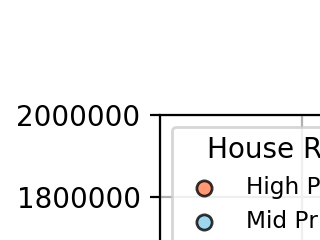

In [49]:
# Build the scatter plots for each city types
plt.scatter(high_h_value, 
            high_h_fare, 
            s=10*high_h_count, c="coral", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="High Price House")

plt.scatter(Mid_h_value, 
            Mid_h_fare, 
            s=10*Mid_h_count, c="skyblue", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="Mid Price House")

plt.scatter(Low_h_value, 
            Low_h_fare, 
            s=10*Low_h_count, c="gold", 
            edgecolor="black", linewidths=1, marker="o", 
            alpha=0.8, label="Low Price House")

# Incorporate the other graph properties
plt.title("Healthy Restaurant vs House Price (2018)")
plt.ylabel("Average Restaurant Rating ")
plt.xlabel("Average House Price (Per Range)")
plt.grid(True)

# Create a legend
lgnd = plt.legend(fontsize="small", mode="Expanded", 
                  numpoints=1, scatterpoints=1, 
                  loc="best", title="House Ranking", 
                  labelspacing=0.5)
lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
lgnd.legendHandles[2]._sizes = [30]

# Incorporate a text label regarding circle size
#plt.text(42, 35, "Note:\nCircle size correlates with driver count per city.")

# Save Figure
plt.savefig("Fig1.png")

# Show plot
plt.show()

In [50]:
new_merge_city=new_merge['RegionName']

In [51]:
new_merge_price=new_merge['2018-05']


In [52]:
new_merge_price

0      714700.0
37     633200.0
42     927000.0
43     422000.0
44     921500.0
45     866700.0
53     571700.0
57     572400.0
58     480100.0
59    2665300.0
70     580200.0
71    1197400.0
77    1282500.0
78     814400.0
79     683900.0
80     742700.0
81    1317500.0
90    1764600.0
94     701700.0
95    1979800.0
Name: 2018-05, dtype: float64

In [53]:
new_merge_count=new_merge['counts']

In [54]:
new_merge_count

0     4186
37     634
42      23
43       1
44      33
45    1405
53      14
57       3
58      46
59    1380
70      27
71     507
77      26
78      21
79       3
80       9
81    1002
90      54
94       7
95     464
Name: counts, dtype: int64

<IPython.core.display.Javascript object>


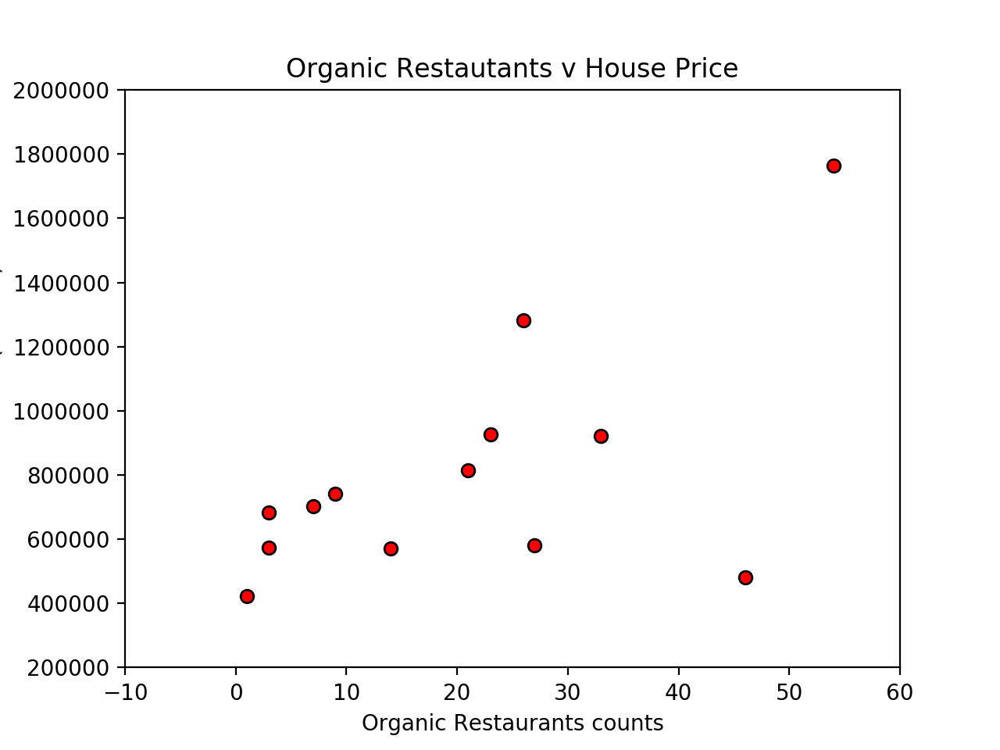

In [57]:
# Tell matplotlib to create a scatter plot based upon the above data
# Tell matplotlib to create a scatter plot based upon the above data
plt.scatter(new_merge_count, new_merge_price, marker="o", facecolors="red", edgecolors="black")
plt.xlim(-10,60)
plt.ylim(200000,2000000)
# Create a title, x label, and y label for our chart
plt.title("Organic Restautants v House Price")
plt.xlabel("Organic Restaurants counts")
plt.ylabel("House Price (Dollars)")


plt.savefig("Restaurant_house_value_count.png")

In [56]:

plt.show()
